# This notebook loads results from a hyperparameter grid search and makes some performance metric plots

In [1]:
%matplotlib inline

In [2]:
import numpy as np
from glob import glob 
import pickle
import h5py
import inspect
import astropy
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import seaborn.apionly as sns
import pandas as pd
import healpy as hp
from icecube import astro
from matplotlib import cm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from scipy.integrate import quad

from numpy.lib.recfunctions import append_fields

import matplotlib as mpl
plt.style.use('/home/apizzuto/Nova/scripts/novae_plots.mplstyle')
palette = sns.color_palette('colorblind')

/home/apizzuto/.venvs/py3_realtime/lib/python3.7/site-packages/seaborn/apionly.py:9: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)


In [3]:
def mids(arr):
    return arr[:-1] + (np.diff(arr) / 2.)

********************************************************************************
log: True	 standardized: False	 minsample: 1000
********************************************************************************


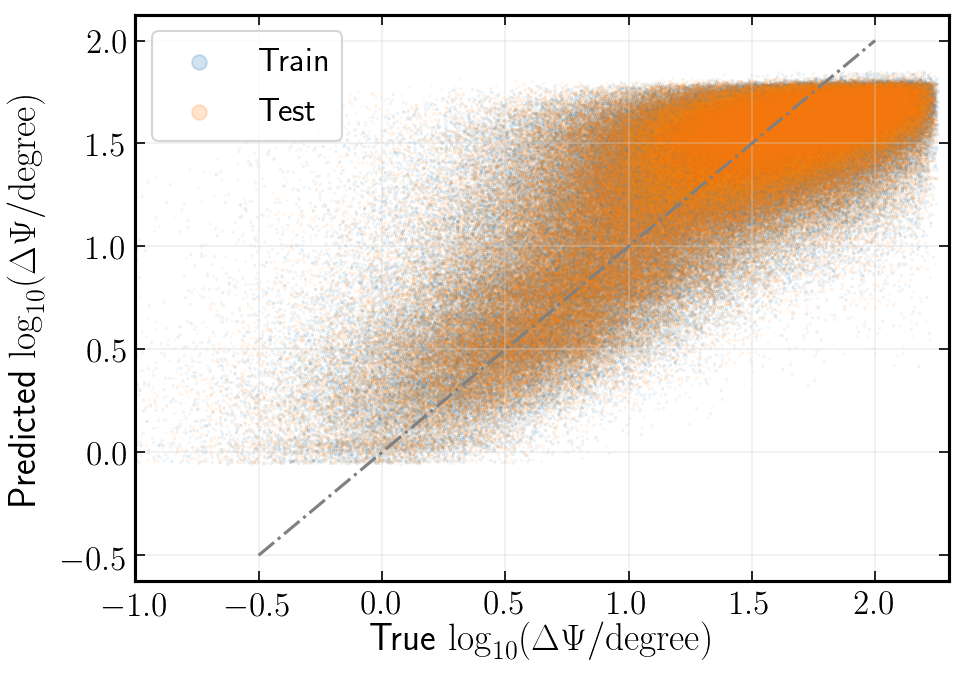

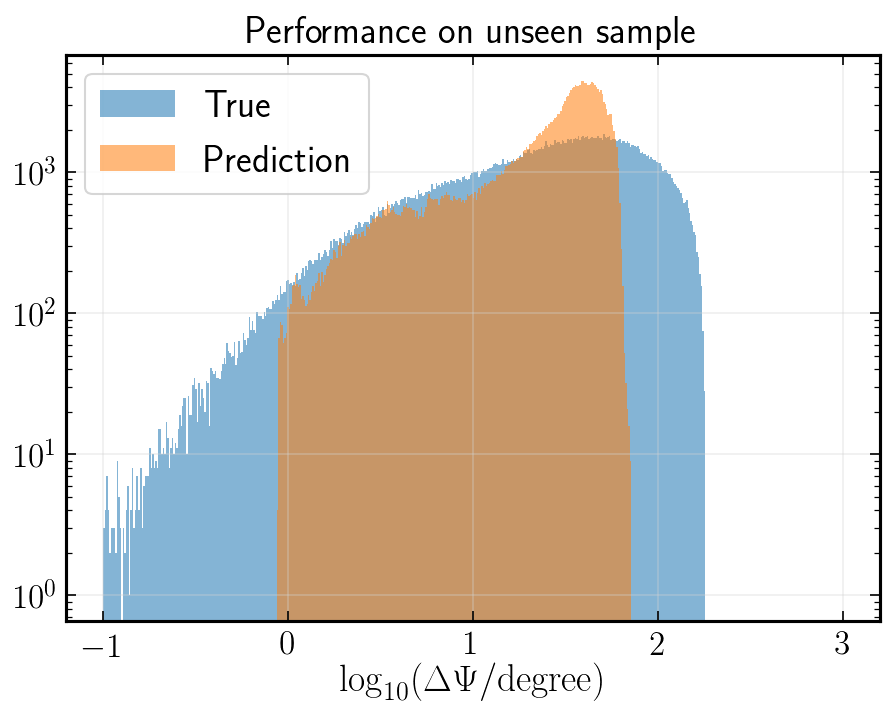

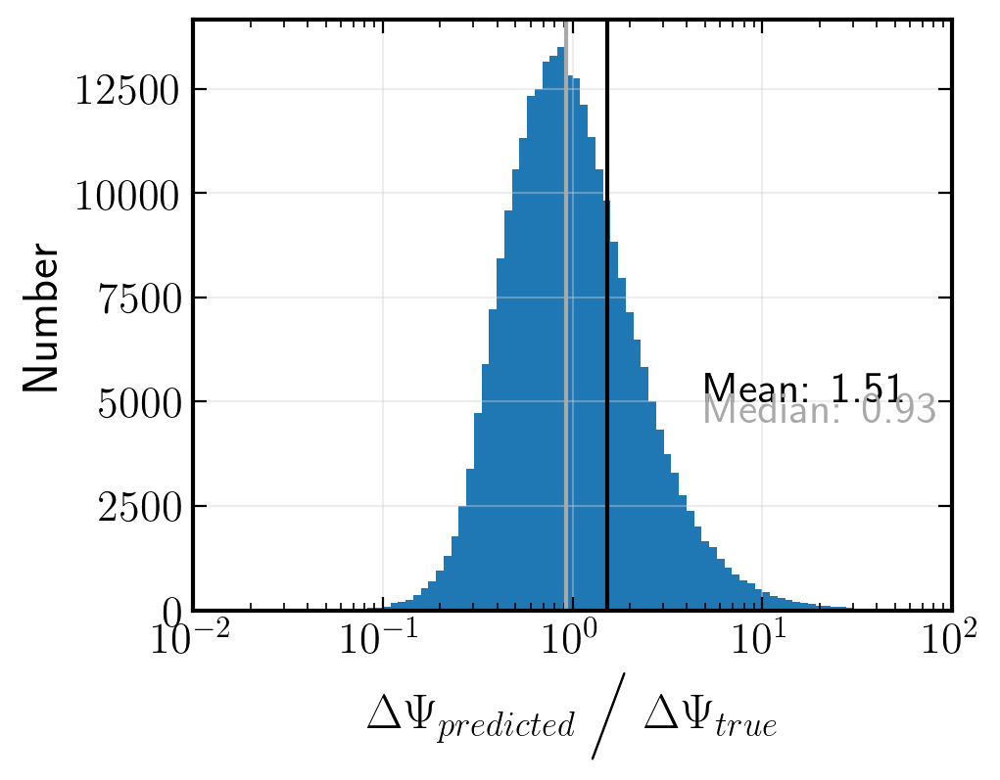

Ratio within factor of 2: 0.6288731805101302
Ratio within factor of 5: 0.9518173979794158


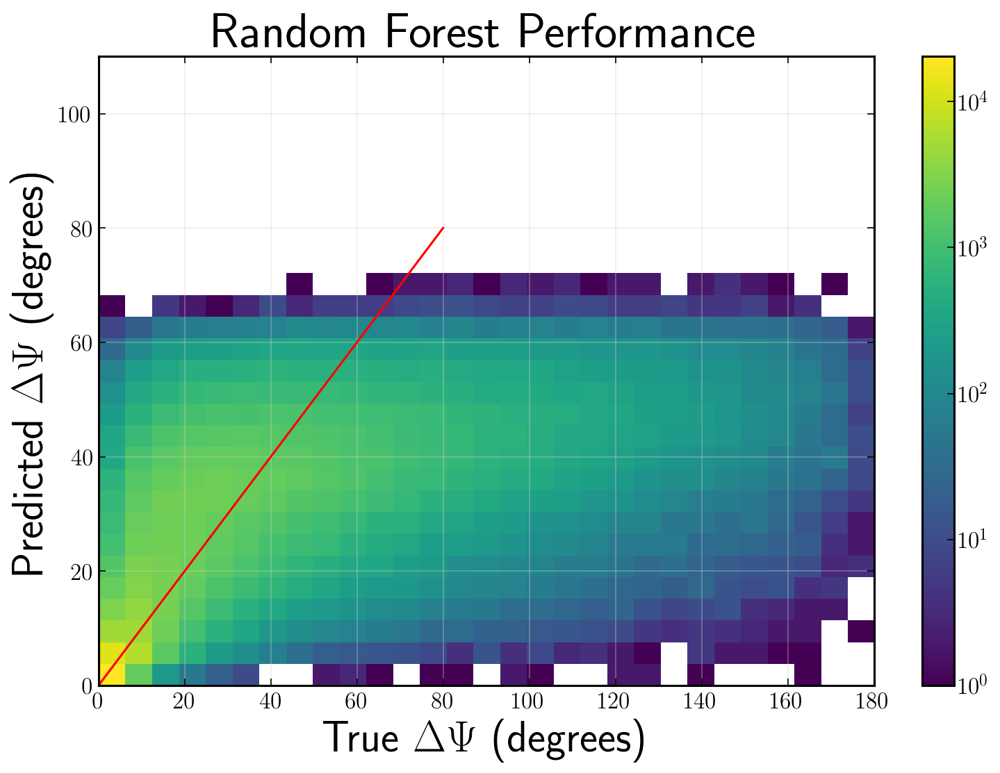

********************************************************************************
log: True	 standardized: False	 minsample: 10000
********************************************************************************


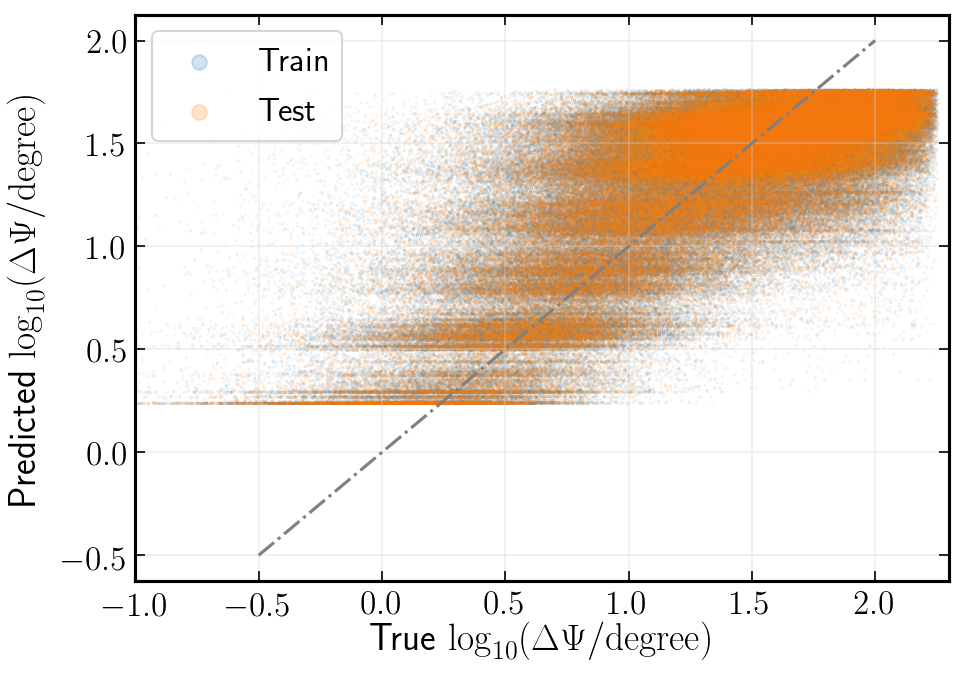

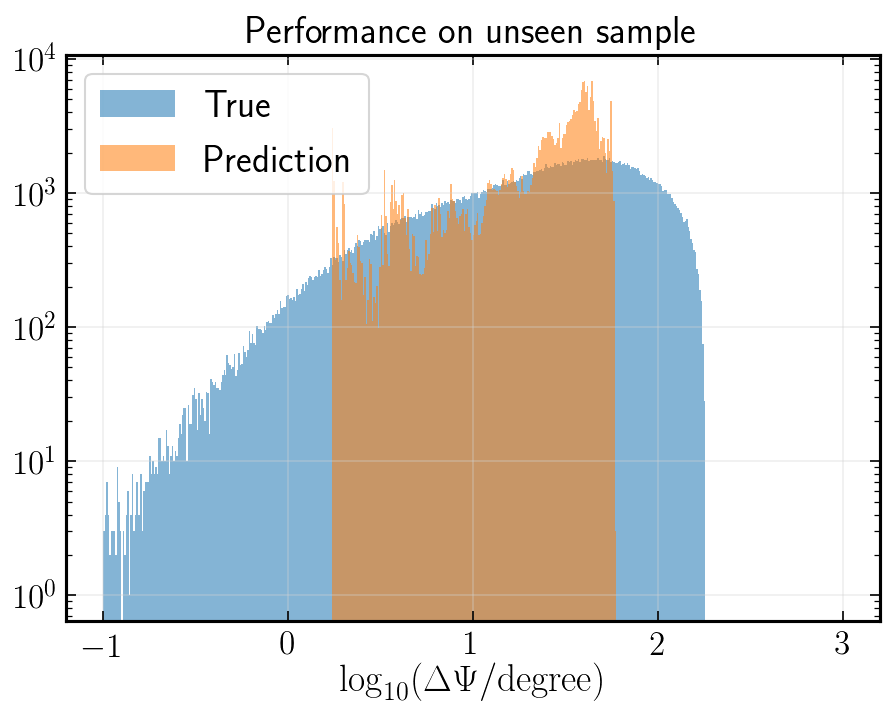

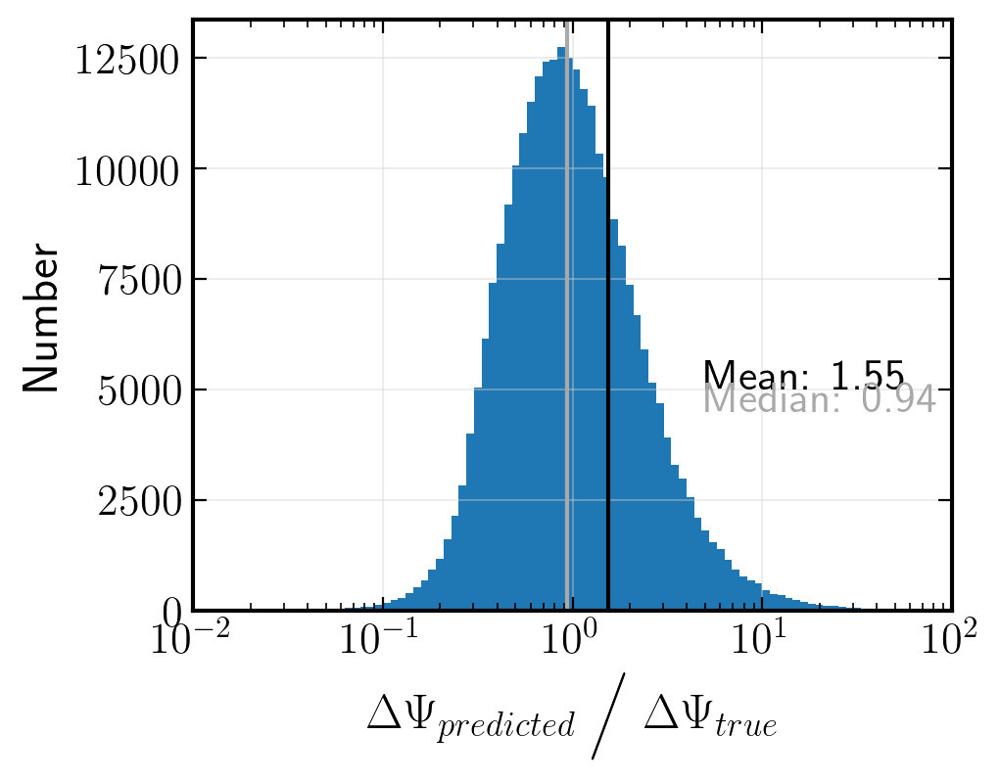

Ratio within factor of 2: 0.608384993742542
Ratio within factor of 5: 0.9444832503856341


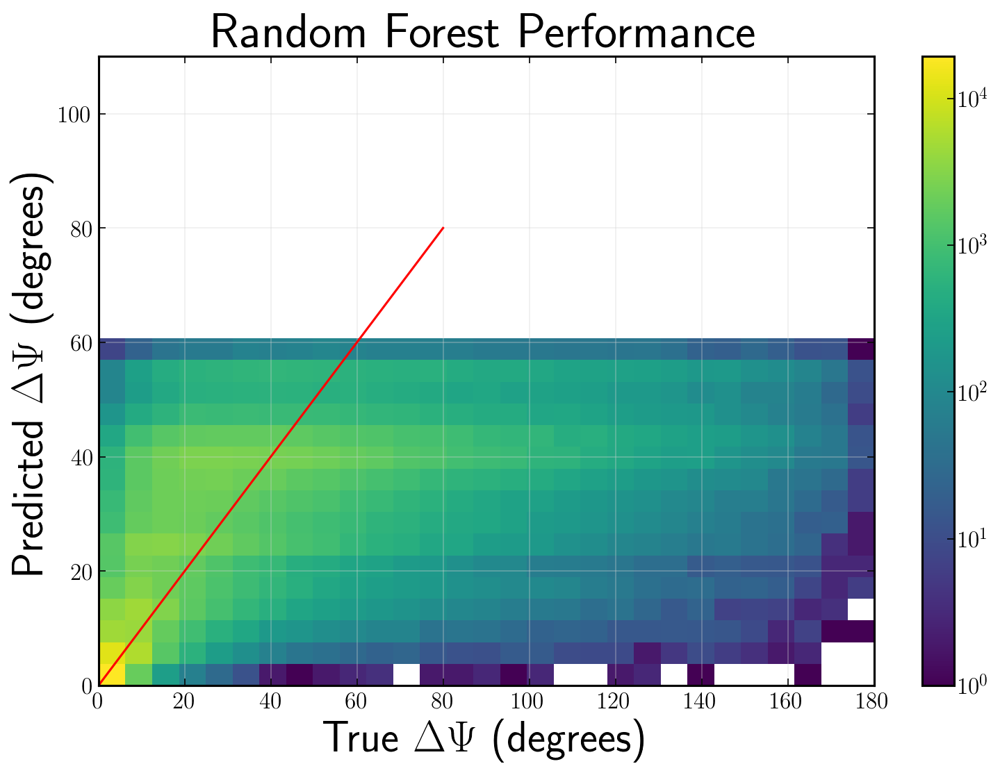

********************************************************************************
log: True	 standardized: False	 minsample: 100000
********************************************************************************


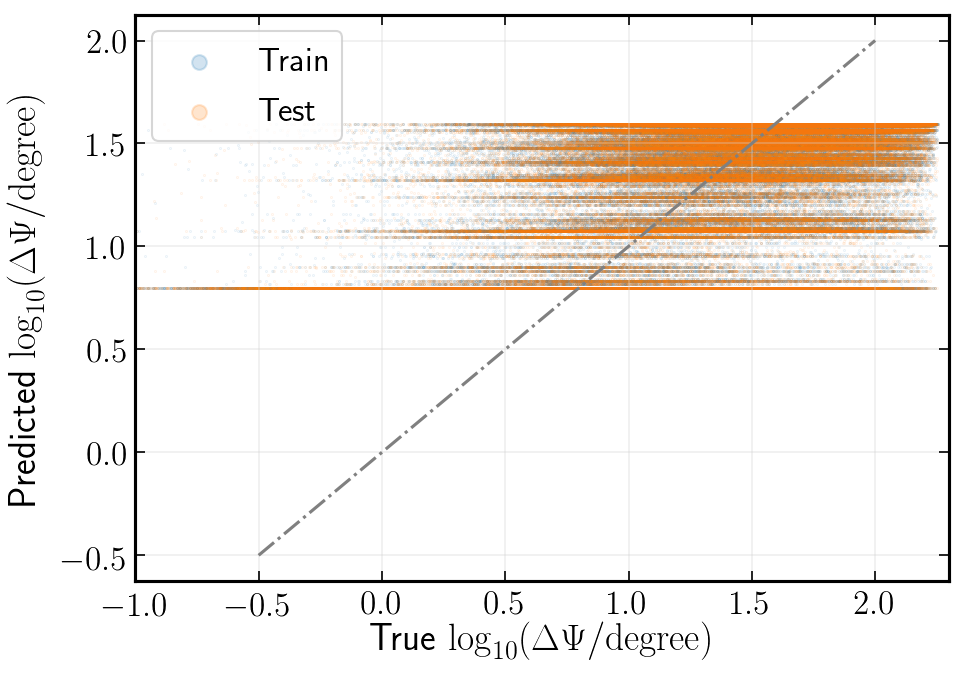

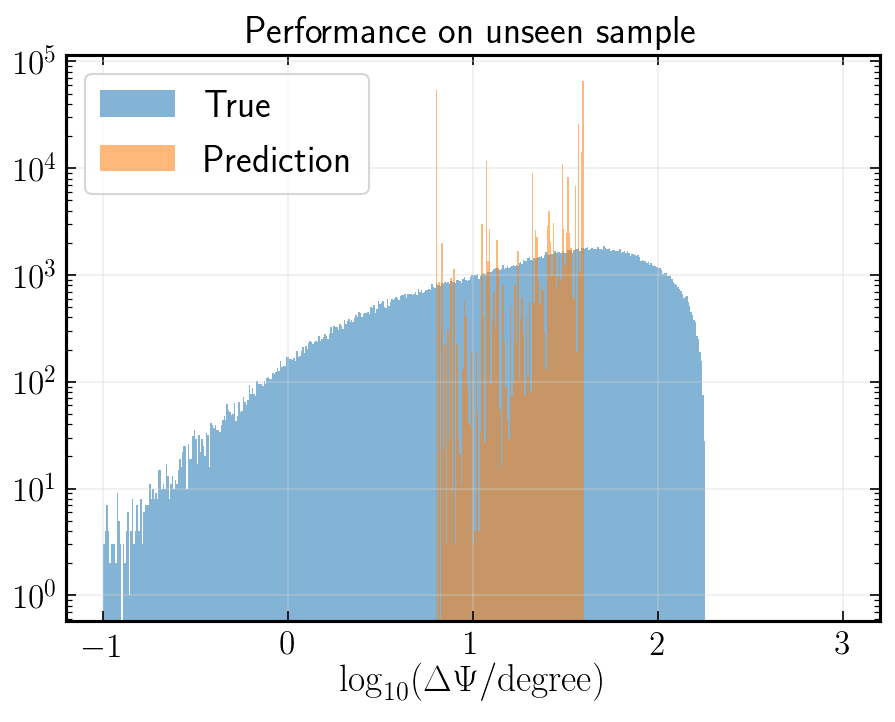

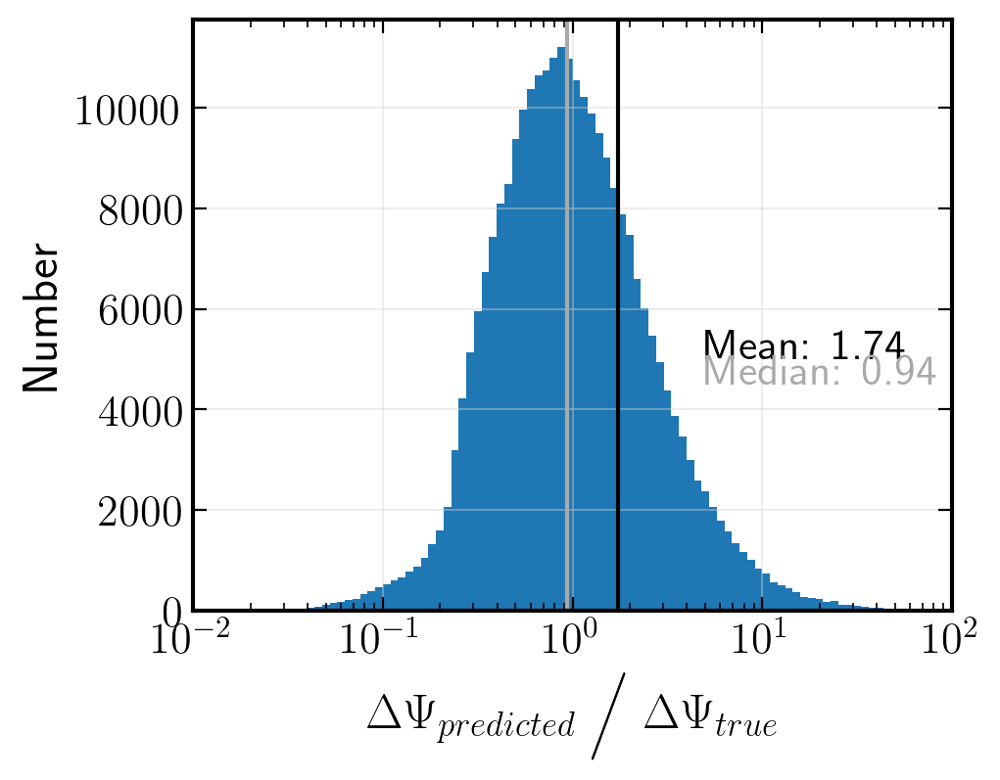

Ratio within factor of 2: 0.5450265761029719
Ratio within factor of 5: 0.9111255825459943


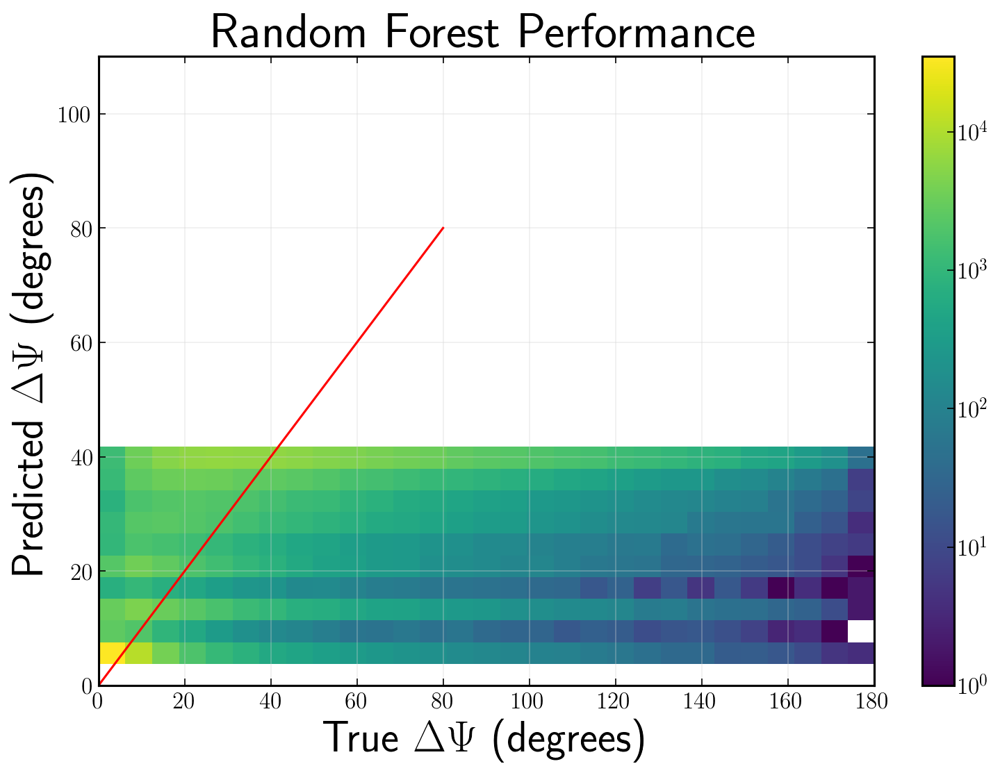

FileNotFoundError: [Errno 2] No such file or directory: '/data/user/apizzuto/Nova/RandomForests/v2.4/GridSearchResults_logSeparation_False_bootstrap_True_minsamples_1000'

In [8]:
standardize = False
for logSeparation in [True, False]:
    #for standardize in [True, False]:
    for minsamp in [1000, 10000, 100000]: #[10, 100, 1000, 10000, 100000]:

        neutrinos = np.load('/data/user/apizzuto/Nova/GRECO_Skylab_Dataset/v2.4/IC86_2012.numu_merged_with_delta_psi.npy')
        #neutrinos = np.load('/data/user/apizzuto/Nova/RandomForests/IC86_2012-2018MC_with_dpsi_with_Nstring.npy')
        neutrinos_df = pd.DataFrame.from_dict(neutrinos)
        neutrinos_df = neutrinos_df[np.abs(neutrinos_df['ptype']) == 14]

        neutrinos_df['int_type'] = np.where(neutrinos_df['iscc'] == False, 'NC', 'CC')
        neutrinos_df = neutrinos_df.drop(['run', 'event', 'subevent', 'angErr', 'trueE', 'azi', 'monopod_azi',
                                          'trueRa', 'trueDec', 'time', 'ptype', 'iscc',
                                          #'trueDeltaLLH', 
                                          'ra', 'dec', 'monopod_ra', 'monopod_dec', 'ow',
                                          'conv', 'astro', 'prompt'], axis = 'columns')
        old_names = neutrinos_df.columns
        new_names = [on.replace('_', ' ') for on in old_names]
        neutrinos_df.columns = new_names

        neutrinos_df = neutrinos_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
        scaled_nus = neutrinos_df.copy()
        if logSeparation:
            scaled_nus['true dpsi'] = np.log10(neutrinos_df['true dpsi'])
        else:
            scaled_nus['true dpsi'] = neutrinos_df['true dpsi']
        scaled_nus['monopod zen'] = np.cos(neutrinos_df['monopod zen'])
        scaled_nus['zen'] = np.cos(neutrinos_df['zen'])
        scaled_nus['pidMonopodLLH'] = np.log10(neutrinos_df['pidMonopodLLH'])
        #scaled_nus['monopod pegleg dpsi'] = np.power(neutrinos_df['monopod pegleg dpsi'], 0.5)
        #scaled_nus['pidLength'] = np.where(neutrinos_df['pidLength'] > 0., np.log10(neutrinos_df['pidLength']), 0.)
        scaled_nus = scaled_nus.drop(['int type'], axis = 'columns')

        neutrinos_df = scaled_nus.copy()

        feature_cols = list(neutrinos_df.keys())
        feature_cols.remove('true dpsi')

        X,y = neutrinos_df[feature_cols].values, neutrinos_df['true dpsi'].values

        X_train, X_test, y_train, y_test =  train_test_split(X, y,
                                                             test_size=0.5,
                                                             random_state=1)

        if standardize:
            stdsc = StandardScaler()
            X_train = stdsc.fit(X_train).transform(X_train)
            X_test = stdsc.transform(X_test)
        #CHANGE THIS TO THE NEW PATHS
        CVresults = pickle.load(open('/data/user/apizzuto/Nova/RandomForests/v2.4/GridSearchResults_logSeparation_{}_bootstrap_True_minsamples_{}'.format(logSeparation, minsamp), 'rb'))
        best_forest = CVresults.best_estimator_
        print("*"*80)
        print("log: {}\t standardized: {}\t minsample: {}".format(logSeparation, standardize, minsamp))
        #print ("\n\nTraining model")
        print("*"*80)
        #best_forest.fit(X_train, y_train)
        y_train_pred = best_forest.predict(X_train)
        y_test_pred = best_forest.predict(X_test)

        fig, ax = plt.subplots(figsize = (7,5), dpi=150)

        if logSeparation:
            plt.scatter(np.log10((10.**y_train) * 180. / np.pi), np.log10((10.**y_train_pred)*180. / np.pi), s = 0.04, 
                        alpha = 0.2, label = 'Train')
            plt.scatter(np.log10((10.**y_test) * 180. / np.pi), np.log10((10.**y_test_pred)*180. / np.pi), s = 0.04, 
                        alpha = 0.2, label = 'Test')
        else:
            plt.scatter( np.log10(y_train * 180. / np.pi), np.log10(y_train_pred*180. / np.pi), s = 0.04, 
                        alpha = 0.2, label = 'Train')
            plt.scatter(np.log10(y_test * 180. / np.pi), np.log10(y_test_pred*180. / np.pi), s = 0.04, 
                        alpha = 0.2, label = 'Test')

        plt.plot(np.linspace(-0.5, 2., 500), np.linspace(-0.5, 2., 500), ls = '-.', c = 'gray')
        plt.xlim(-1, 2.3)
        lgnd = plt.legend(loc=2, fontsize=16)
        plt.xlabel(r'True $\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 18)
        plt.ylabel(r'Predicted $\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 18)

        lgnd.legendHandles[0]._sizes = [50]
        lgnd.legendHandles[1]._sizes = [50]
        plt.show()

        plt.figure(figsize = (7,5), dpi=150)
        x_vals = np.linspace(-1,3.0,500)
        if logSeparation:
            plt.hist(np.log10((10.**y_test)*180. / np.pi), bins = x_vals, alpha = 0.55, label = "True")
            plt.hist(np.log10((10.**y_test_pred)*180. / np.pi), bins = x_vals, alpha = 0.55, label = "Prediction")
        else: 
            plt.hist(np.log10(y_test* 180. / np.pi), bins = x_vals, alpha = 0.55, label = "True")
            plt.hist(np.log10(y_test_pred* 180. / np.pi), bins = x_vals, alpha = 0.55, label = "Prediction")
        plt.legend(loc = 2, fontsize = 18)
        plt.yscale('log')
        plt.xlabel(r'$\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 18)
        plt.title("Performance on unseen sample", fontsize = 18)
        plt.show()

        if logSeparation:
            residual_quotient = np.power(10, y_test_pred) / np.power(10, y_test)
        else:
            residual_quotient = y_test_pred / y_test
        f = plt.figure(figsize=(5,4), dpi=200)

        h = plt.hist(residual_quotient, bins = np.logspace(-3.,3.,151))

        mean = np.mean(residual_quotient)
        median = np.median(residual_quotient)

        plt.axvline(mean, color = 'k')
        plt.axvline(median, color = 'darkgrey')
        plt.text(5e0, 5000, 'Mean: {:.2f}'.format(mean), color = 'k')
        plt.text(5e0, 4500., 'Median: {:.2f}'.format(median), color = 'darkgrey')

        #plt.yscale('log')
        plt.xlabel("$ \Delta\Psi_{predicted} \; \Bigg/ \; \Delta\Psi_{true}$")
        plt.xscale('log')
        plt.ylabel('Number')
        plt.xlim(1e-2, 1e2)
        plt.show()

        mask = h[1] < 0.5
        mask += h[1] > 2.
        mask = ~mask
        hist = np.append(h[0][0], h[0])
        print("Ratio within factor of 2: {}".format(np.sum(hist[mask]) / np.sum(h[0])))

        mask = h[1] < 0.2
        mask += h[1] > 5.
        mask = ~mask

        hist = np.append(h[0][0], h[0])
        print("Ratio within factor of 5: {}".format(np.sum(hist[mask]) / np.sum(h[0])))

        f = plt.figure(figsize=(12,8), dpi=150)
        ax = f.add_subplot(111)

        if logSeparation:
            cax = ax.hist2d(np.power(10,y_test)*180. / np.pi, np.power(10, y_test_pred)*180. / np.pi, 
                   bins = [np.linspace(0,180.,30), np.linspace(0,110,30)], 
                    cmap = 'viridis', norm=LogNorm())
        else:
            cax = ax.hist2d(y_test*180. / np.pi, y_test_pred*180. / np.pi, 
                   bins = [np.linspace(0,180.,30), np.linspace(0,110,30)], 
                    cmap = 'viridis', norm=LogNorm())
        ax.plot(np.linspace(0., 80., 100), np.linspace(0., 80., 100), color = 'r')
        ax.set_title('Random Forest Performance', fontsize = 34)
        plt.xlabel(r'True $\Delta\Psi$ (degrees)', fontsize = 30)
        plt.ylabel(r'Predicted $\Delta\Psi$ (degrees)', fontsize = 30)
        plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4])
        plt.show()

# Okay, we found the best model. Load it one more time and make final performance plots

In [4]:
logSeparation = True
minsamp = 100
standardize = False

neutrinos = np.load('/data/user/apizzuto/Nova/GRECO_Skylab_Dataset/v2.2/IC86_2012.numu_with_delta_psi.npy')
#neutrinos = np.load('/data/user/apizzuto/Nova/RandomForests/IC86_2012-2018MC_with_dpsi_with_Nstring.npy')
neutrinos_df = pd.DataFrame.from_dict(neutrinos)
neutrinos_df = neutrinos_df[np.abs(neutrinos_df['ptype']) == 14]

neutrinos_df['int_type'] = np.where(neutrinos_df['iscc'] == False, 'NC', 'CC')
neutrinos_df = neutrinos_df.drop(['run', 'event', 'subevent', 'angErr', 'trueE', 'azi', 'monopod_azi',
                                          'trueRa', 'trueDec', 'time', 'ptype', 'iscc',
                                          #'trueDeltaLLH', 
                                          'ra', 'dec', 'monopod_ra', 'monopod_dec', 'ow',
                                          'conv', 'astro', 'prompt'], axis = 'columns')
old_names = neutrinos_df.columns
new_names = [on.replace('_', ' ') for on in old_names]
neutrinos_df.columns = new_names

neutrinos_df = neutrinos_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
scaled_nus = neutrinos_df.copy()
if logSeparation:
    scaled_nus['true dpsi'] = np.log10(neutrinos_df['true dpsi'])
else:
    scaled_nus['true dpsi'] = neutrinos_df['true dpsi']
scaled_nus['monopod zen'] = np.cos(neutrinos_df['monopod zen'])
scaled_nus['zen'] = np.cos(neutrinos_df['zen'])
scaled_nus['pidMonopodLLH'] = np.log10(neutrinos_df['pidMonopodLLH'])
#scaled_nus['monopod pegleg dpsi'] = np.power(neutrinos_df['monopod pegleg dpsi'], 0.5)
#scaled_nus['pidLength'] = np.where(neutrinos_df['pidLength'] > 0., np.log10(neutrinos_df['pidLength']), 0.)
scaled_nus = scaled_nus.drop(['int type'], axis = 'columns')

neutrinos_df = scaled_nus.copy()

feature_cols = list(neutrinos_df.keys())
feature_cols.remove('true dpsi')

X,y = neutrinos_df[feature_cols].values, neutrinos_df['true dpsi'].values

X_train, X_test, y_train, y_test =  train_test_split(X, y,
                                                     test_size=0.5,
                                                     random_state=1)

if standardize:
    stdsc = StandardScaler()
    X_train = stdsc.fit(X_train).transform(X_train)
    X_test = stdsc.transform(X_test)
    X = stdsc.transform(X)
CVresults = pickle.load(open('/data/user/apizzuto/Nova/RandomForests/v2.2/GridSearchResults_logSeparation_{}_bootstrap_True_minsamples_{}'.format(logSeparation, minsamp)))
best_forest = CVresults.best_estimator_

In [5]:
CVresults.best_params_

{'bootstrap': True,
 'max_depth': 16,
 'max_features': 6,
 'min_samples_split': 100,
 'n_estimators': 300}

## Depending on the optimal hyperparameters, the next cell might take a few minutes

# Get top level performance metrics

In [6]:
y_train_pred = best_forest.predict(X_train)
y_test_pred = best_forest.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 0.103, test: 0.121
R^2 train: 0.636, test: 0.572


# Make more in depth performance plots

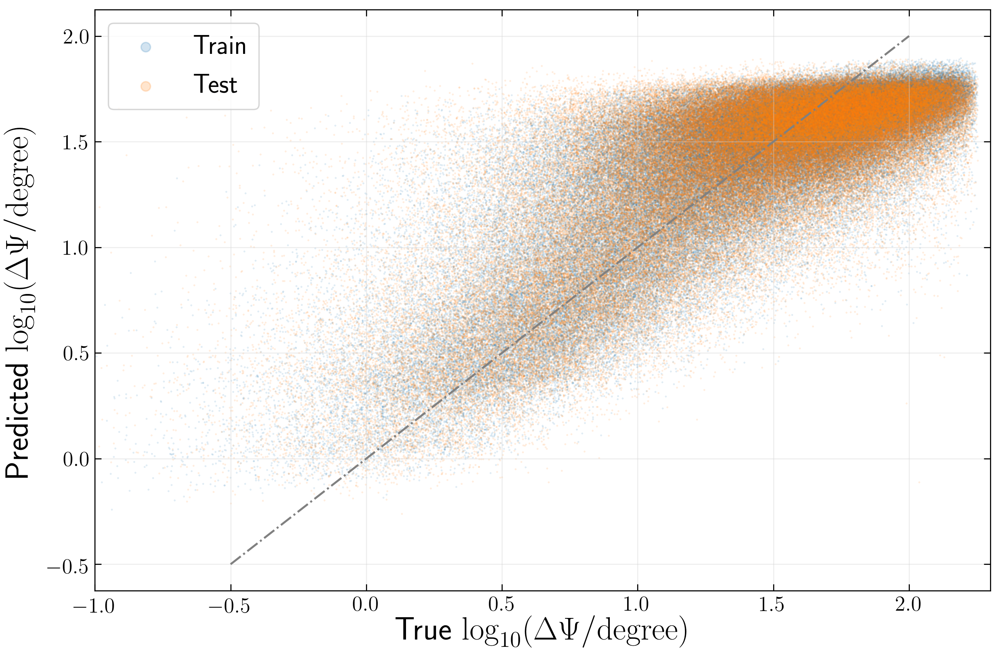

In [13]:
fig, ax = plt.subplots(figsize = (12,8), dpi=250)

if logSeparation:
    plt.scatter(np.log10((10.**y_train) * 180. / np.pi), np.log10((10.**y_train_pred)*180. / np.pi), s = 0.1, 
                alpha = 0.2, label = 'Train')
    plt.scatter(np.log10((10.**y_test) * 180. / np.pi), np.log10((10.**y_test_pred)*180. / np.pi), s = 0.1, 
                alpha = 0.2, label = 'Test')
else:
    print 'You were too lazy to implement this part'
    
plt.plot(np.linspace(-0.5, 2., 500), np.linspace(-0.5, 2., 500), ls = '-.', c = 'gray')
plt.xlim(-1, 2.3)
lgnd = plt.legend(loc=2, fontsize=20)
plt.xlabel(r'True $\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 24)
plt.ylabel(r'Predicted $\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 24)

lgnd.legendHandles[0]._sizes = [50]
lgnd.legendHandles[1]._sizes = [50]
plt.show()

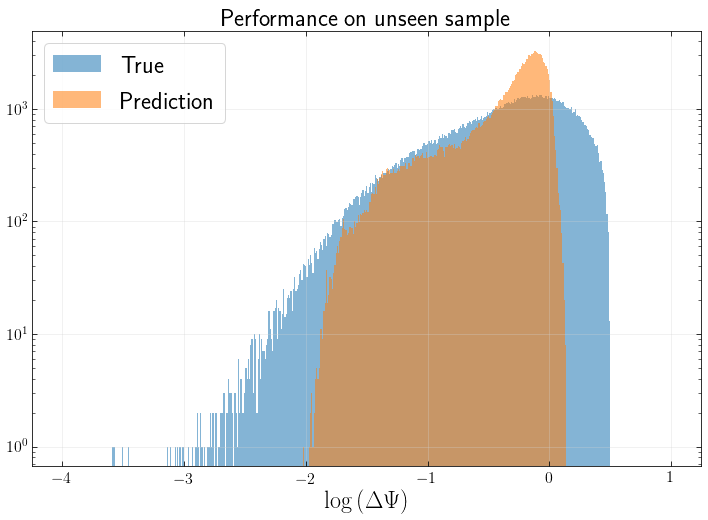

In [14]:
plt.figure(figsize = (12,8))
x_vals = np.linspace(-4,1,500)
plt.hist(y_test, bins = x_vals, alpha = 0.55, label = "True")
#plt.hist(y_train, bins = x_vals, alpha = 0.55, label = "True")
plt.hist(y_test_pred, bins = x_vals, alpha = 0.55, label = "Prediction")
#plt.hist(y_train_pred, bins = x_vals, alpha = 0.55, label = "Prediction")
plt.legend(loc = 2, fontsize = 24)
plt.yscale('log')
plt.xlabel(r'$\log\Big( \Delta\Psi\Big)$', fontsize = 24)
plt.title("Performance on unseen sample", fontsize = 24)
plt.show()

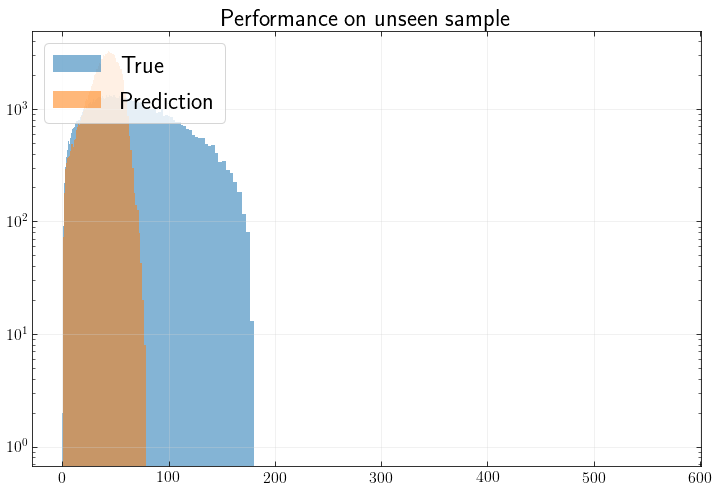

In [15]:
plt.figure(figsize = (12,8))
x_vals = (10.**np.linspace(-4,1,500)) * 180. / np.pi
plt.hist((10.**y_test) * 180. / np.pi, bins = x_vals, alpha = 0.55, label = "True")
#plt.hist(y_train, bins = x_vals, alpha = 0.55, label = "True")
plt.hist((10.**y_test_pred) * 180. / np.pi, bins = x_vals, alpha = 0.55, label = "Prediction")
#plt.hist(y_train_pred, bins = x_vals, alpha = 0.55, label = "Prediction")
plt.legend(loc = 2, fontsize = 24)
plt.yscale('log')
#plt.xlabel(r'$\log\Big( \Delta\Psi\Big)$', fontsize = 24)
plt.title("Performance on unseen sample", fontsize = 24)
plt.show()

In [16]:
print np.median((10.**y_test) * 180. / np.pi)
print np.median((10.**y_test_pred) * 180. / np.pi)
print np.median((10.**y_train) * 180. / np.pi)
print np.median((10.**y_train_pred) * 180. / np.pi)

28.630260402486698
31.820203123186914
28.557950318175198
31.806730278026347


NameError: name 'y_all' is not defined

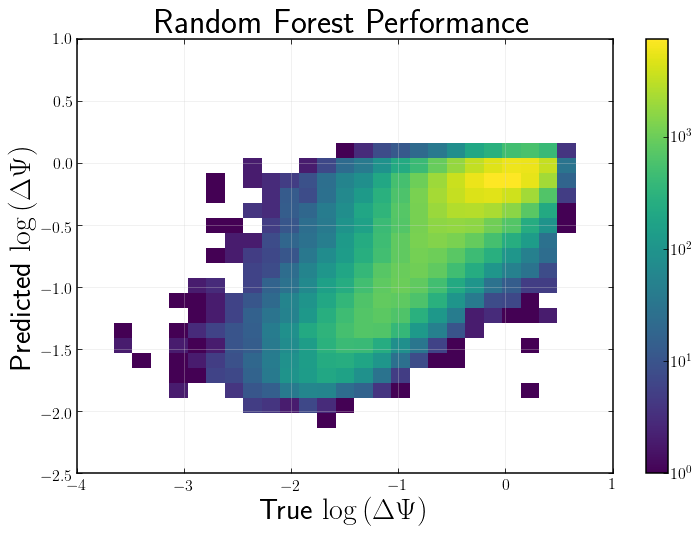

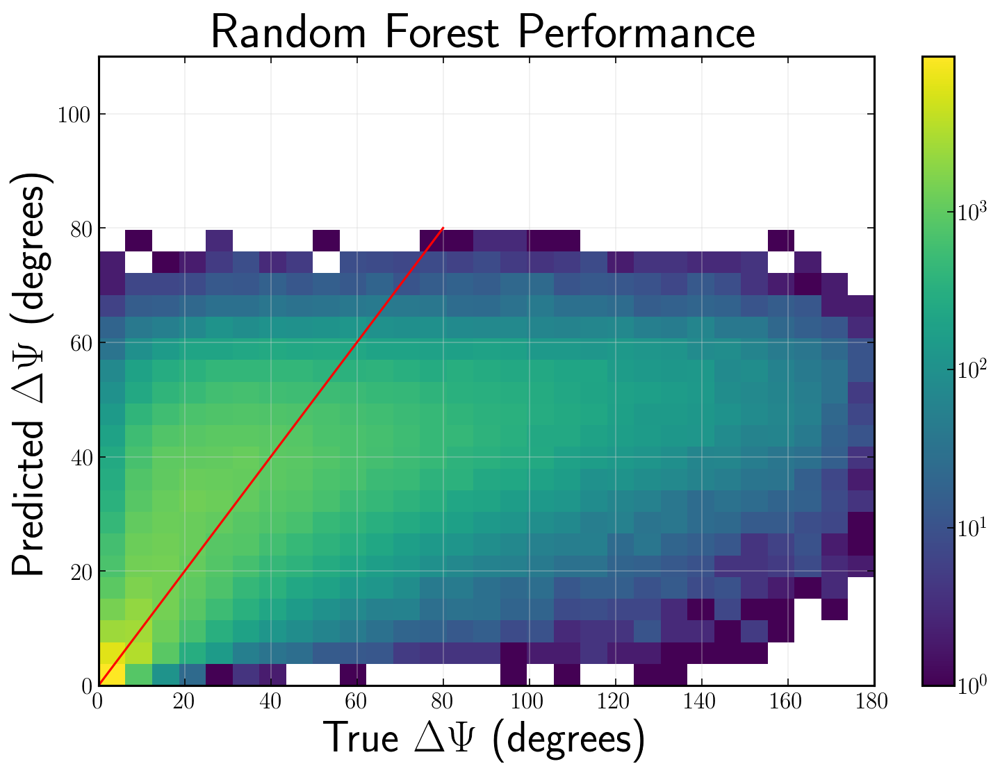

In [7]:
f = plt.figure(figsize=(12,8))
ax = f.add_subplot(111)
cax = ax.hist2d(y_test, y_test_pred, 
       bins = [np.linspace(-4.,1.,30), np.linspace(-2.5,1.,30)], 
        cmap = 'viridis', norm=LogNorm())
ax.set_title('Random Forest Performance', fontsize = 34)
plt.xlabel(r'True $\log\Big( \Delta\Psi\Big)$', fontsize = 30)
plt.ylabel(r'Predicted $\log\Big( \Delta\Psi\Big)$', fontsize = 30)
plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4])

plt.show()


f = plt.figure(figsize=(12,8), dpi=150)
ax = f.add_subplot(111)

cax = ax.hist2d(np.power(10,y_test)*180. / np.pi, np.power(10, y_test_pred)*180. / np.pi, 
       bins = [np.linspace(0,180.,30), np.linspace(0,110,30)], 
        cmap = 'viridis', norm=LogNorm())
ax.plot(np.linspace(0., 80., 100), np.linspace(0., 80., 100), color = 'r')
ax.set_title('Random Forest Performance', fontsize = 34)
plt.xlabel(r'True $\Delta\Psi$ (degrees)', fontsize = 30)
plt.ylabel(r'Predicted $\Delta\Psi$ (degrees)', fontsize = 30)
plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4])
plt.show()

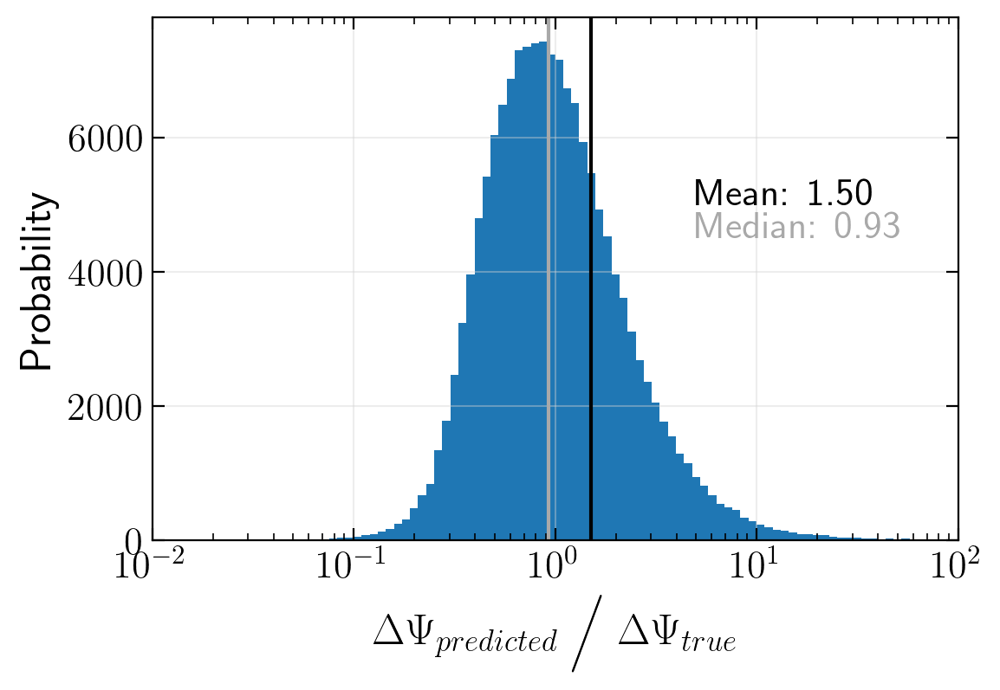

In [18]:
residual_quotient = np.power(10, y_test_pred) / np.power(10, y_test)
f = plt.figure(figsize=(6,4), dpi=200)

h = plt.hist(residual_quotient, bins = np.logspace(-3.,3.,151))

mean = np.mean(residual_quotient)
median = np.median(residual_quotient)

plt.axvline(mean, color = 'k')
plt.axvline(median, color = 'darkgrey')
plt.text(5e0, 5000, 'Mean: {:.2f}'.format(mean), color = 'k')
plt.text(5e0, 4500., 'Median: {:.2f}'.format(median), color = 'darkgrey')

#plt.yscale('log')
plt.xlabel("$ \Delta\Psi_{predicted} \; \Bigg/ \; \Delta\Psi_{true}$")
plt.xscale('log')
plt.ylabel('Probability')
plt.xlim(1e-2, 1e2)
plt.show()

In [19]:
print np.sum(h[0])
mask = h[1] < 0.5
mask += h[1] > 2.
mask = ~mask

hist = np.append(h[0][0], h[0])
print np.sum(hist[mask]) / np.sum(h[0])

mask = h[1] < 0.2
mask += h[1] > 5.
mask = ~mask

hist = np.append(h[0][0], h[0])
print np.sum(hist[mask]) / np.sum(h[0])

152825.0
0.6373302797317193
0.9541436283330607


In [8]:
neutrinos = np.load('/data/user/apizzuto/Nova/GRECO_Skylab_Dataset/v2.2/IC86_2012.numu_with_delta_psi.npy')
#neutrinos = np.load('/data/user/apizzuto/Nova/RandomForests/IC86_2012-2018MC_with_dpsi_with_Nstring.npy')
neutrinos_df = pd.DataFrame.from_dict(neutrinos)
#Now do it on all available flavors
#neutrinos_df = neutrinos_df[np.abs(neutrinos_df['ptype']) == 14]

neutrinos_df['int_type'] = np.where(neutrinos_df['iscc'] == False, 'NC', 'CC')
a = neutrinos_df.columns
a.drop(['run', 'event', 'subevent', 'angErr', 'trueE', 'azi', 'monopod_azi',
                                          'trueRa', 'trueDec', 'time', 'ptype', 'iscc',
                                          #'trueDeltaLLH', 
                                          'ra', 'dec', 'monopod_ra', 'monopod_dec', 'ow',
                                          'conv', 'astro', 'prompt'])

Index([u'nstring', u'nchannel', u'zen', u'logE', u'cascade_energy',
       u'monopod_zen', u'pidDeltaLLH', u'pidPeglegLLH', u'pidMonopodLLH',
       u'pidLength', u'monopod_pegleg_dpsi', u'true_dpsi', u'int_type'],
      dtype='object')

In [9]:
logSeparation = True
standardize = False

#neutrinos = np.load('/data/user/apizzuto/Nova/RandomForests/IC86_2012-2018MC_with_dpsi_with_Nstring.npy')
neutrinos = np.load('/data/user/apizzuto/Nova/GRECO_Skylab_Dataset/v2.2/IC86_2012.numu_with_delta_psi.npy')
neutrinos_df = pd.DataFrame.from_dict(neutrinos)
#Now do it on all available flavors
neutrinos_df = neutrinos_df[np.abs(neutrinos_df['ptype']) == 14]

neutrinos_df['int_type'] = np.where(neutrinos_df['iscc'] == False, 'NC', 'CC')
neutrinos_df = neutrinos_df.drop(['run', 'event', 'subevent', 'angErr', 'trueE', 'azi', 'monopod_azi',
                                          'trueRa', 'trueDec', 'time', 'ptype', 'iscc',
                                          #'trueDeltaLLH', 
                                          'ra', 'dec', 'monopod_ra', 'monopod_dec', 'ow',
                                          'conv', 'astro', 'prompt'], axis = 'columns')
old_names = neutrinos_df.columns
new_names = [on.replace('_', ' ') for on in old_names]
neutrinos_df.columns = new_names

neutrinos_df = neutrinos_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
scaled_nus = neutrinos_df.copy()
if logSeparation:
    scaled_nus['true dpsi'] = np.log10(neutrinos_df['true dpsi'])
else:
    scaled_nus['true dpsi'] = neutrinos_df['true dpsi']
scaled_nus['monopod zen'] = np.cos(neutrinos_df['monopod zen'])
scaled_nus['zen'] = np.cos(neutrinos_df['zen'])
scaled_nus['pidMonopodLLH'] = np.log10(neutrinos_df['pidMonopodLLH'])
#scaled_nus['monopod pegleg dpsi'] = np.power(neutrinos_df['monopod pegleg dpsi'], 0.5)
#scaled_nus['pidLength'] = np.where(neutrinos_df['pidLength'] > 0., np.log10(neutrinos_df['pidLength']), 0.)
scaled_nus = scaled_nus.drop(['int type'], axis = 'columns')

neutrinos_df = scaled_nus.copy()

feature_cols = list(neutrinos_df.keys())
feature_cols.remove('true dpsi')

X,y = neutrinos_df[feature_cols].values, neutrinos_df['true dpsi'].values

X_train, X_test, y_train, y_test =  train_test_split(X, y,
                                                     test_size=0.5,
                                                     random_state=1)

if standardize:
    stdsc = StandardScaler()
    stdsc.fit(X)
    #X_train = stdsc.fit(X_train).transform(X_train)
    X_train = stdsc.transform(X_train)
    X_test = stdsc.transform(X_test)
    X = stdsc.transform(X)

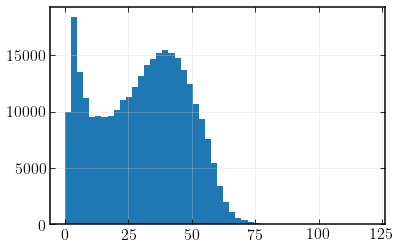

In [10]:
y_pred = best_forest.predict(X)
h = plt.hist((10**y_pred) * 180. / np.pi, bins = np.linspace(0., 120, 51))
plt.show()

In [11]:
y_train_pred = best_forest.predict(X_train)
y_test_pred = best_forest.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))

MSE train: 0.103, test: 0.121
R^2 train: 0.636, test: 0.572


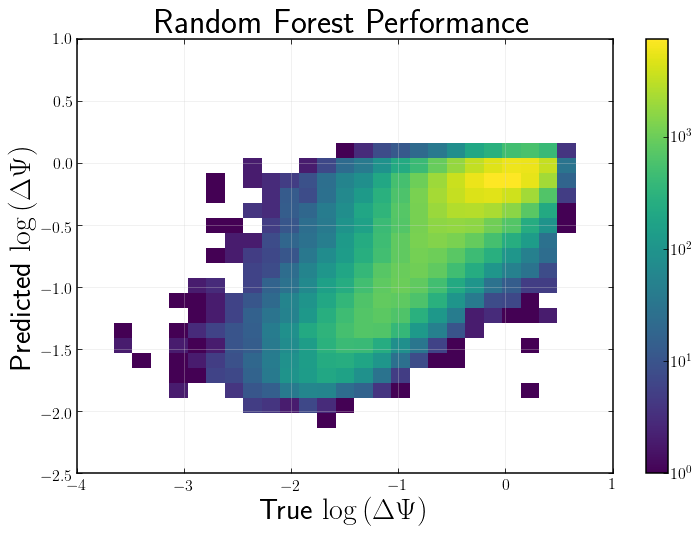

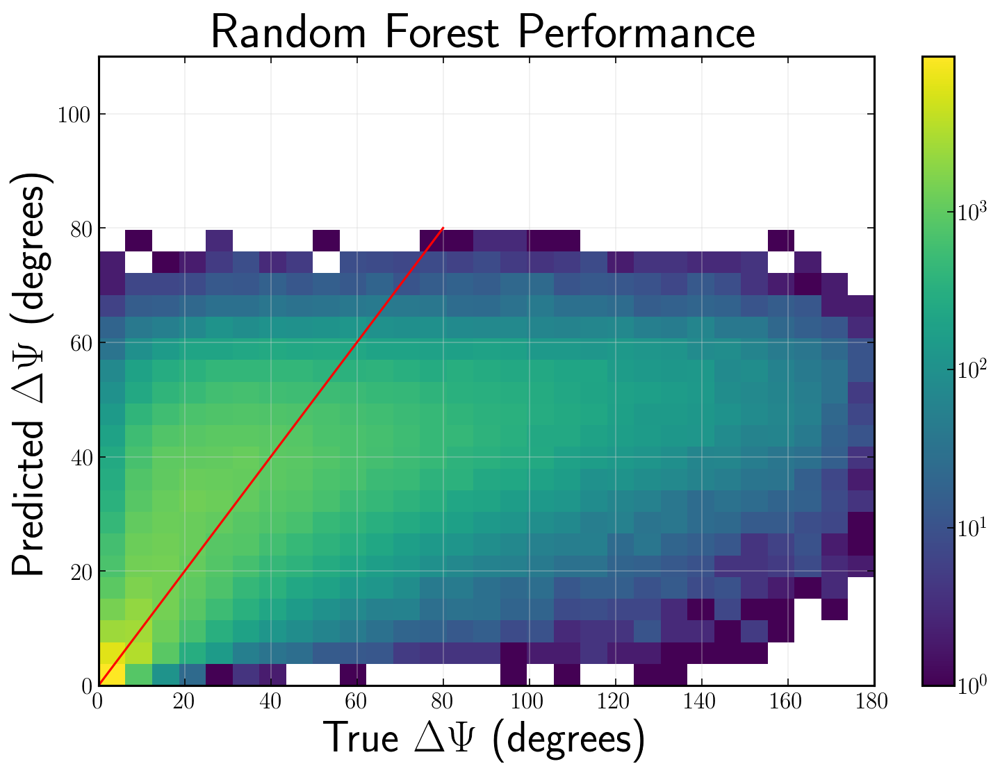

In [12]:
f = plt.figure(figsize=(12,8))
ax = f.add_subplot(111)
cax = ax.hist2d(y_test, y_test_pred, 
       bins = [np.linspace(-4.,1.,30), np.linspace(-2.5,1.,30)], 
        cmap = 'viridis', norm=LogNorm())
ax.set_title('Random Forest Performance', fontsize = 34)
plt.xlabel(r'True $\log\Big( \Delta\Psi\Big)$', fontsize = 30)
plt.ylabel(r'Predicted $\log\Big( \Delta\Psi\Big)$', fontsize = 30)
plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4])

plt.show()


f = plt.figure(figsize=(12,8), dpi=150)
ax = f.add_subplot(111)

cax = ax.hist2d(np.power(10,y_test)*180. / np.pi, np.power(10, y_test_pred)*180. / np.pi, 
       bins = [np.linspace(0,180.,30), np.linspace(0,110,30)], 
        cmap = 'viridis', norm=LogNorm())
ax.plot(np.linspace(0., 80., 100), np.linspace(0., 80., 100), color = 'r')
ax.set_title('Random Forest Performance', fontsize = 34)
plt.xlabel(r'True $\Delta\Psi$ (degrees)', fontsize = 30)
plt.ylabel(r'Predicted $\Delta\Psi$ (degrees)', fontsize = 30)
plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4])
plt.show()

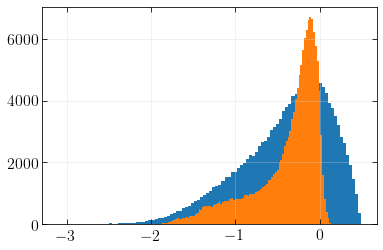

In [26]:
plt.hist(y_train, bins=100)
plt.hist(y_train_pred, bins=100)
plt.show()

In [13]:
#neutrinos = np.load('/data/user/apizzuto/Nova/RandomForests/IC86_2012-2018MC_with_dpsi_with_Nstring.npy')
neutrinos = np.load('/data/user/apizzuto/Nova/GRECO_Skylab_Dataset/v2.2/IC86_2012.numu_with_delta_psi.npy')
nu_df = pd.DataFrame.from_dict(neutrinos)
nu_df = nu_df[np.abs(nu_df['ptype']) == 14]

nu_df['int_type'] = np.where(nu_df['iscc'] == False, 'NC', 'CC')
#nu_df = nu_df.drop(['run', 'event', 'subevent', 'angErr', 'trueE', 'azi', 'monopod_azi',
#                                          'trueRa', 'trueDec', 'time', 'ptype', 'iscc',
#                                          #'trueDeltaLLH', 
#                                          'ra', 'dec', 'monopod_ra', 'monopod_dec', 'ow',
#                                          'conv', 'astro', 'prompt'], axis = 'columns')
old_names = nu_df.columns
new_names = [on.replace('_', ' ') for on in old_names]
nu_df.columns = new_names
nu_df = nu_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)

In [14]:
y_all = best_forest.predict(X)

In [15]:
nu_df['prediction'] = 10.**y_all

In [16]:
nu_df['true dpsi deg'] = nu_df['true dpsi']*180. / np.pi
nu_df['pred dpsi deg'] = nu_df['prediction'] * 180. / np.pi

/home/apizzuto/.venvs/nova/lib/python2.7/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  .format(op=op_str, alt_op=unsupported[op_str]))


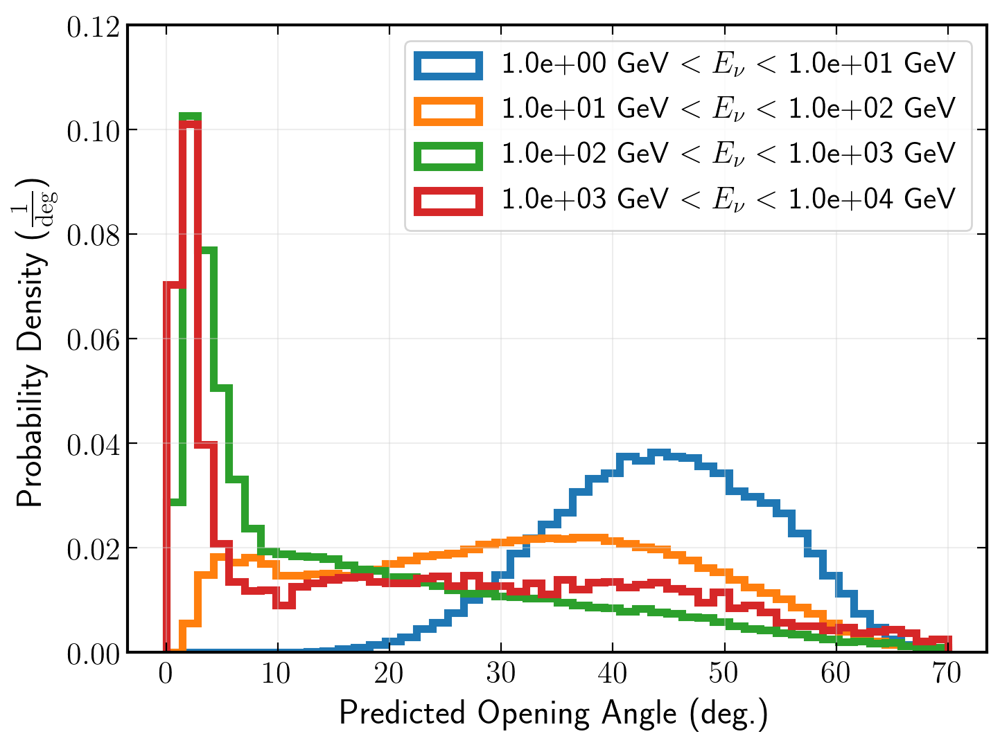

In [17]:
fig, ax = plt.subplots(figsize = (8,6), dpi=200)
e_bins = np.logspace(0., 4., 5)
for le, re in zip(e_bins[:-1], e_bins[1:]):
    msk = nu_df['trueE'] < re
    msk *= nu_df['trueE'] > le
    plt.hist(nu_df['pred dpsi deg'][msk], bins = np.linspace(0., 70., 51), density=True, 
             linewidth = 4., histtype='step', label = '{:.1e} GeV '.format(le) + r'$< E_{\nu} < $' + ' {:.1e} GeV'.format(re))

plt.legend(loc = 1, ncol = 1)
plt.ylabel(r'Probability Density ($\frac{1}{\mathrm{deg}}$)')
plt.xlabel(r'Predicted Opening Angle (deg.)')
plt.ylim(0.00, 0.12)
plt.savefig('/home/apizzuto/public_html/novae/RandomForest_plots/one_d_pdf_slices_true_energy.png',
           bbox_inches='tight', dpi=150)
plt.show()

In [17]:
nu_df.columns

Index([u'run', u'event', u'subevent', u'nstring', u'nchannel', u'time', u'ra',
       u'dec', u'azi', u'zen', u'angErr', u'logE', u'cascade energy',
       u'monopod azi', u'monopod zen', u'pidDeltaLLH', u'pidPeglegLLH',
       u'pidMonopodLLH', u'pidLength', u'trueE', u'trueRa', u'trueDec', u'ow',
       u'conv', u'prompt', u'astro', u'ptype', u'iscc', u'monopod ra',
       u'monopod dec', u'monopod pegleg dpsi', u'true dpsi', u'int type',
       u'prediction', u'true dpsi deg', u'pred dpsi deg'],
      dtype='object')

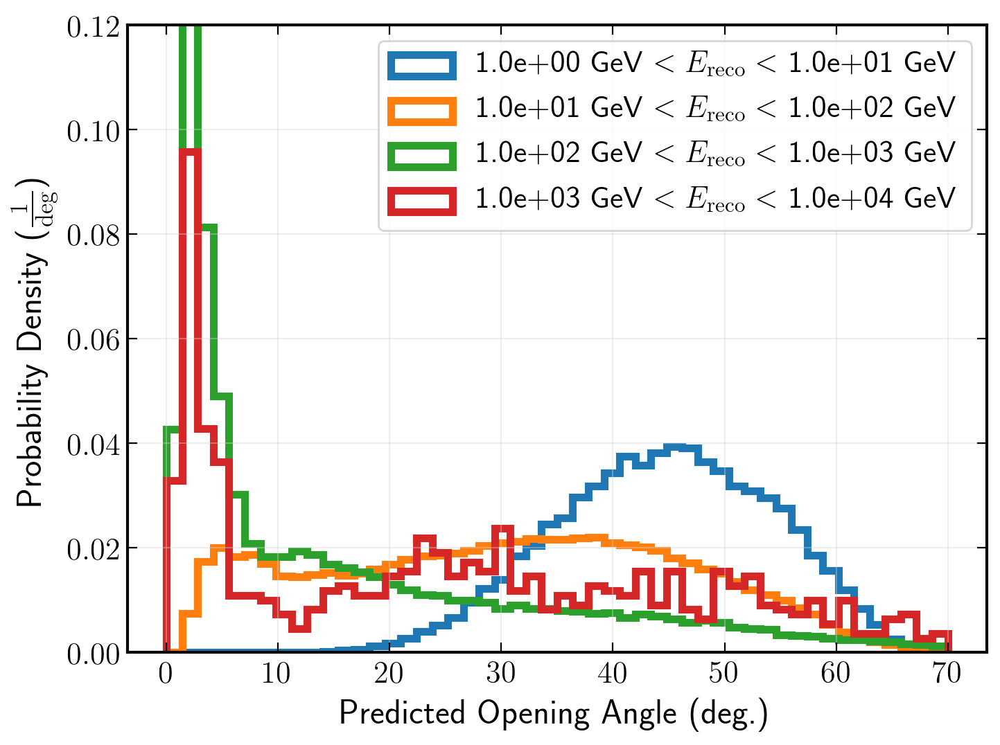

In [18]:
fig, ax = plt.subplots(figsize = (8,6), dpi=200)

e_bins = np.linspace(0., 4., 5)
for le, re in zip(e_bins[:-1], e_bins[1:]):
    msk = nu_df['logE'] < re
    msk *= nu_df['logE'] > le
    plt.hist(nu_df['pred dpsi deg'][msk], bins = np.linspace(0., 70., 51), 
             density=True, linewidth = 4., histtype='step',
            label = '{:.1e} GeV '.format(10.**le) + r'$< E_{\mathrm{reco}} < $' + ' {:.1e} GeV'.format(10.**re))
    
plt.legend(loc = 1, ncol = 1)
plt.ylabel(r'Probability Density ($\frac{1}{\mathrm{deg}}$)')
plt.xlabel(r'Predicted Opening Angle (deg.)')
plt.ylim(0.00, 0.12)
plt.savefig('/home/apizzuto/public_html/novae/RandomForest_plots/one_d_pdf_slices_reco_energy.png',
           bbox_inches='tight', dpi=150)
plt.show()

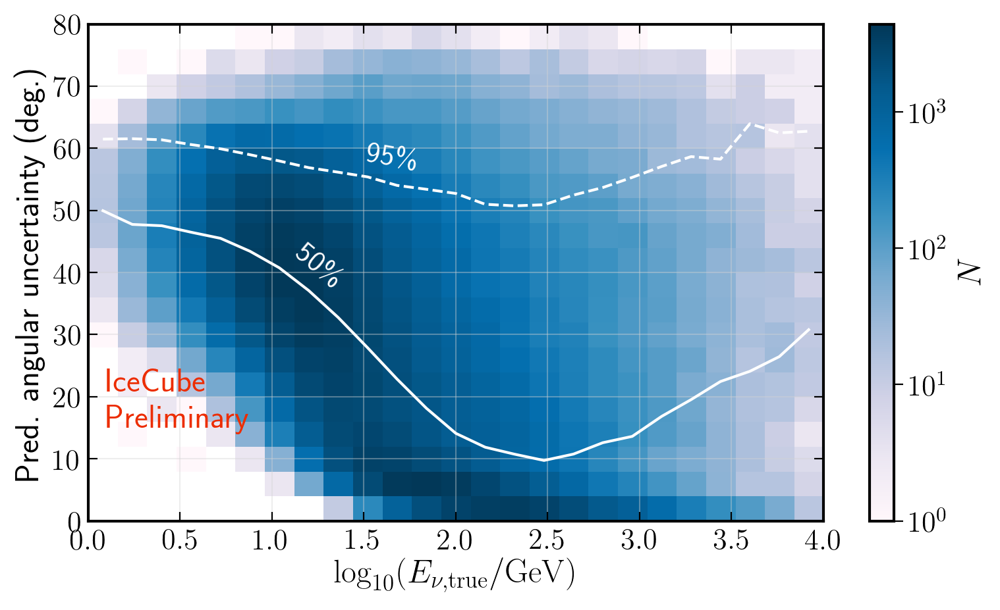

In [18]:
f = plt.figure(figsize = (9, 5), dpi=200)
f.set_facecolor('w')
ax = f.add_subplot(111)

e_bins = np.logspace(0., 4., 26)
meds = []
ninetyfive = []
for le, re in zip(e_bins[:-1], e_bins[1:]):
    msk = nu_df['trueE'] < re
    msk *= nu_df['trueE'] > le
    meds.append(np.median(nu_df['pred dpsi deg'][msk]))
    ninetyfive.append(np.percentile(nu_df['pred dpsi deg'][msk], 95.))

cax = plt.hist2d(np.log10(nu_df['trueE']), nu_df['pred dpsi deg'], 
               bins=[np.log10(e_bins), np.linspace(0., 80., 21)],
          norm=LogNorm())
cbar = plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4],
                   label=r'$N$')
cbar.ax.tick_params(axis='y', direction='out')

plt.plot(mids(np.log10(e_bins)), meds, color = 'w')
plt.plot(mids(np.log10(e_bins)), ninetyfive, color = 'w', ls= '--')
plt.xlabel(r'$\log_{10}(E_{\nu, \mathrm{true}} / \mathrm{GeV})$')
plt.ylabel(r'Pred. angular uncertainty (deg.)')
plt.text(0.1, 15, 'IceCube \n Preliminary', color=sns.xkcd_rgb['tomato red'],
        fontsize=18)
plt.text(1.5, 58, '95\%', rotation=-10, color='w')
plt.text(1.1, 42, '50\%', rotation=-40, color='w')

plt.savefig('/home/apizzuto/public_html/novae/RandomForest_plots/novae_assigned_error_twod_true_energy.png',
           bbox_inches='tight', dpi=150)
plt.show()

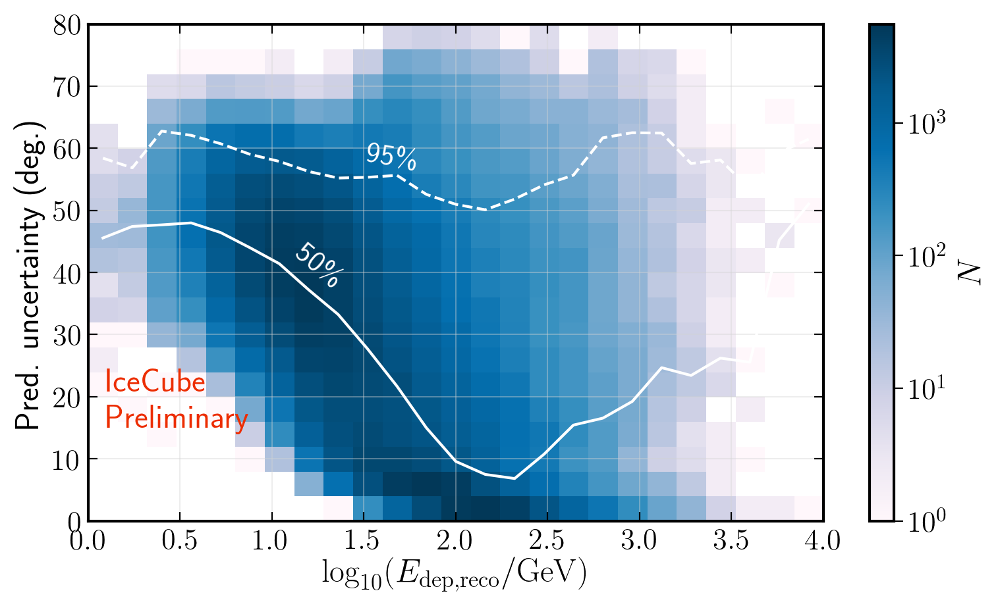

In [19]:
f = plt.figure(figsize = (9, 5), dpi=200)
f.set_facecolor('w')
ax = f.add_subplot(111)

e_bins = np.logspace(0., 4., 26)
meds = []
ninetyfive = []
for le, re in zip(e_bins[:-1], e_bins[1:]):
    msk = nu_df['logE'] < np.log10(re)
    msk *= nu_df['logE'] > np.log10(le)
    meds.append(np.median(nu_df['pred dpsi deg'][msk]))
    ninetyfive.append(np.percentile(nu_df['pred dpsi deg'][msk], 95.))

cax = plt.hist2d(nu_df['logE'], nu_df['pred dpsi deg'], 
               bins=[np.log10(e_bins), np.linspace(0., 80., 21)],
          norm=LogNorm())
cbar = plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4], label=r'$N$')
cbar.ax.tick_params(axis='y', direction='out')

plt.plot(mids(np.log10(e_bins)), meds, color = 'w')
plt.plot(mids(np.log10(e_bins)), ninetyfive, color = 'w', ls= '--')
plt.xlabel(r'$\log_{10}(E_{\mathrm{dep,reco}} / \mathrm{GeV})$')
plt.ylabel(r'Pred. uncertainty (deg.)')

plt.text(0.1, 15, 'IceCube \n Preliminary', color=sns.xkcd_rgb['tomato red'],
        fontsize=18)
plt.text(1.5, 58, '95\%', rotation=-10, color='w')
plt.text(1.1, 42, '50\%', rotation=-40, color='w')
plt.savefig('/home/apizzuto/public_html/novae/RandomForest_plots/novae_assigned_error_twod_reco_energy.png',
           bbox_inches='tight', dpi=150)
plt.show()

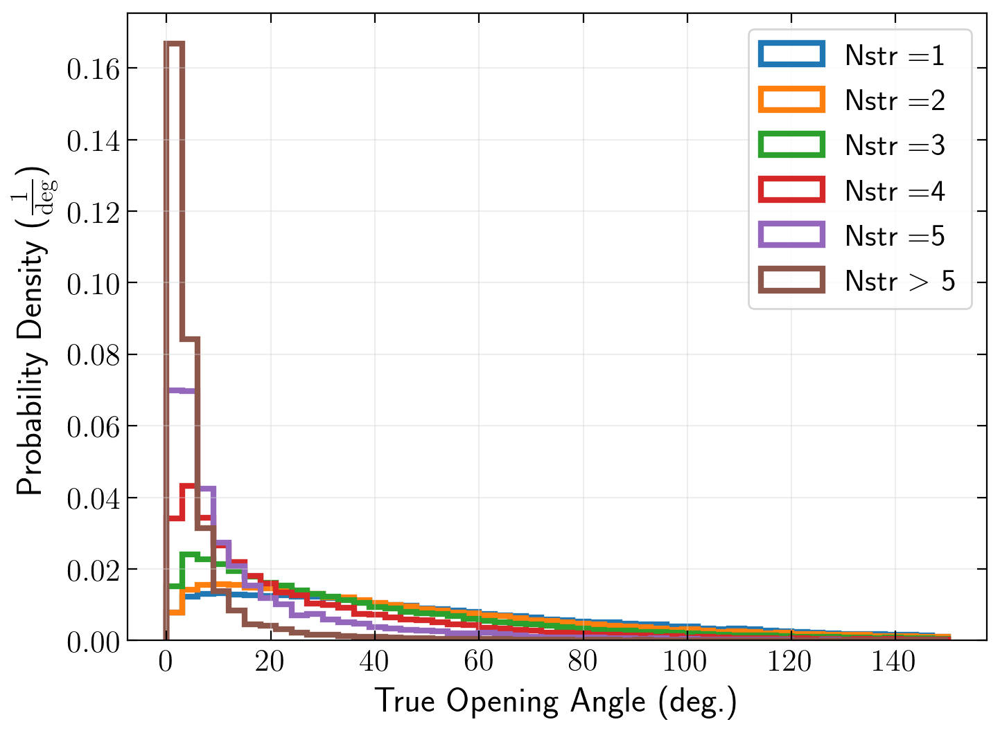

In [39]:
fig, ax = plt.subplots(figsize = (8,6), dpi=200)

nstrings = [1, 2, 3, 4, 5]
for nstr in nstrings:
    msk = nu_df['nstring'] == nstr
    plt.hist(nu_df['true dpsi deg'][msk], bins = np.linspace(0., 150., 51), density=True, 
             linewidth = 3., histtype='step', label = r'Nstr $=$' + r'{}'.format(nstr))
    
msk = nu_df['nstring'] > 5
plt.hist(nu_df['true dpsi deg'][msk], bins = np.linspace(0., 150., 51), density=True, 
             linewidth = 3., histtype='step', label = r'Nstr $>$ 5')
    
plt.legend(loc = 1, ncol = 1)
plt.ylabel(r'Probability Density ($\frac{1}{\mathrm{deg}}$)')
plt.xlabel(r'True Opening Angle (deg.)')
plt.show()    

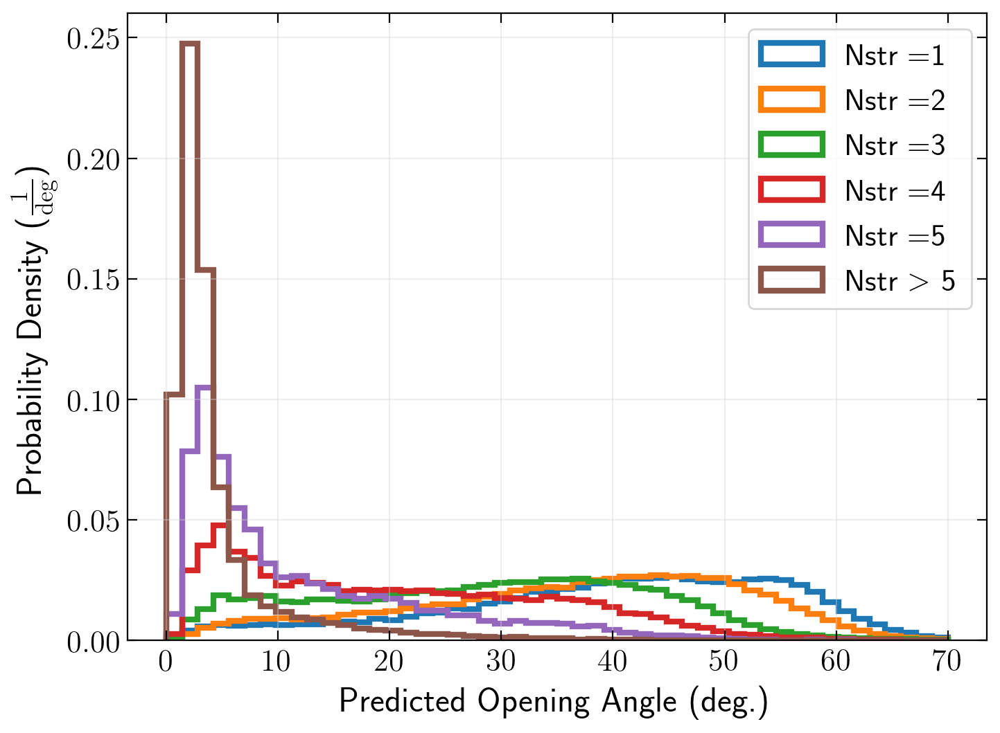

In [40]:
fig, ax = plt.subplots(figsize = (8,6), dpi=200)

nstrings = [1, 2, 3, 4, 5]
for nstr in nstrings:
    msk = nu_df['nstring'] == nstr
    plt.hist(nu_df['pred dpsi deg'][msk], bins = np.linspace(0., 70., 51), density=True, 
             linewidth = 3., histtype='step', label = r'Nstr $=$' + r'{}'.format(nstr))
    
msk = nu_df['nstring'] > 5
plt.hist(nu_df['pred dpsi deg'][msk], bins = np.linspace(0., 70., 51), density=True, 
             linewidth = 3., histtype='step', label = r'Nstr $>$ 5')

plt.legend(loc = 1, ncol = 1)
plt.ylabel(r'Probability Density ($\frac{1}{\mathrm{deg}}$)')
plt.xlabel(r'Predicted Opening Angle (deg.)')
plt.show()

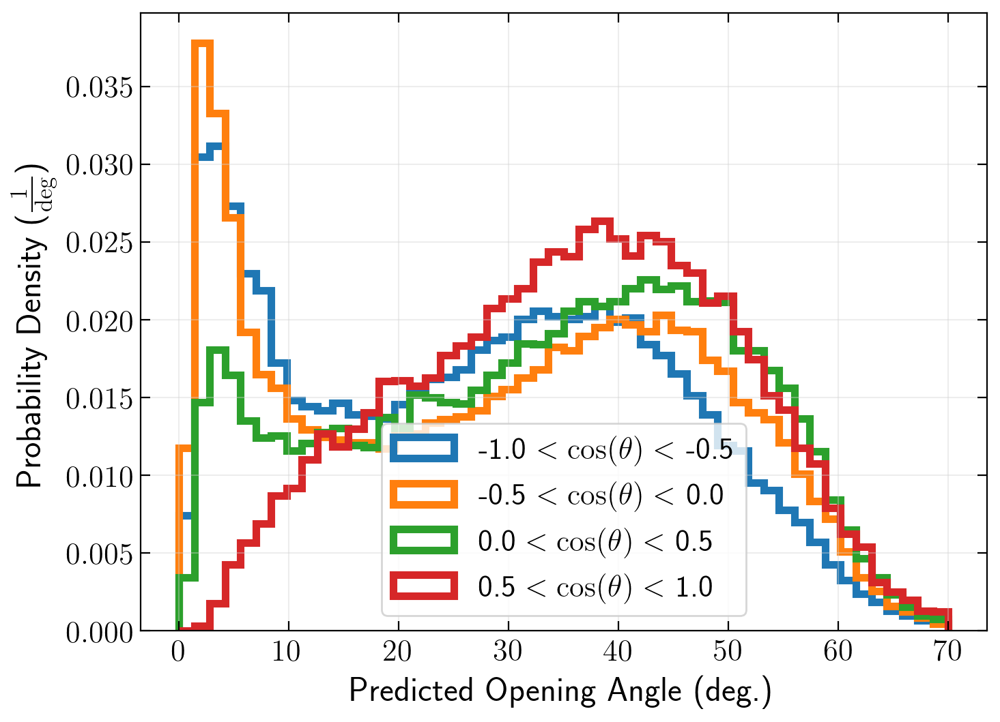

In [41]:
fig, ax = plt.subplots(figsize = (8,6), dpi=200)

cz_bins = np.linspace(-1., 1., 5)
for le, re in zip(cz_bins[:-1], cz_bins[1:]):
    msk = -np.sin(nu_df['trueDec']) < re
    msk *= -np.sin(nu_df['trueDec']) > le
    plt.hist(nu_df['pred dpsi deg'][msk], bins = np.linspace(0., 70., 51), 
             density=True, linewidth = 4., histtype='step',
            label = '{:.1f} '.format(le) + r'$< \cos(\theta) < $' + ' {:.1f}'.format(re))
    
plt.legend(loc = 8, ncol = 1)
plt.ylabel(r'Probability Density ($\frac{1}{\mathrm{deg}}$)')
plt.xlabel(r'Predicted Opening Angle (deg.)')
plt.show()

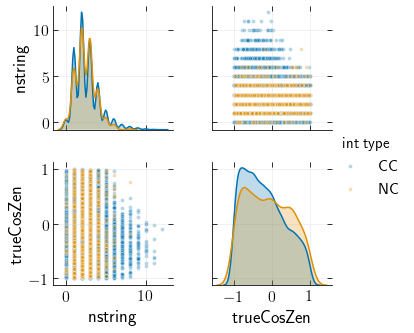

In [45]:
sns.pairplot(nu_df.sample(n=10000), vars=['nstring', 'trueCosZen'], 
             plot_kws={"s": 15, "alpha": 0.3, "edgecolors": None}, hue='int type', palette='colorblind')
plt.show()

In [44]:
nu_df['trueCosZen'] = np.cos(nu_df['trueDec'] + np.pi / 2.)

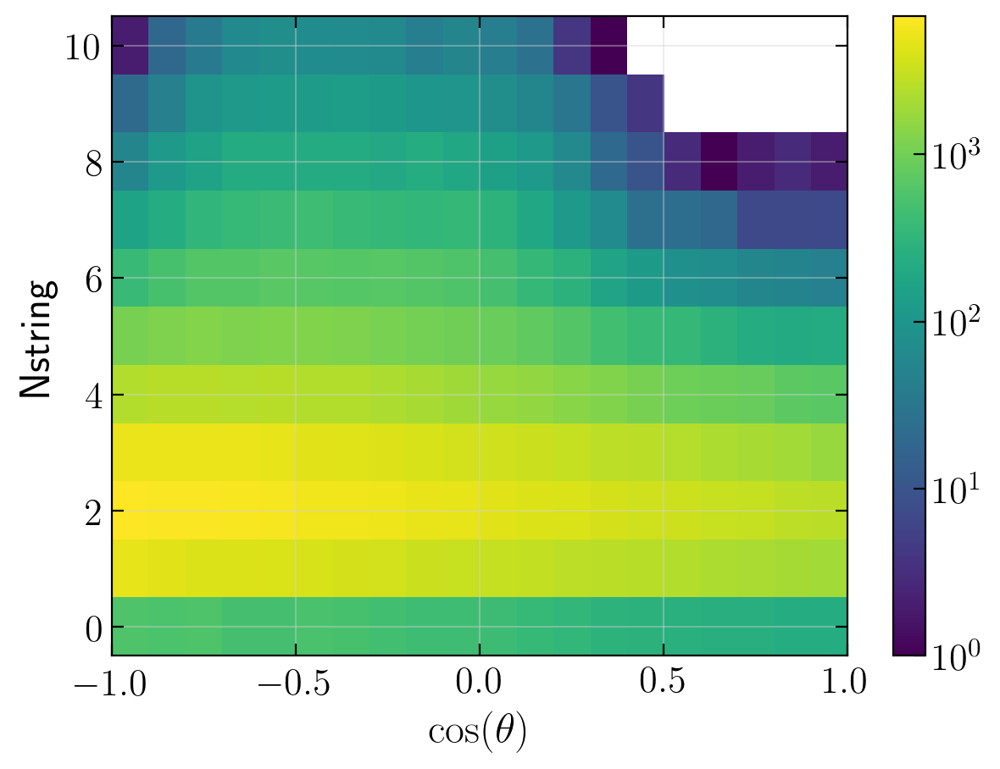

In [46]:
f = plt.figure(figsize=(7,5), dpi=200)
f.set_facecolor('w')
ax = f.add_subplot(111)

cax = plt.hist2d(nu_df['trueCosZen'], nu_df['nstring'], bins=[np.linspace(-1., 1., 21), np.linspace(-0.5, 10.5, 12)],
          norm=LogNorm(), cmap = 'viridis')
plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4])
plt.ylabel('Nstring')
plt.xlabel(r'$\cos(\theta)$')
plt.show()

In [47]:
def coverage(z, true_arr, guess_arr):
    msk = z*guess_arr > true_arr
    return float(len(true_arr[msk])) / len(true_arr)

In [48]:
def r_gauss(r):
    return r*np.e**(-r**2. / 2.)

In [49]:
sigs = np.linspace(0., 5., 1000)
ideal_cov = [quad(r_gauss, 0., s)[0] for s in sigs]

In [50]:
act = []
for scale in [0.2, 0.5, 1., 1.2, 2., 5.]:
    a = [coverage(s, nu_df['true dpsi deg'], scale * nu_df['pred dpsi deg']) for s in sigs]
    act.append(a)
 

In [51]:
constant = [[coverage(s, nu_df['true dpsi deg'], d*np.ones(len(nu_df['true dpsi deg']))) for s in sigs] for d in [30., 35., 40.]]



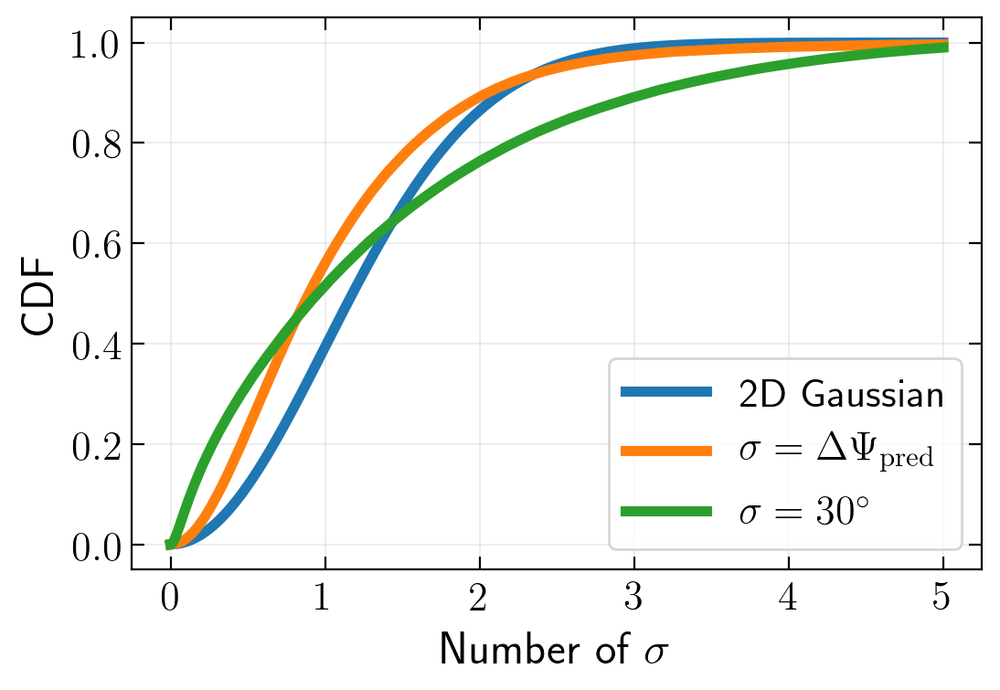

In [52]:
fig = plt.figure(dpi=200)
plt.plot(sigs, ideal_cov, label = '2D Gaussian', lw = 4)
plt.plot(sigs, act[3], label = r'$\sigma = \Delta \Psi_{\mathrm{pred}}$', lw = 4)
#plt.plot(sigs, act[3], label = r'$\sigma = \Delta \Psi_{\mathrm{pred}} \times 2$', lw = 4)
#plt.plot(sigs, act[1], label = r'$\sigma = \Delta \Psi_{\mathrm{pred}} \times 0.5$', lw = 4)
plt.plot(sigs, constant[0], label = r'$\sigma = 30^{\circ}$', lw = 4)
#plt.plot(sigs, constant[2], label = r'$\sigma = 40^{\circ}$', lw = 4)
plt.legend(loc=4)
plt.ylabel('CDF')
plt.xlabel(r'Number of $\sigma$')
plt.show()    

# Double Checking with Increased Depth bc now I'm paranoid

********************************************************************************
log: True	 standardized: True	 minsample: 10
********************************************************************************


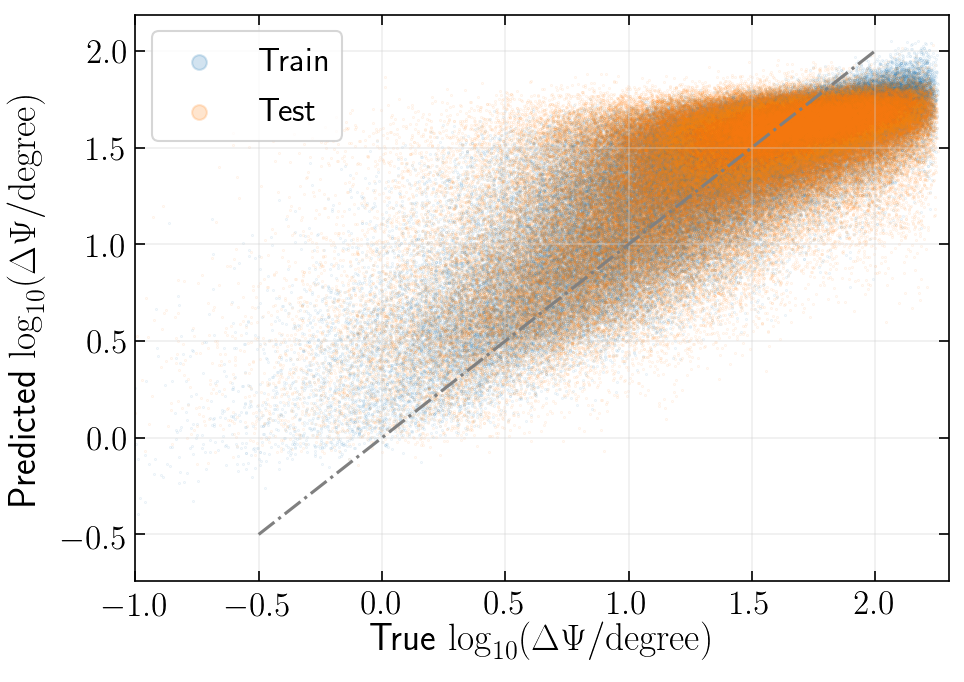

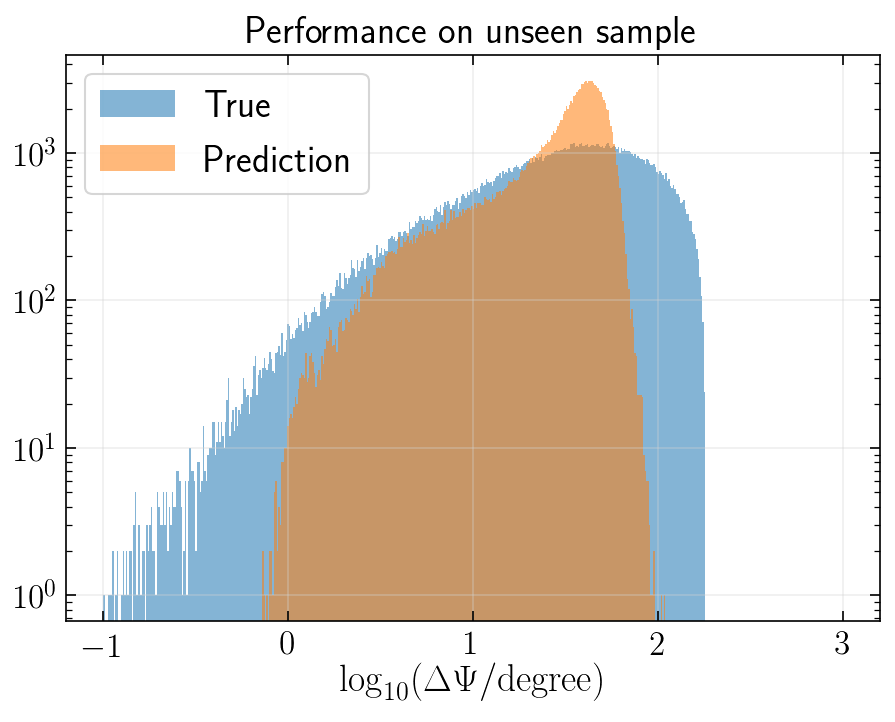

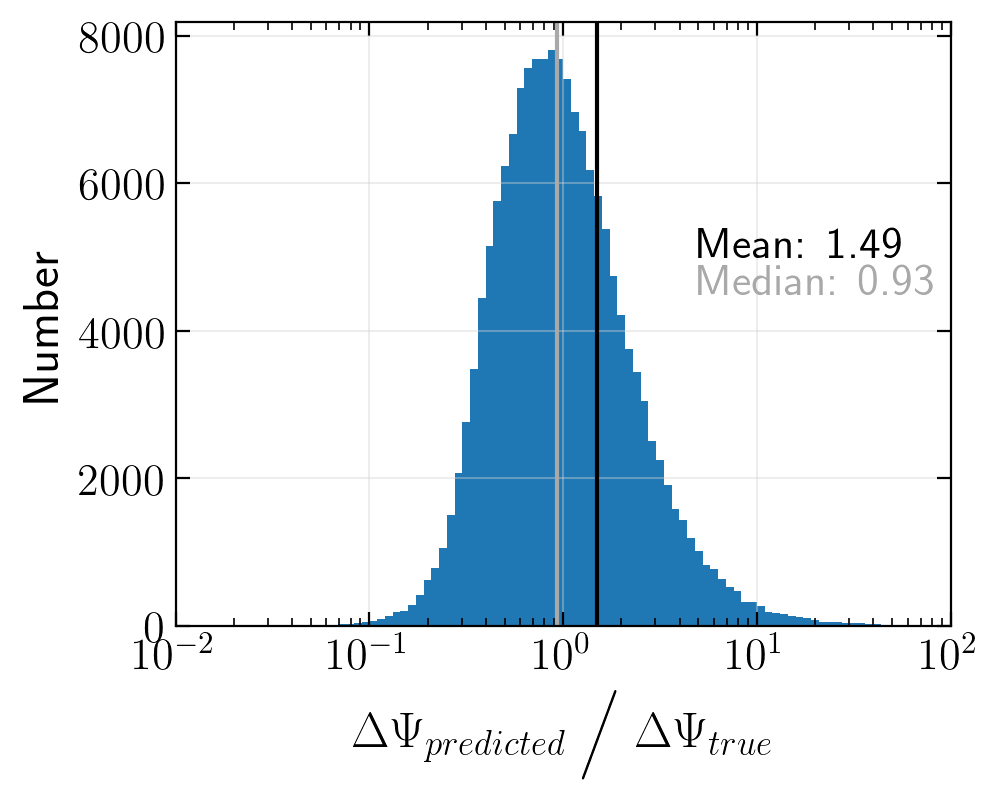

Ratio within factor of 2: 0.626143927428
Ratio within factor of 5: 0.95152636334


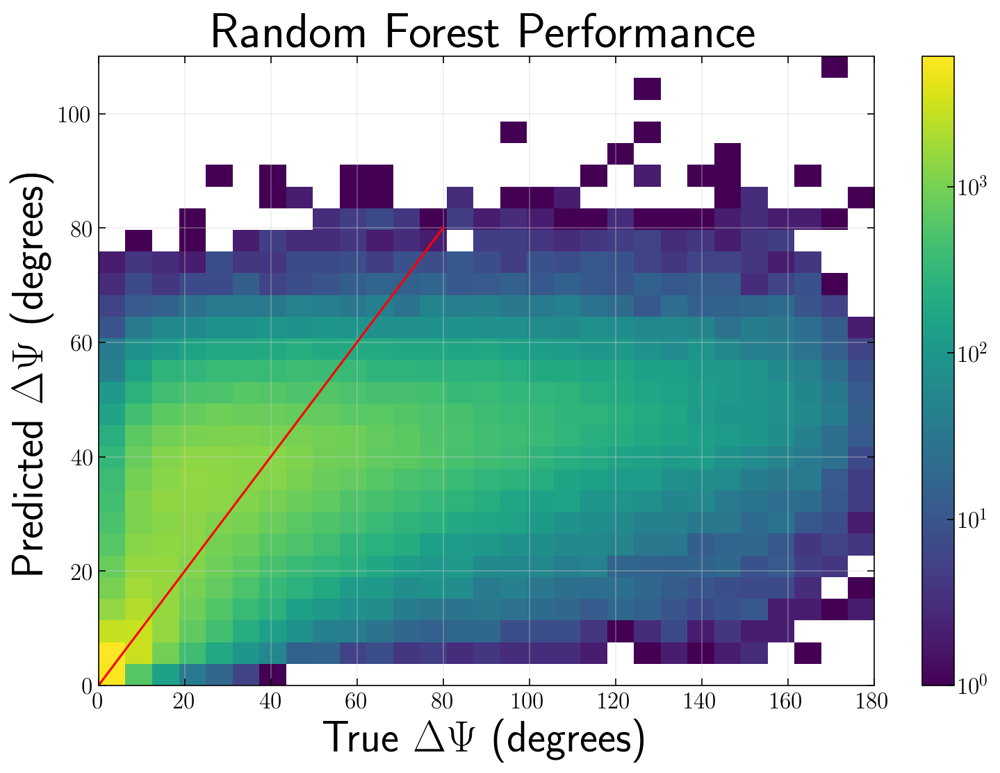

********************************************************************************
log: True	 standardized: True	 minsample: 100
********************************************************************************


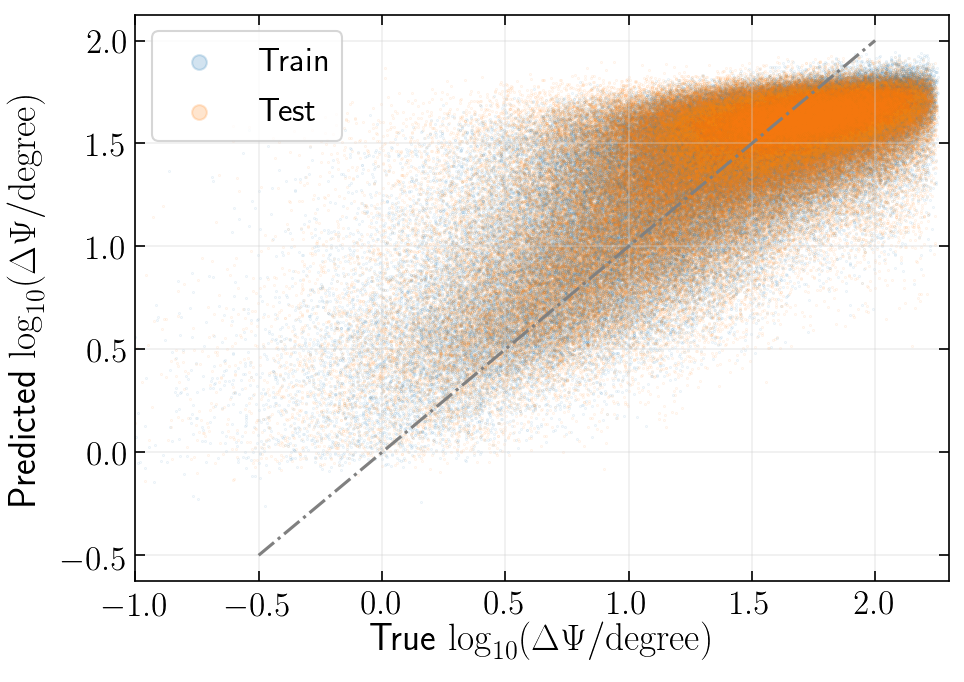

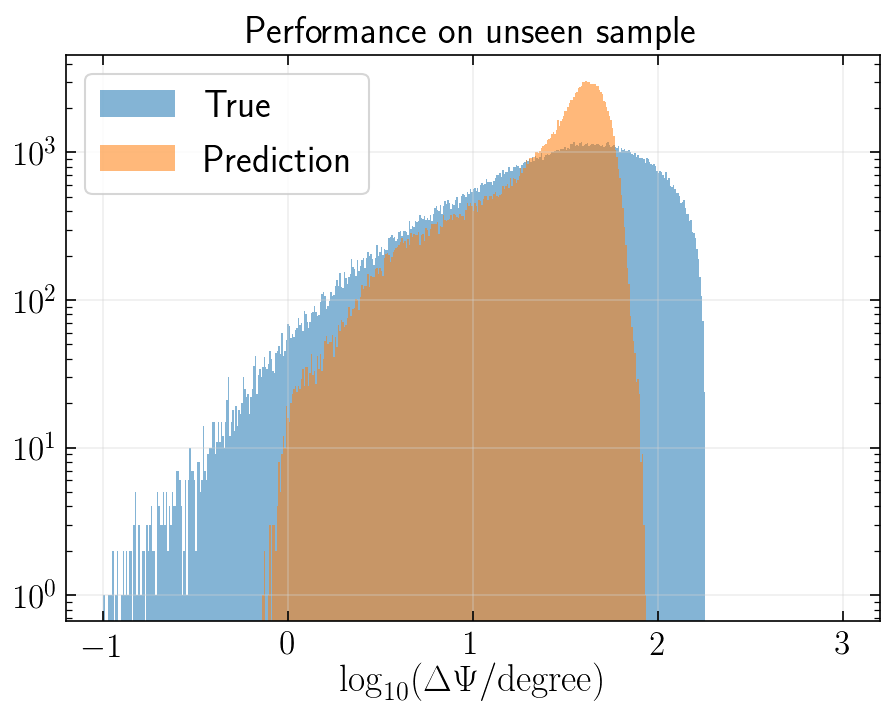

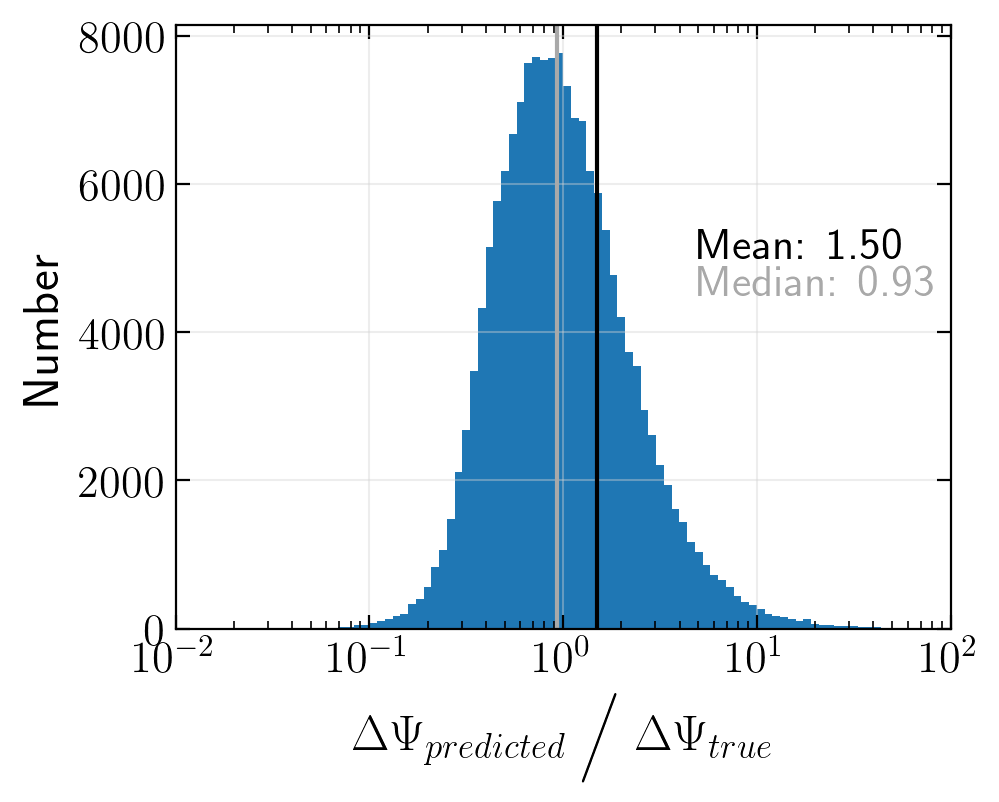

Ratio within factor of 2: 0.625578493857
Ratio within factor of 5: 0.950641336882


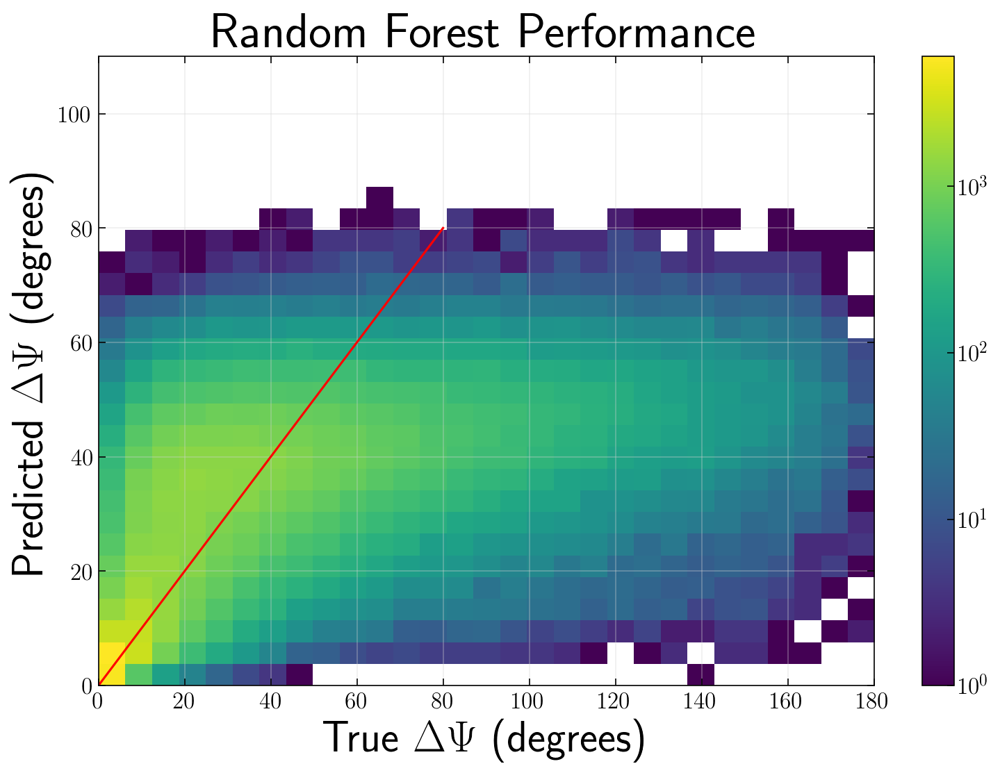

********************************************************************************
log: True	 standardized: True	 minsample: 1000
********************************************************************************


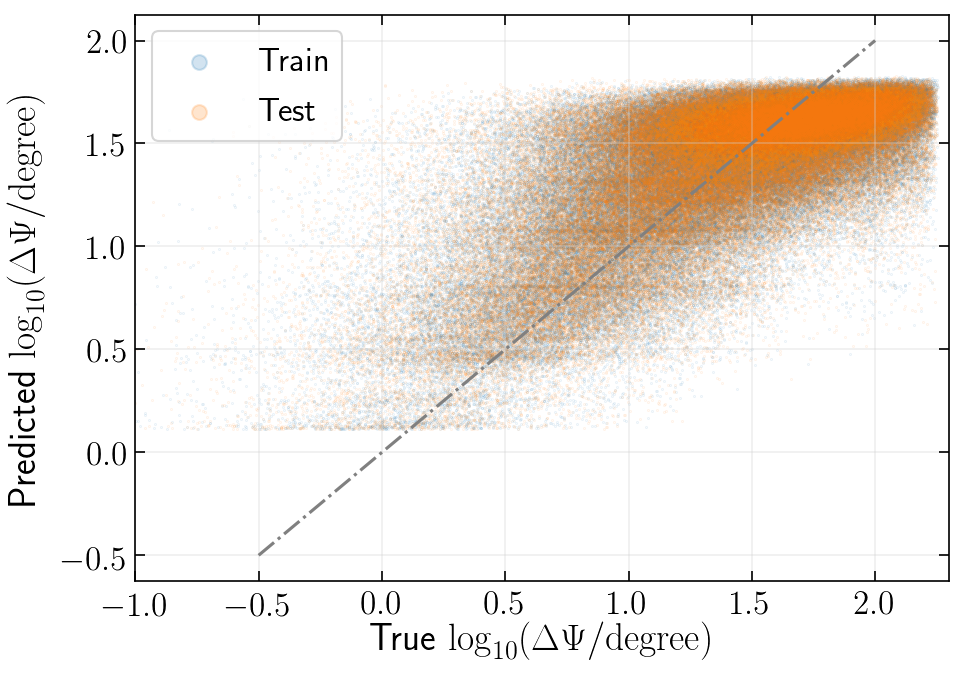

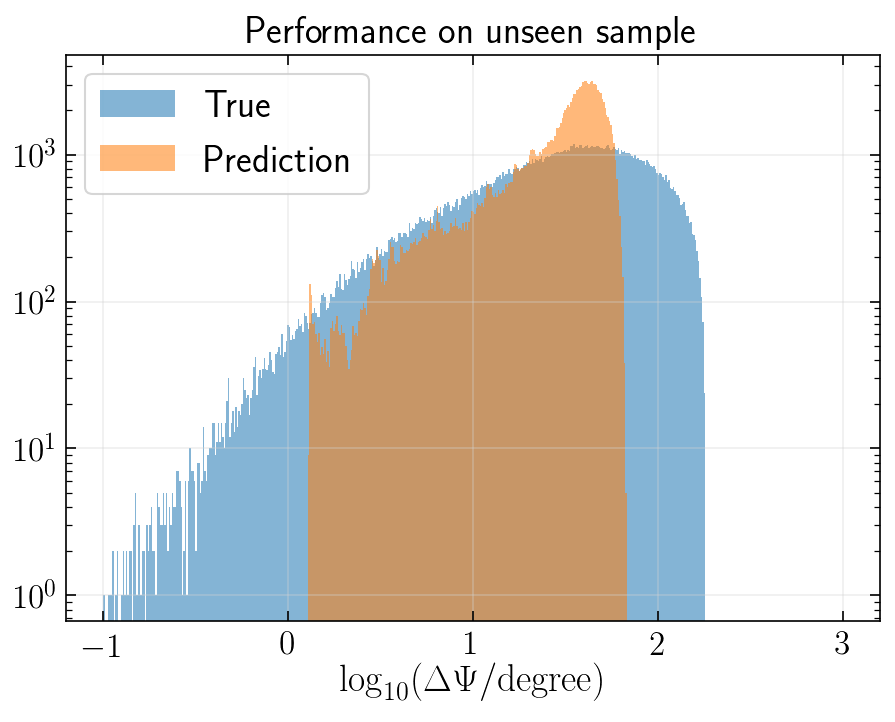

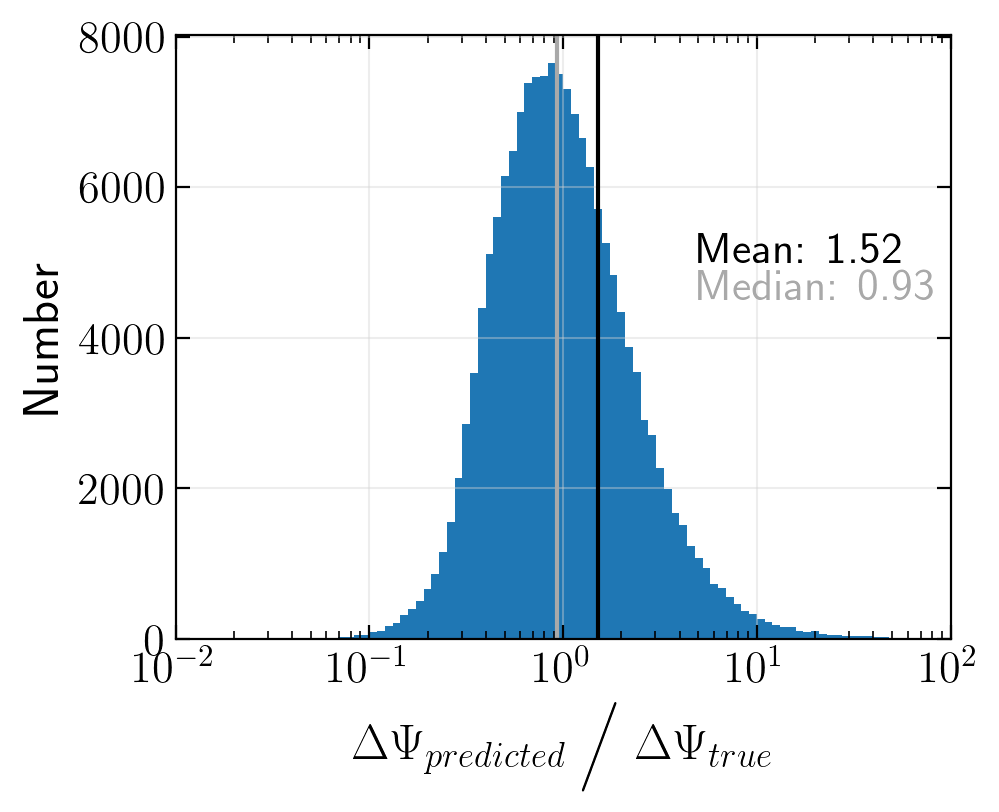

Ratio within factor of 2: 0.61519787102
Ratio within factor of 5: 0.946462045272


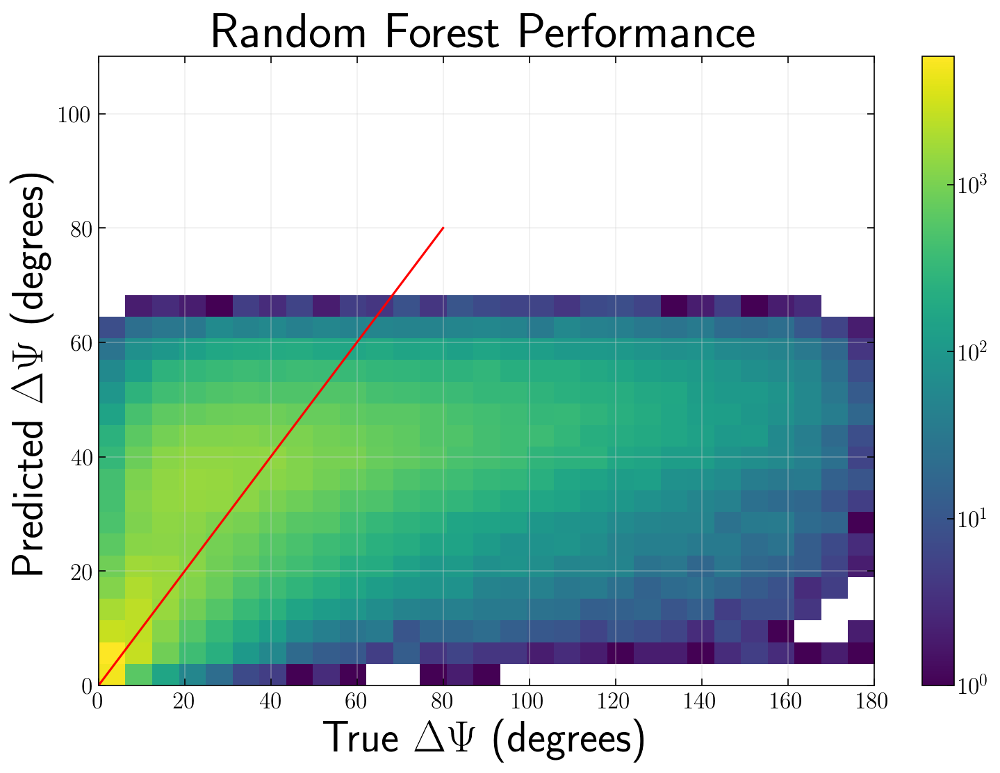

********************************************************************************
log: True	 standardized: True	 minsample: 10000
********************************************************************************


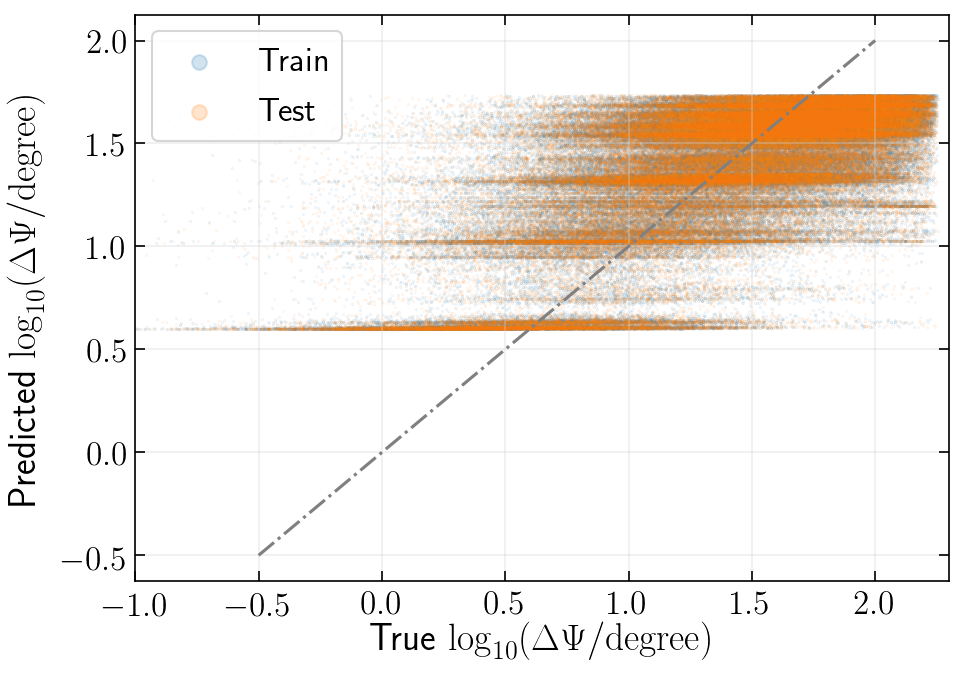

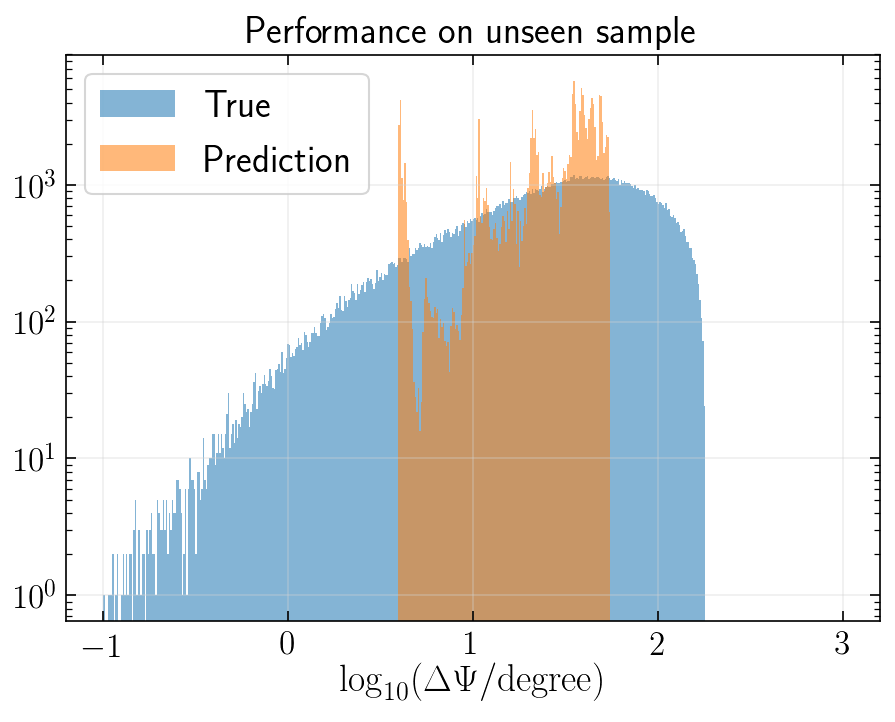

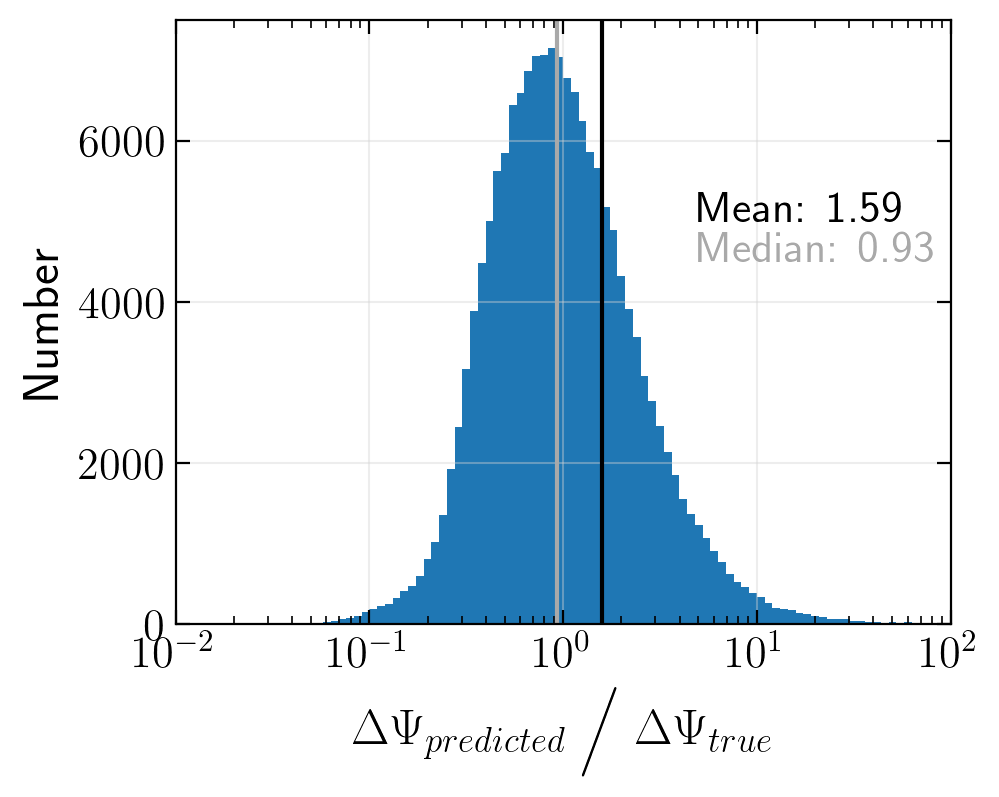

Ratio within factor of 2: 0.585758449237
Ratio within factor of 5: 0.933997922646


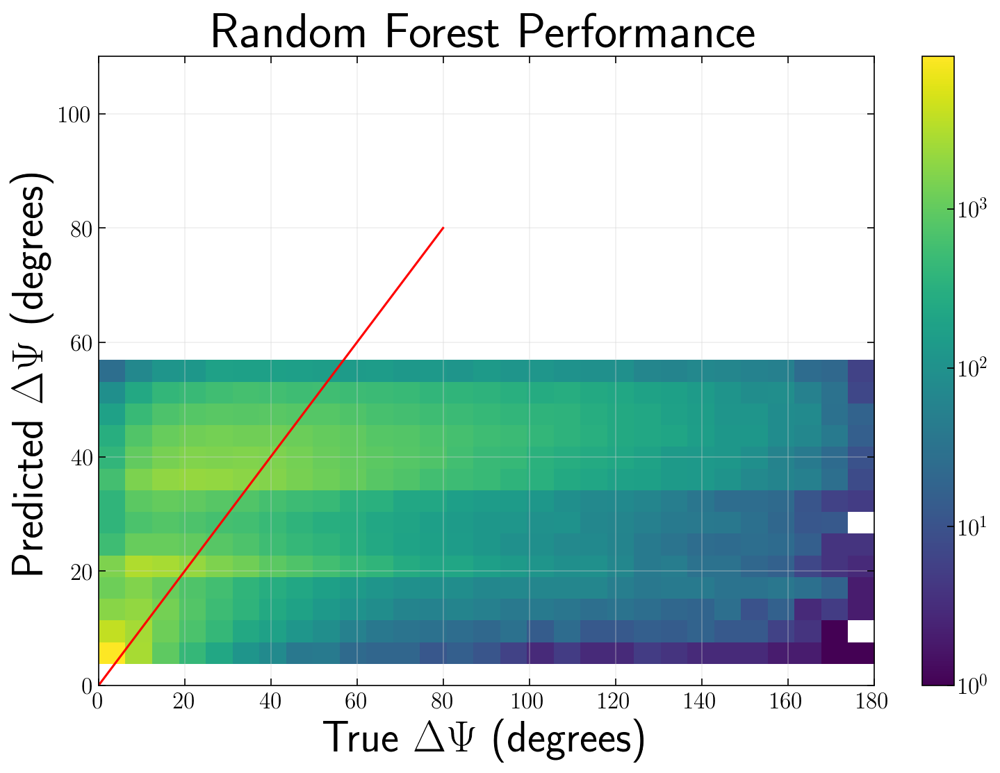

********************************************************************************
log: True	 standardized: True	 minsample: 100000
********************************************************************************


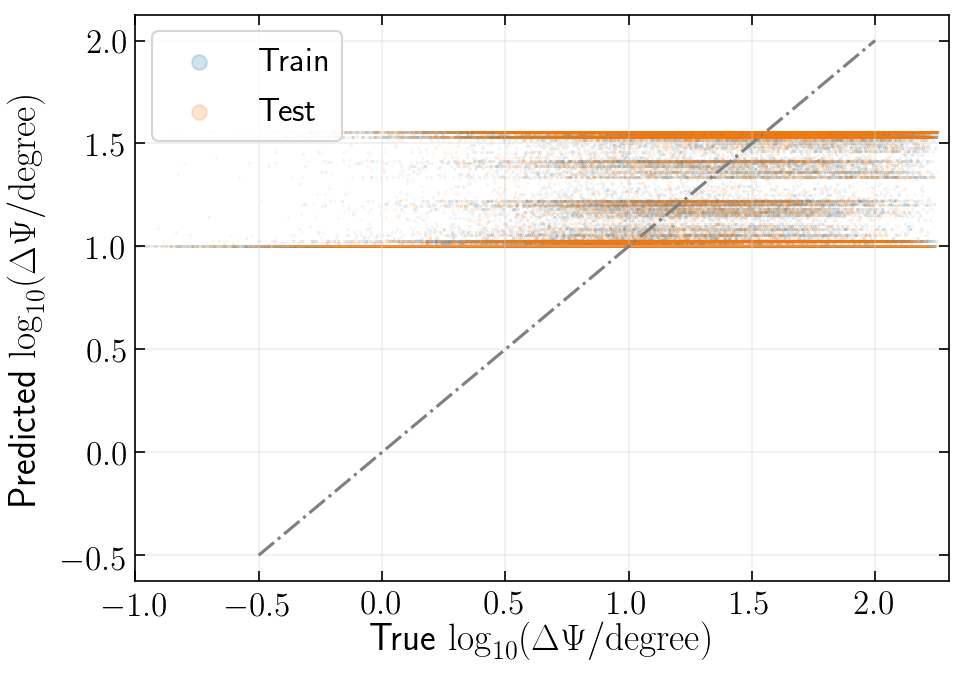

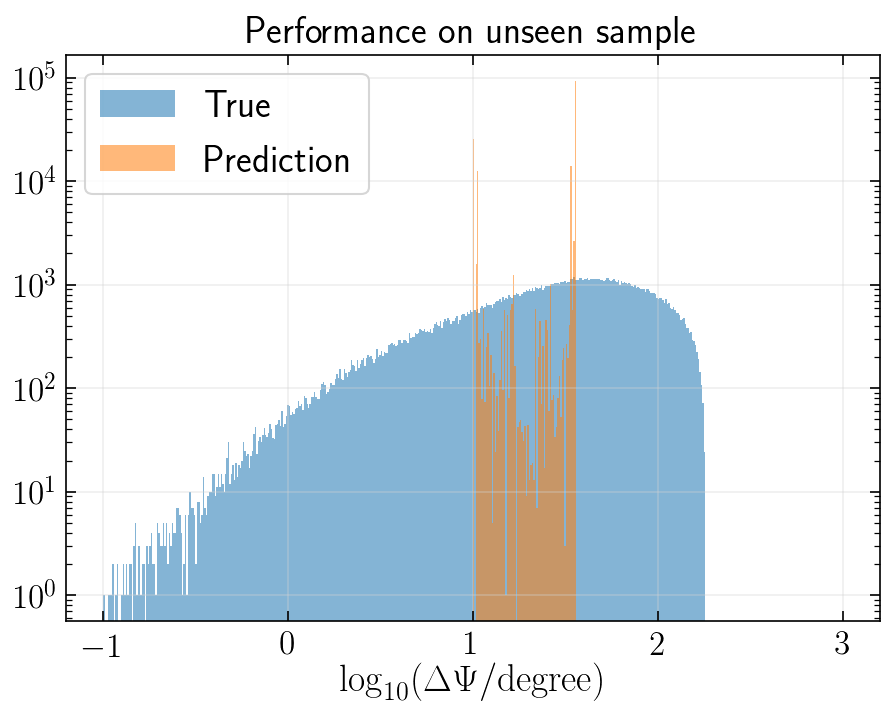

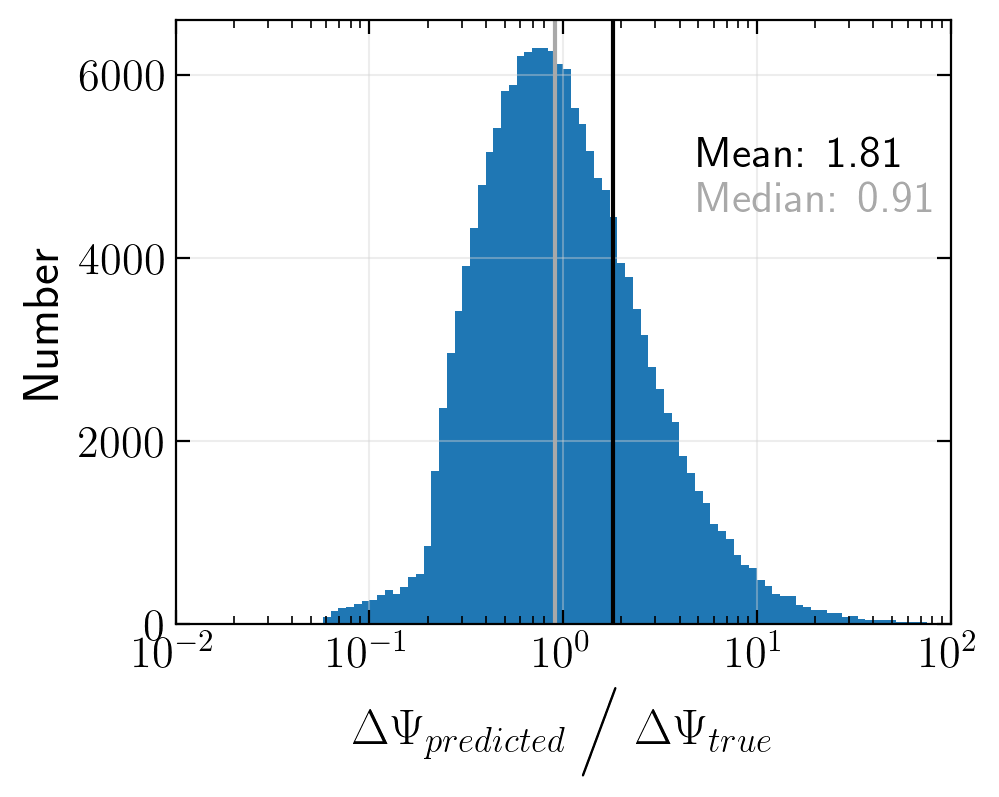

Ratio within factor of 2: 0.525490605813
Ratio within factor of 5: 0.909628964949


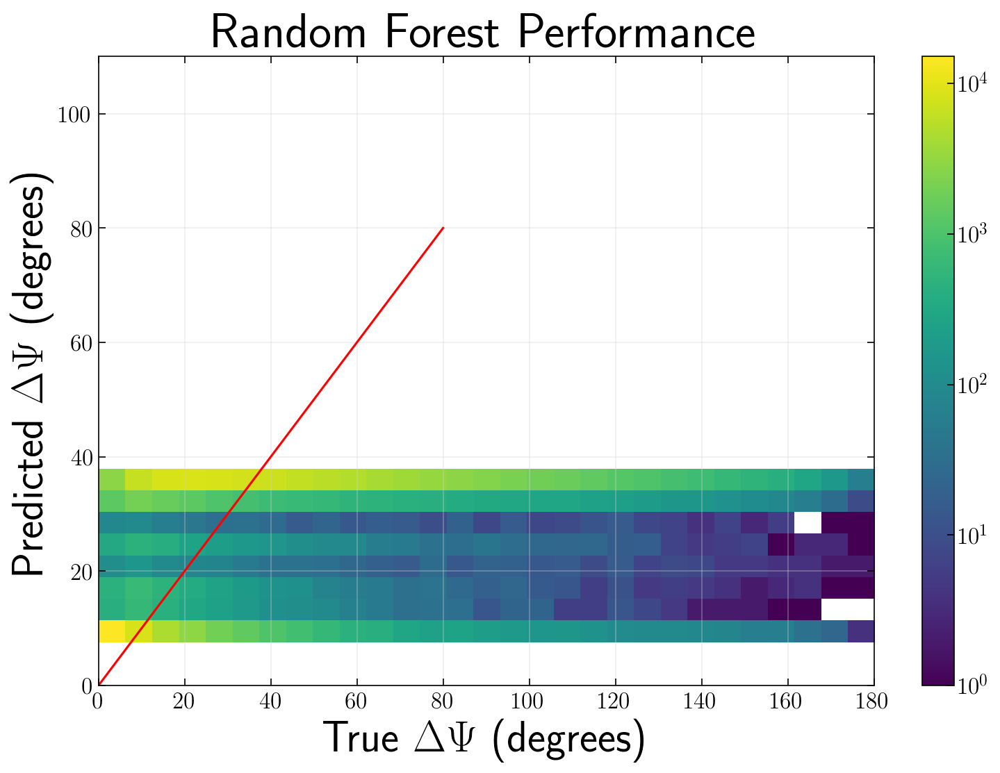

********************************************************************************
log: True	 standardized: False	 minsample: 10
********************************************************************************


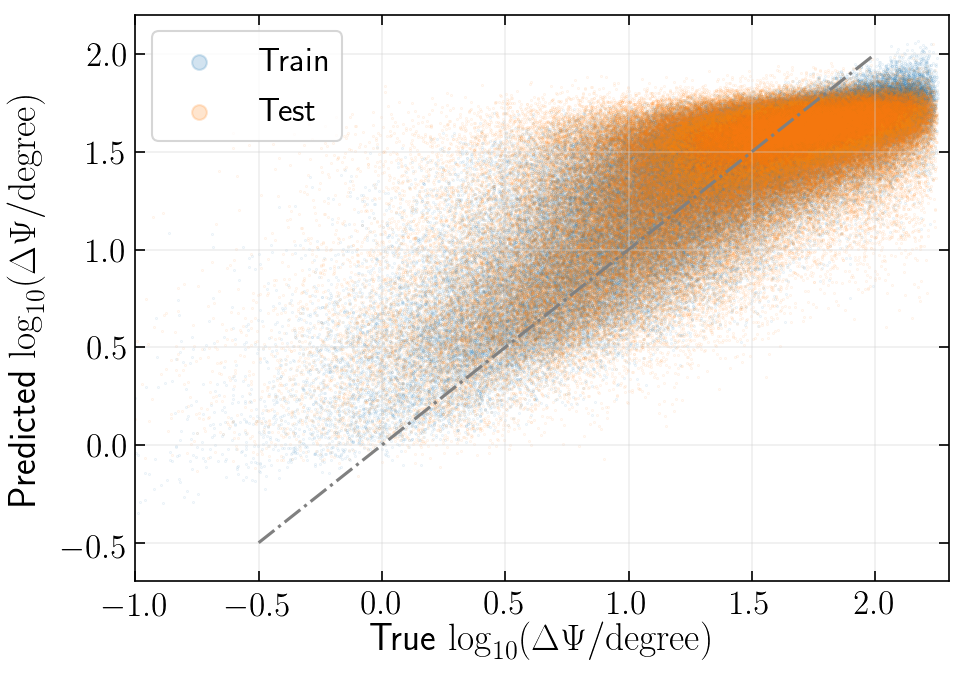

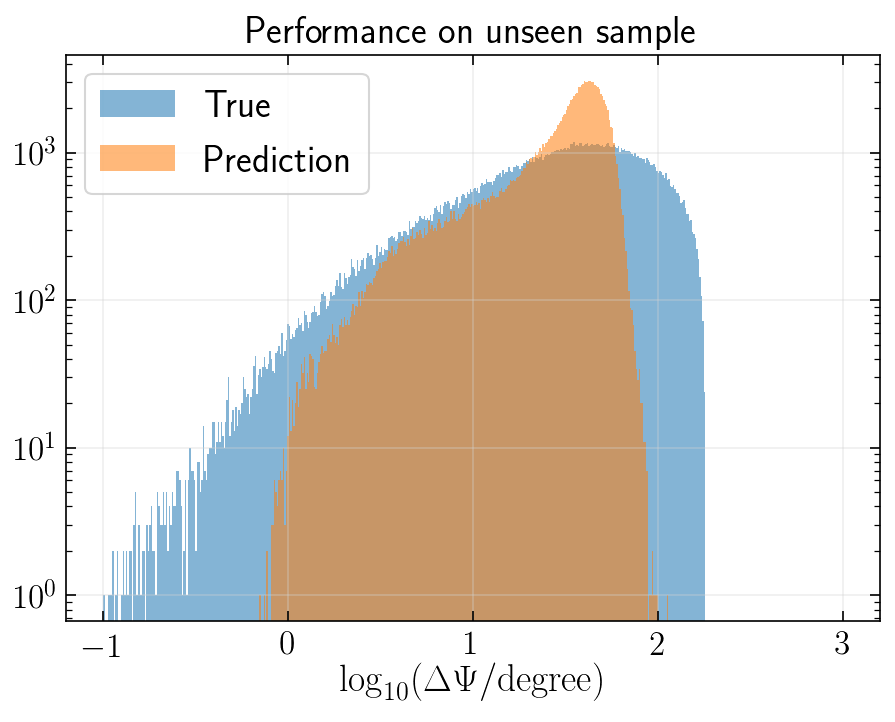

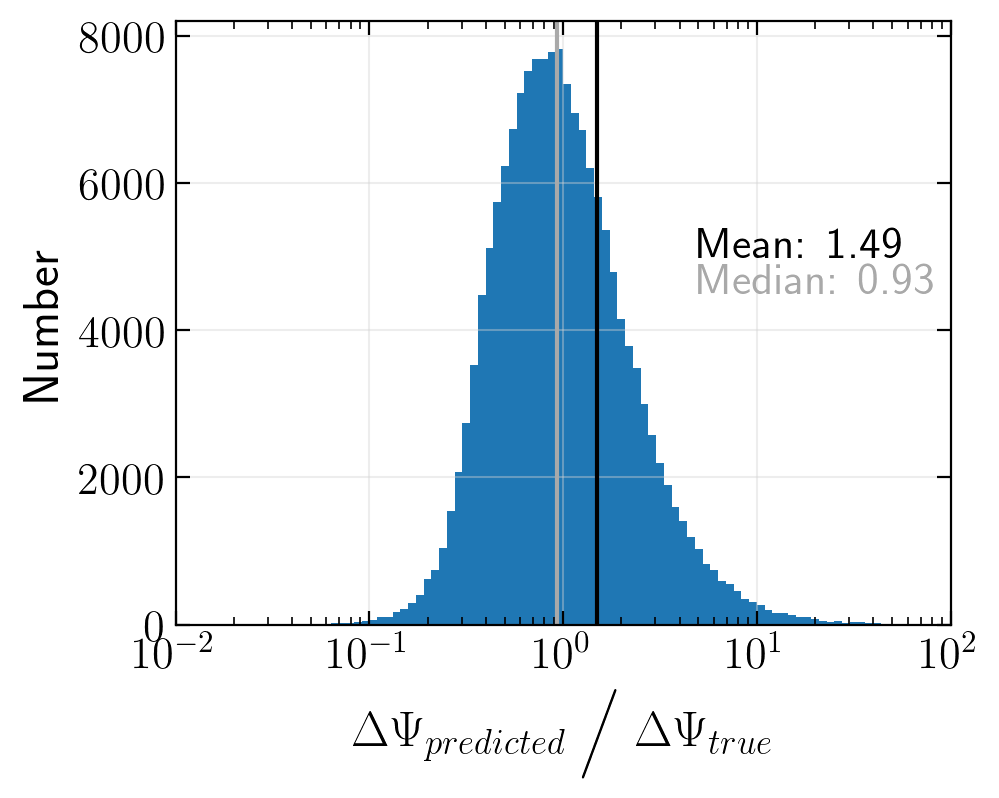

Ratio within factor of 2: 0.626340599974
Ratio within factor of 5: 0.951587823511


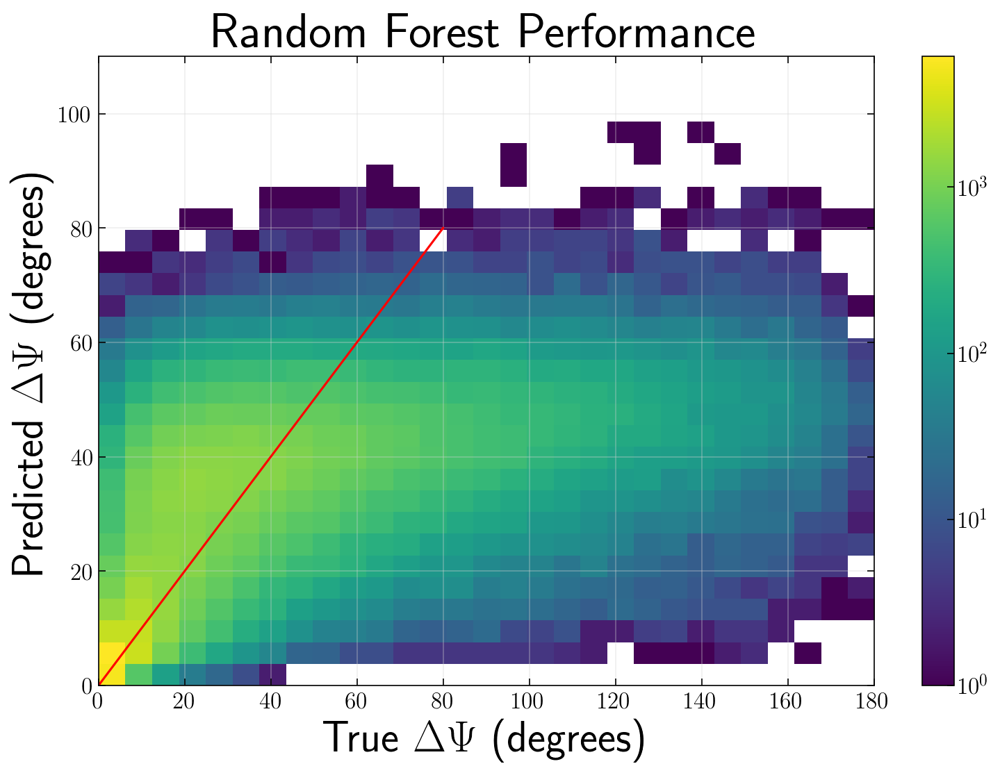

********************************************************************************
log: True	 standardized: False	 minsample: 100
********************************************************************************


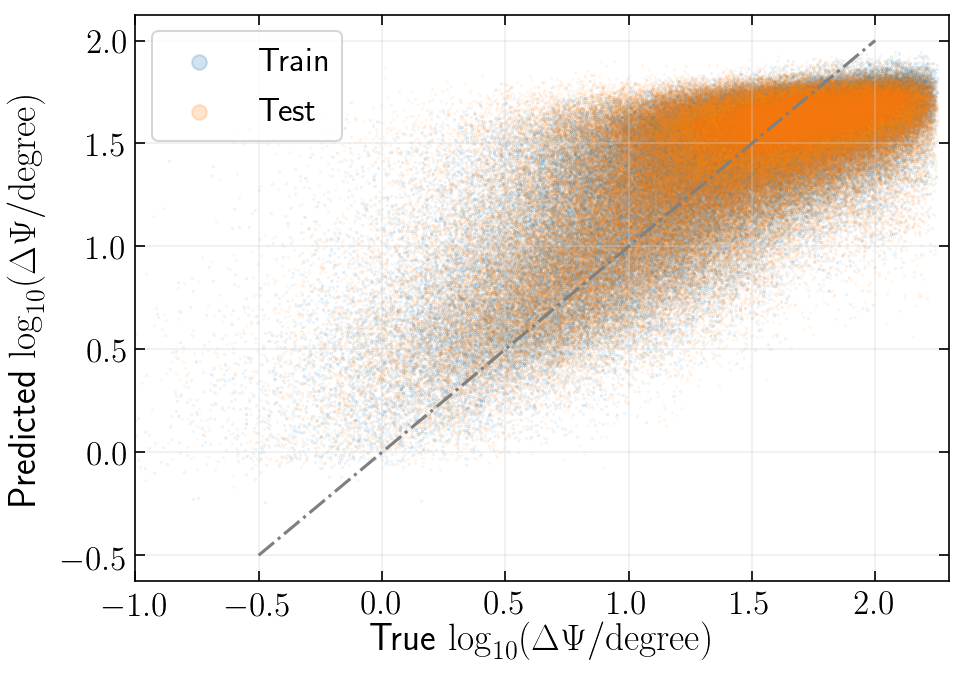

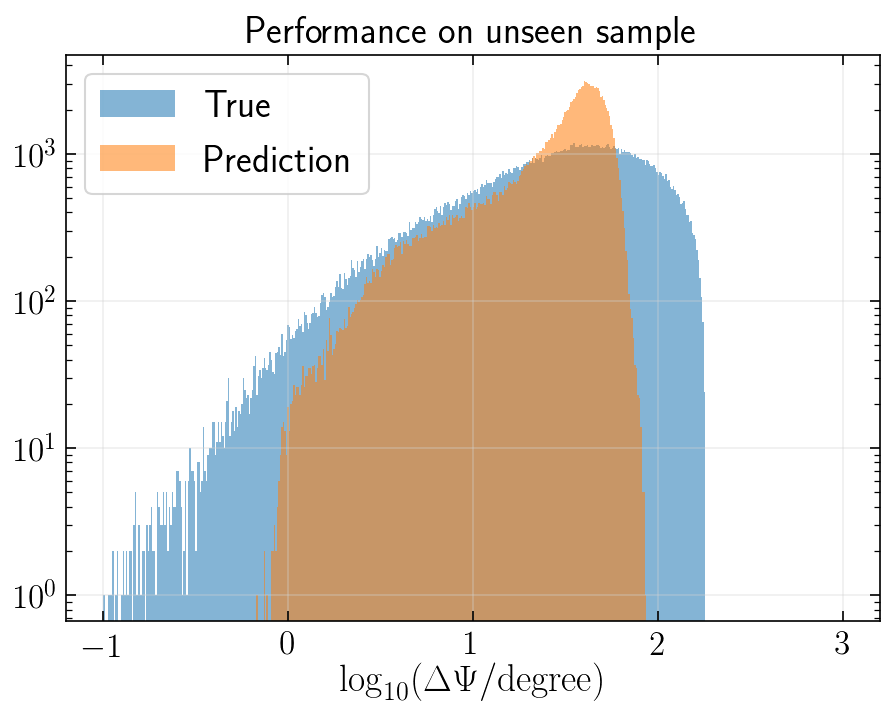

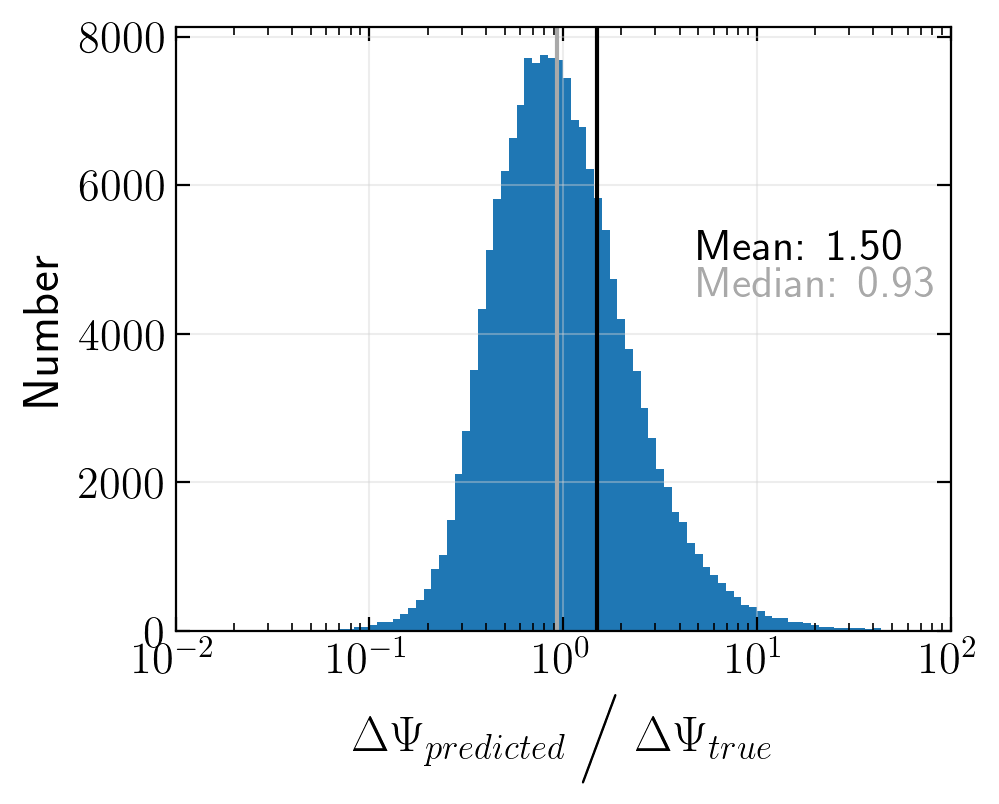

Ratio within factor of 2: 0.625381821311
Ratio within factor of 5: 0.950702797052


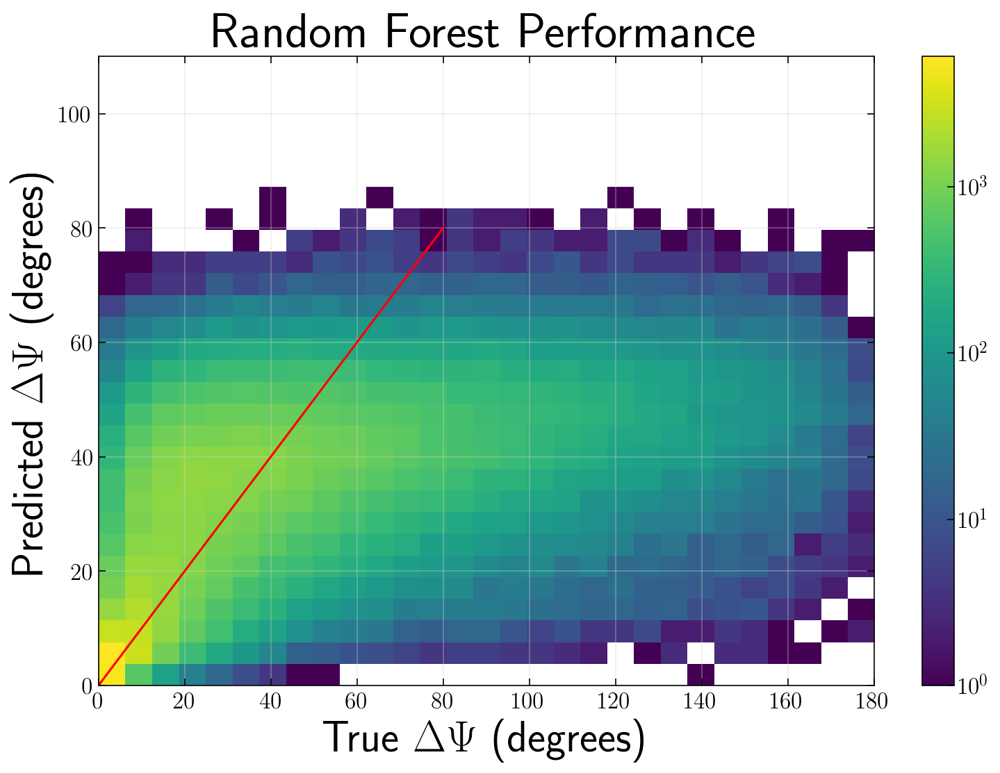

********************************************************************************
log: True	 standardized: False	 minsample: 1000
********************************************************************************


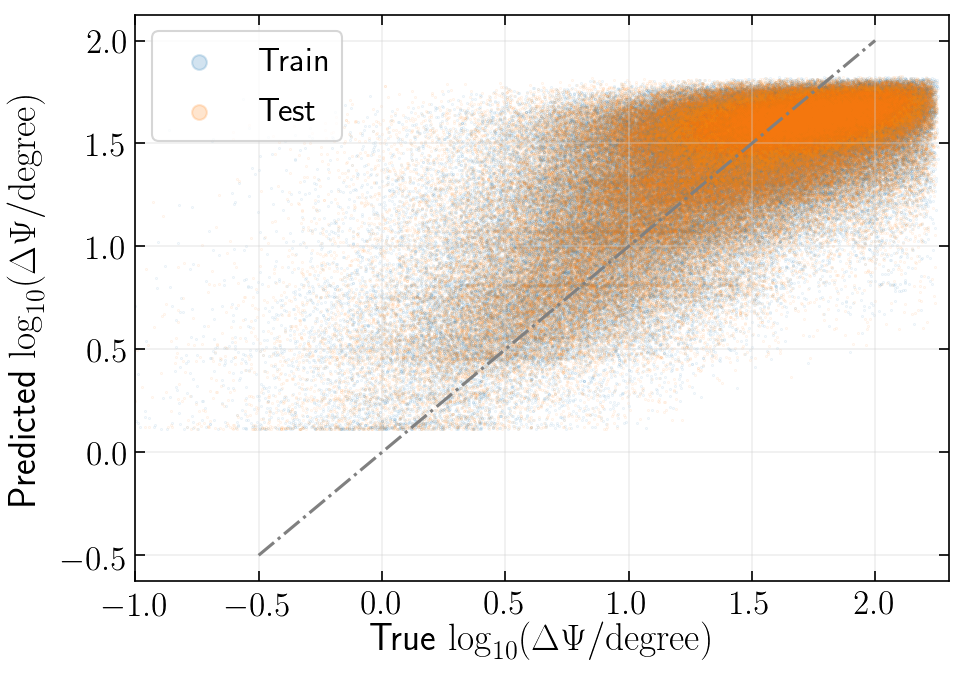

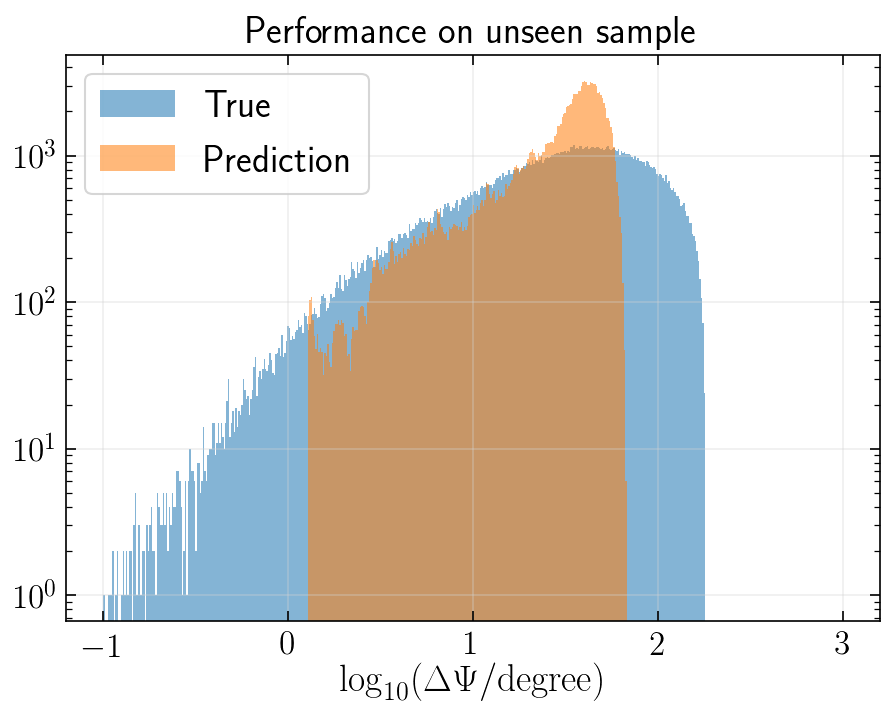

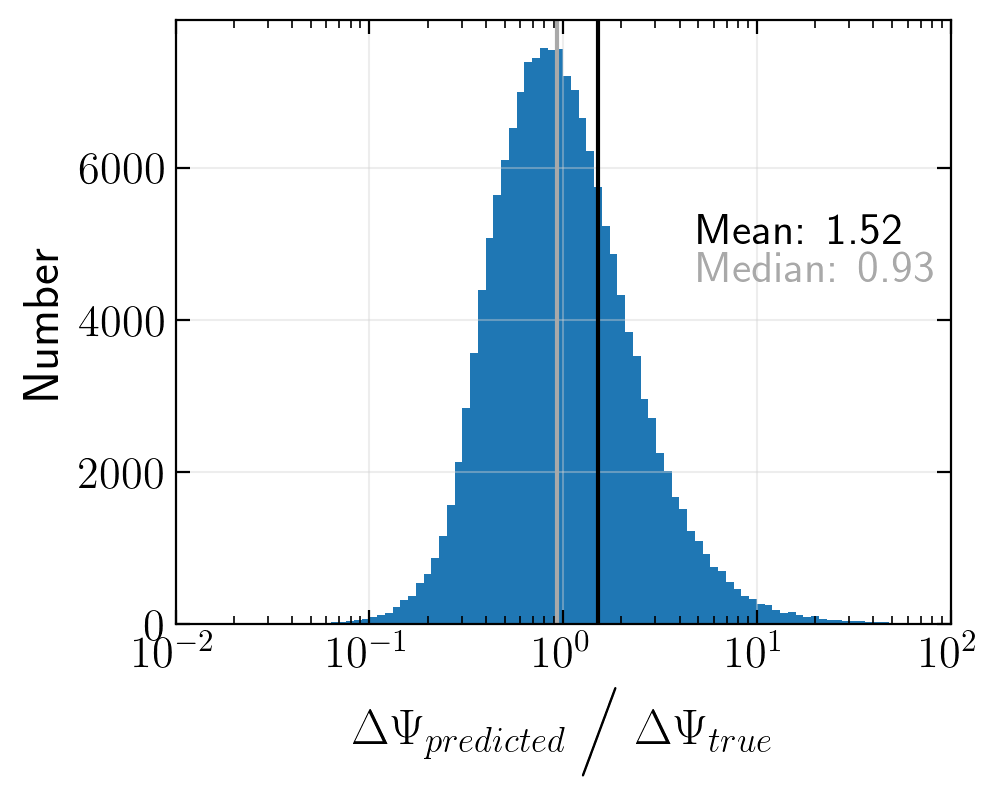

Ratio within factor of 2: 0.615363813481
Ratio within factor of 5: 0.946369855015


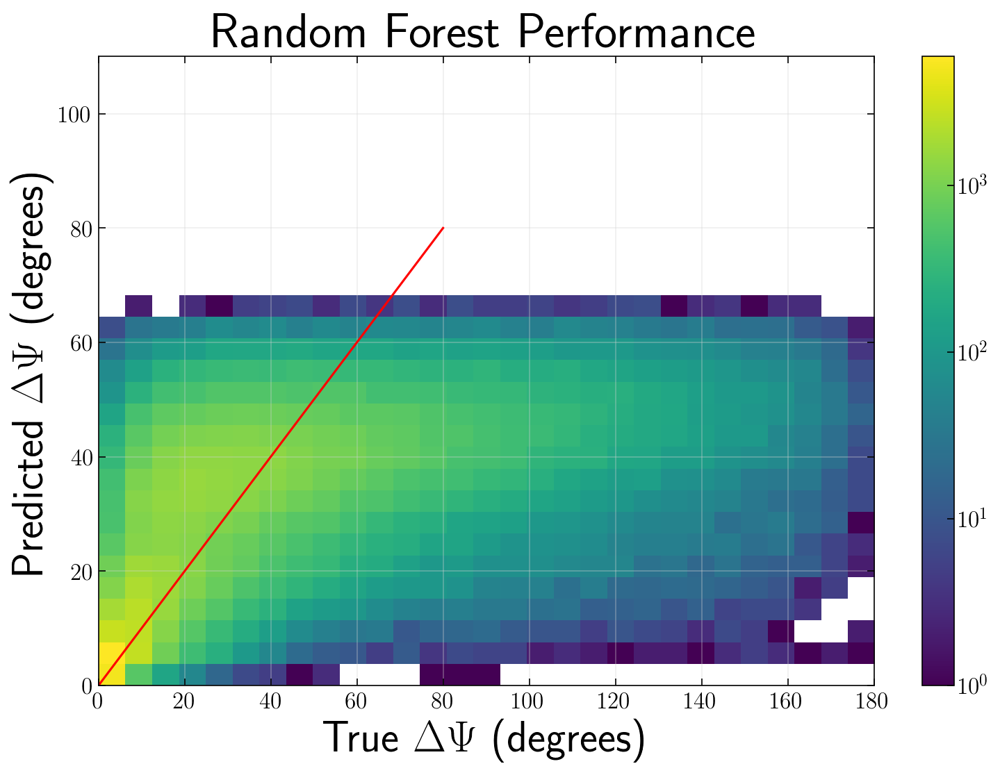

********************************************************************************
log: True	 standardized: False	 minsample: 10000
********************************************************************************


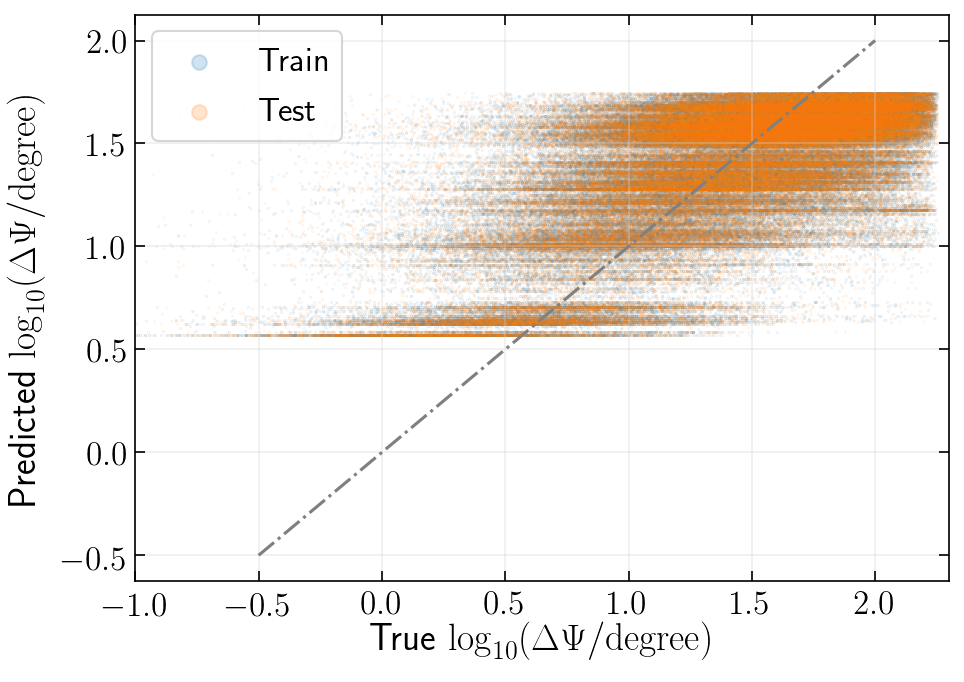

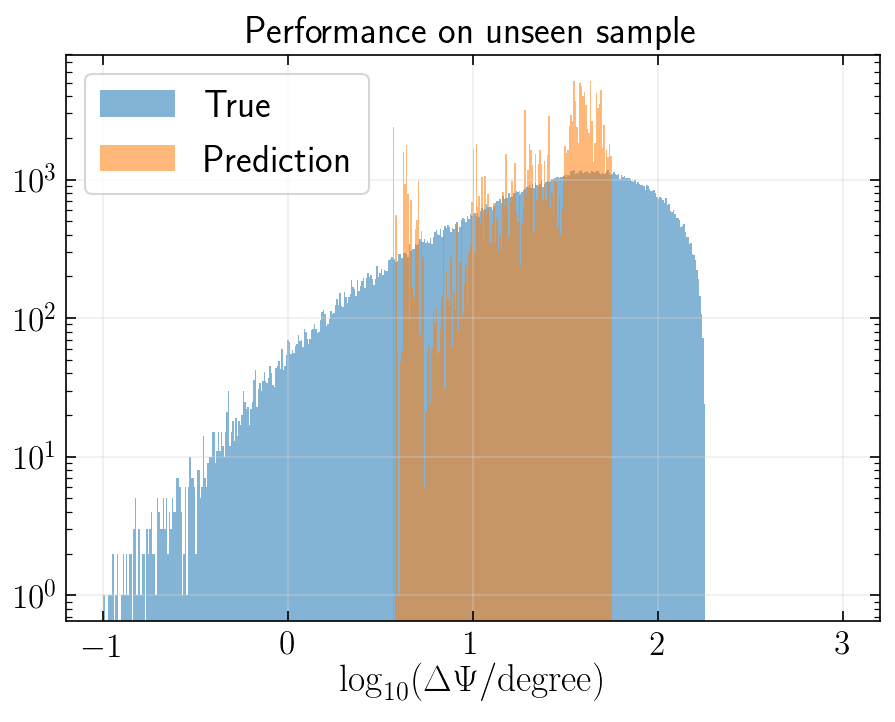

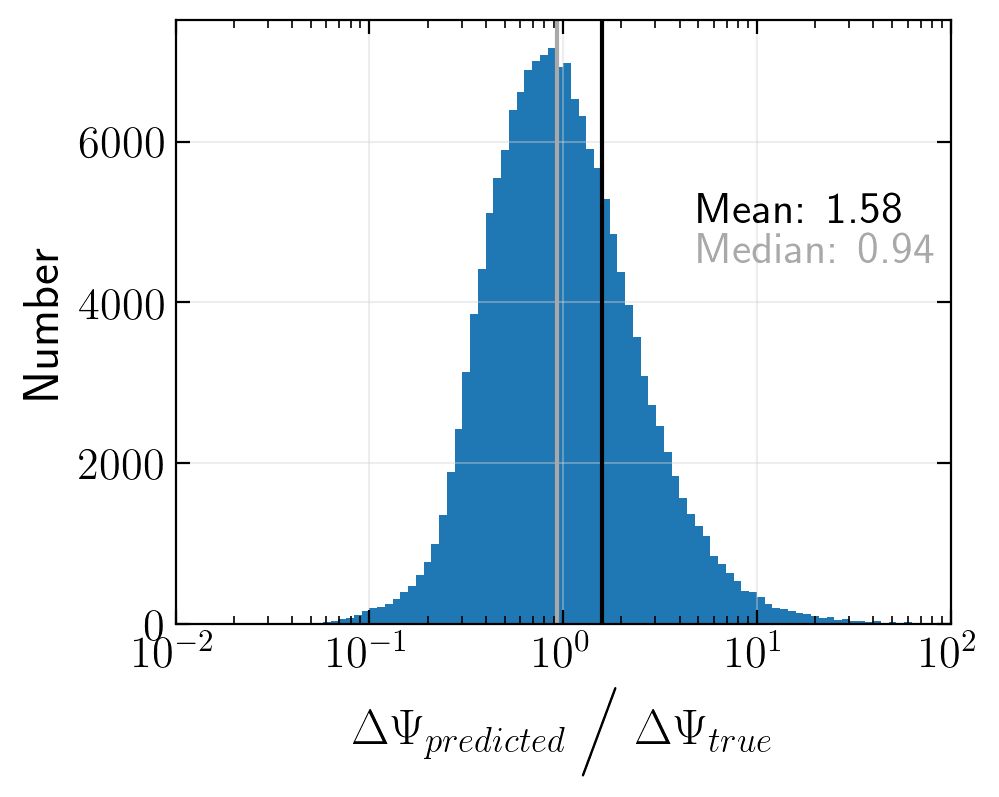

Ratio within factor of 2: 0.587233493335
Ratio within factor of 5: 0.934747736729


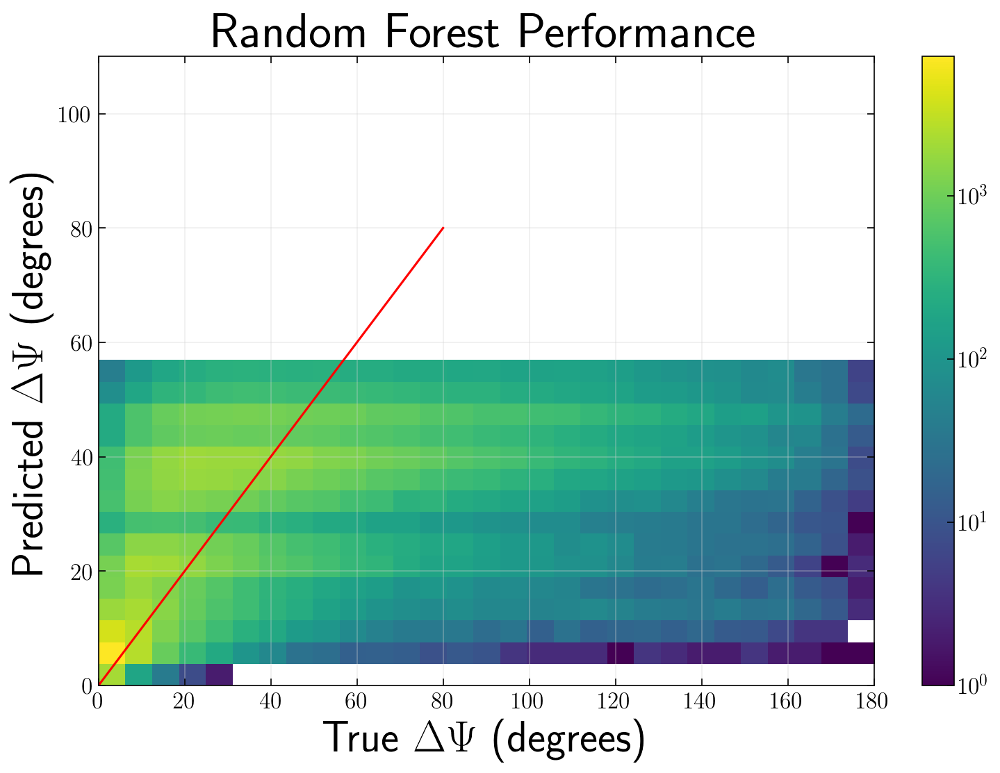

********************************************************************************
log: True	 standardized: False	 minsample: 100000
********************************************************************************


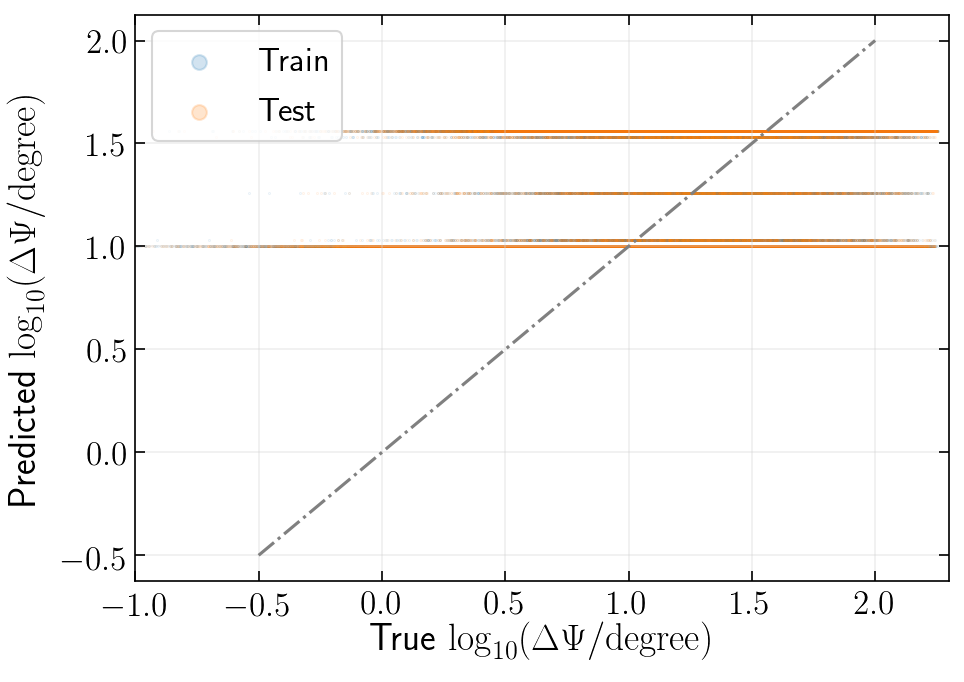

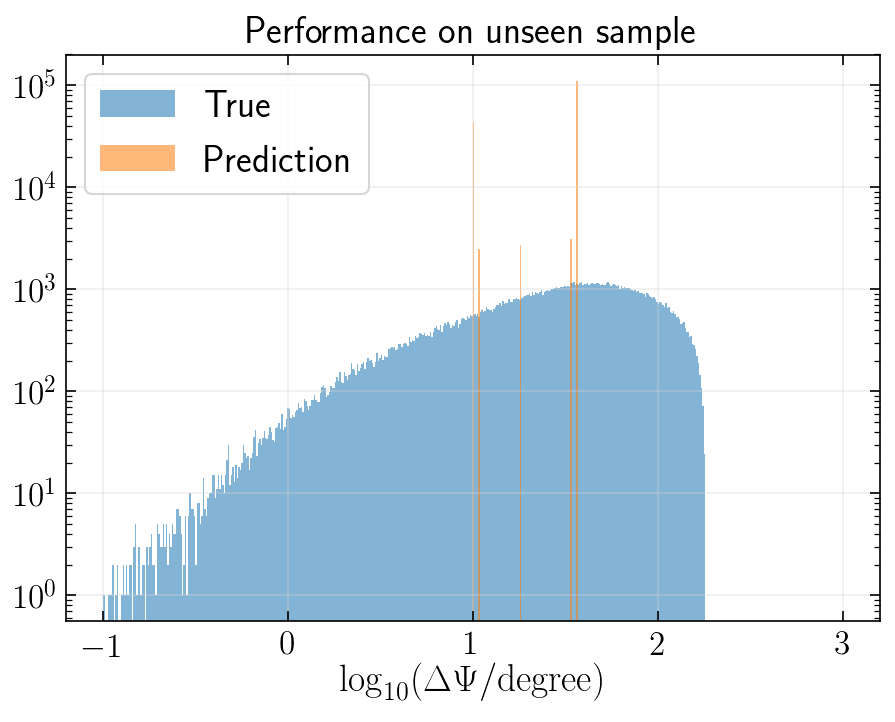

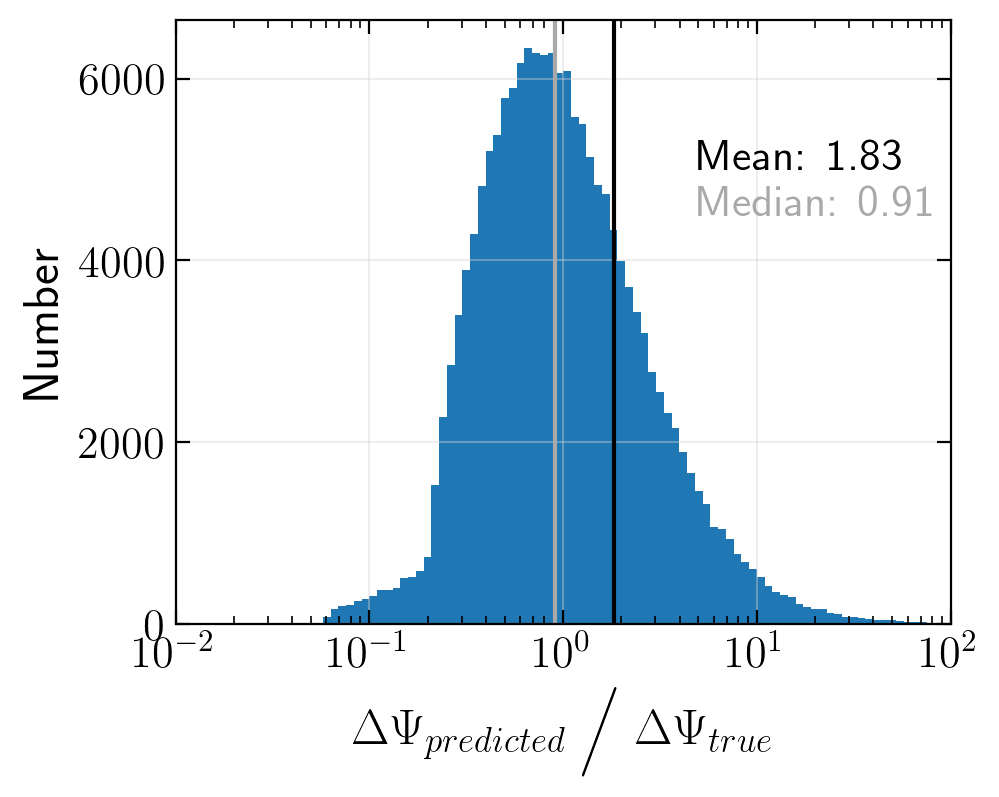

Ratio within factor of 2: 0.524261402398
Ratio within factor of 5: 0.905738536142


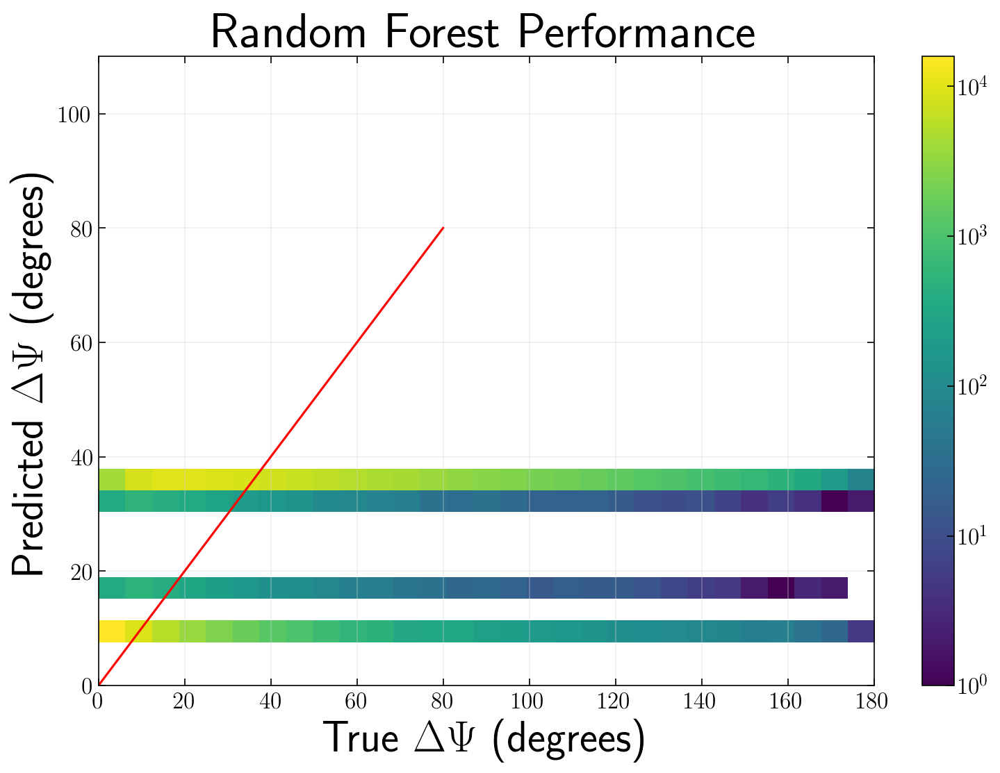

********************************************************************************
log: False	 standardized: True	 minsample: 10
********************************************************************************


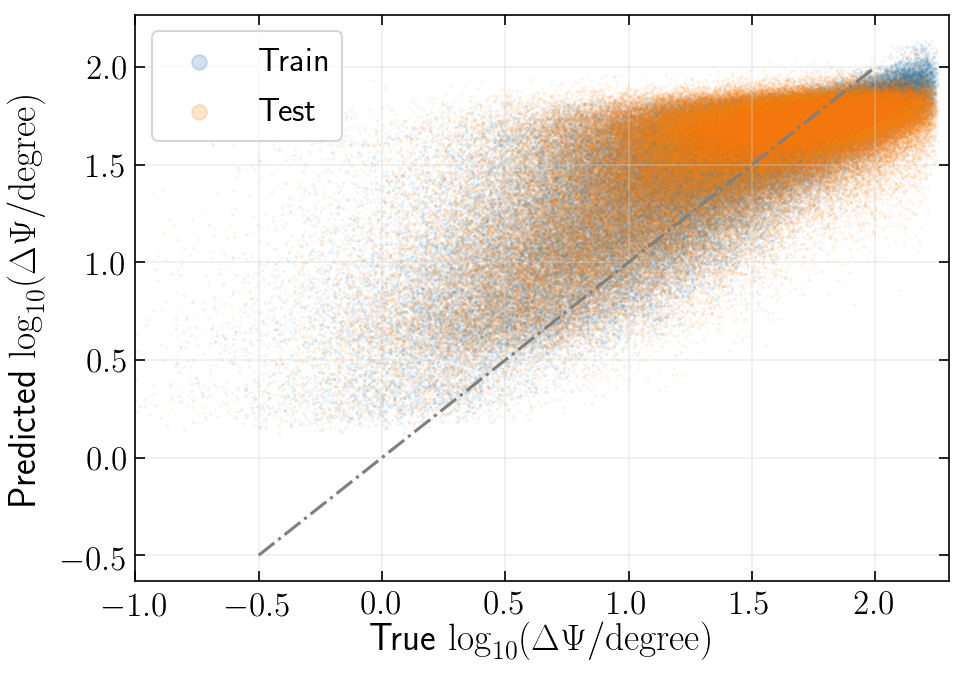

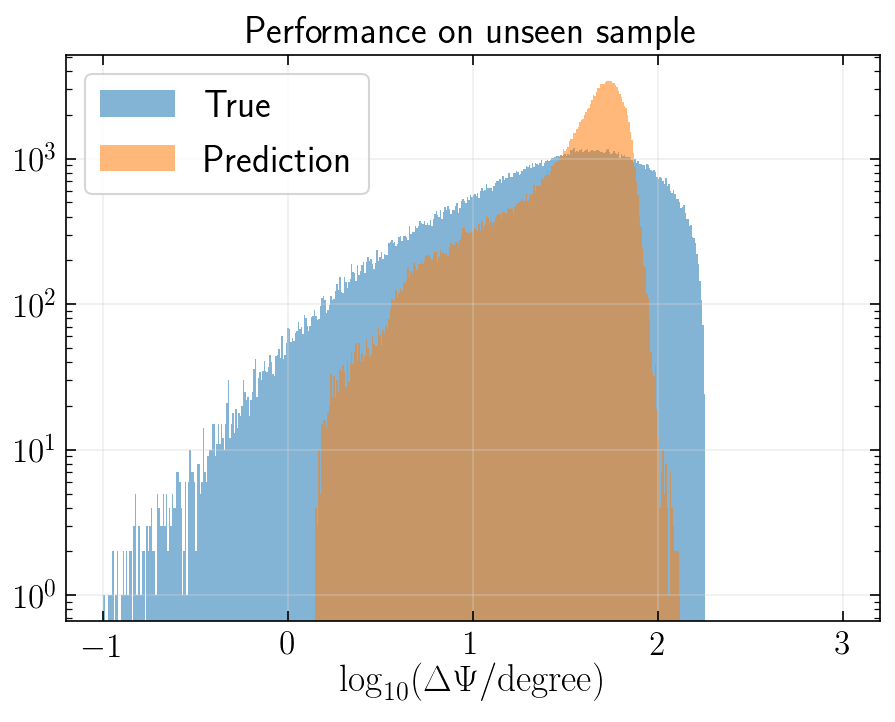

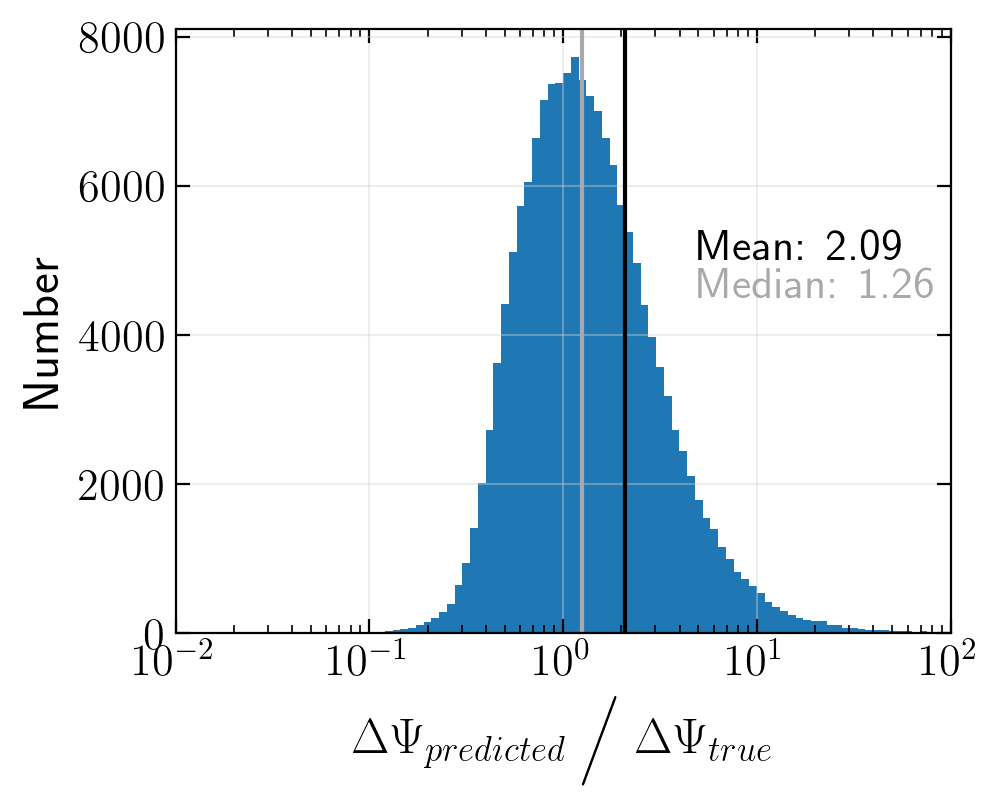

Ratio within factor of 2: 0.612266220876
Ratio within factor of 5: 0.924090543124


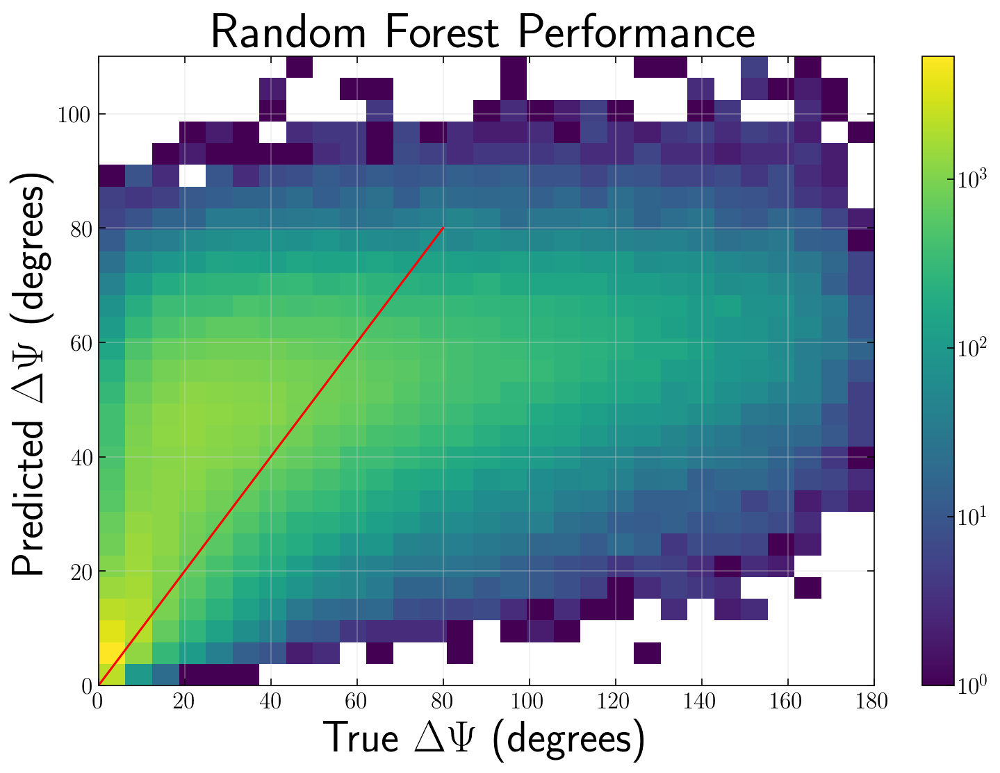

********************************************************************************
log: False	 standardized: True	 minsample: 100
********************************************************************************


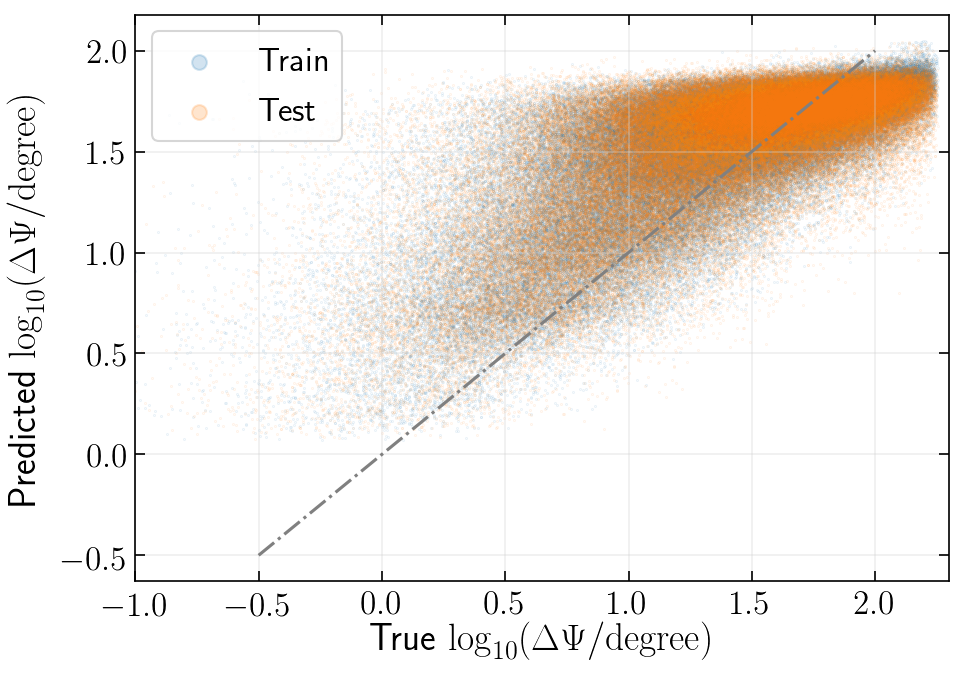

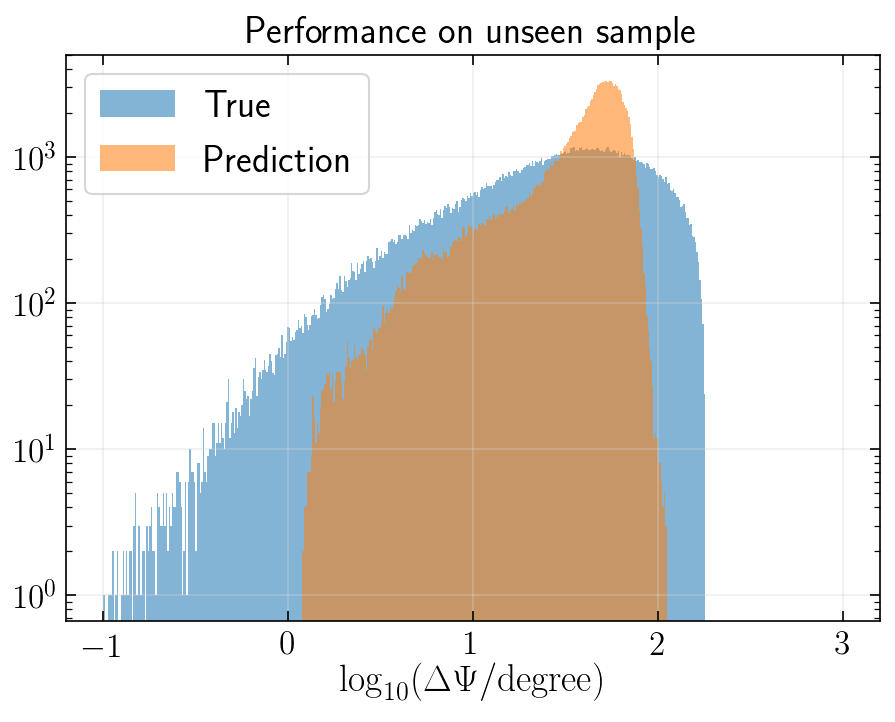

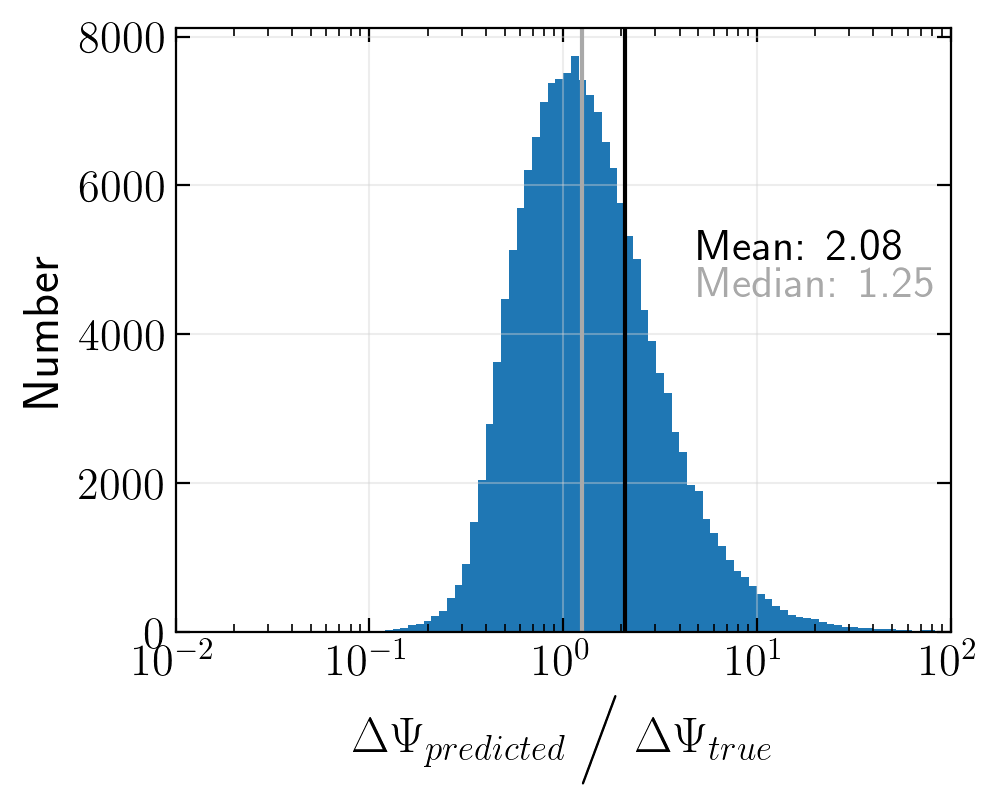

Ratio within factor of 2: 0.613022180976
Ratio within factor of 5: 0.923998352867


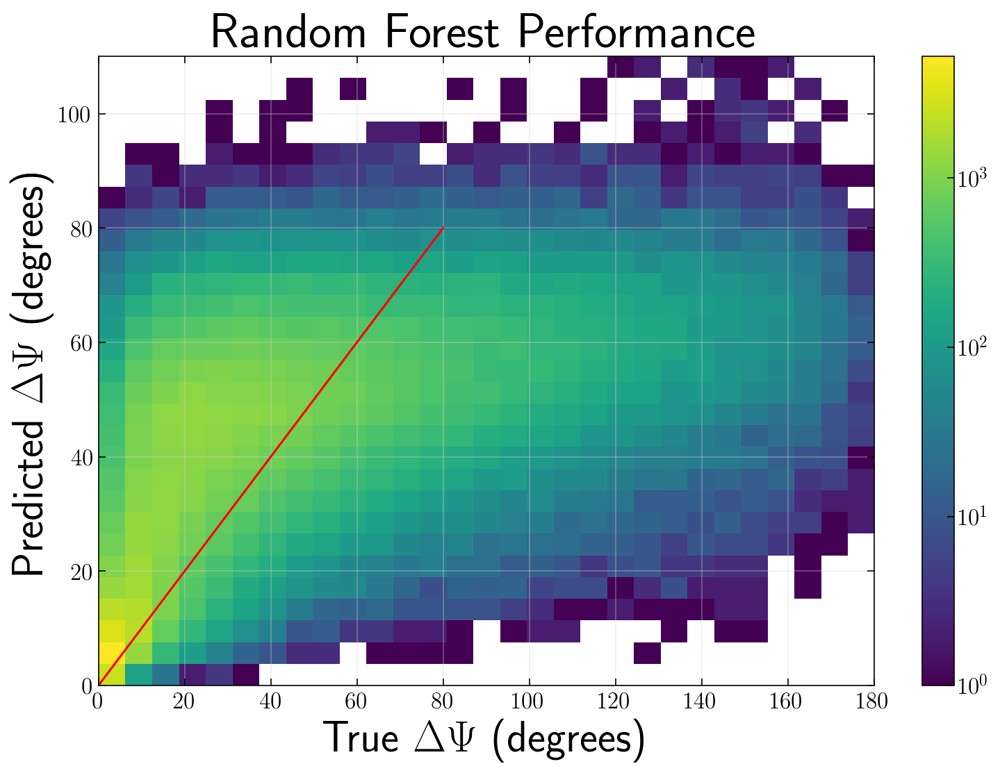

********************************************************************************
log: False	 standardized: True	 minsample: 1000
********************************************************************************


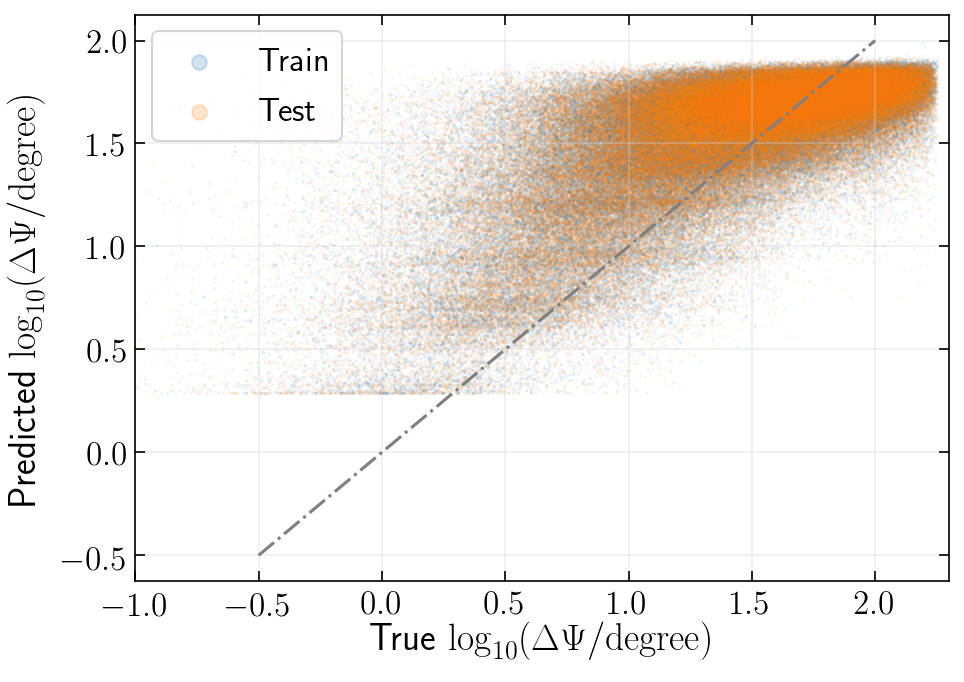

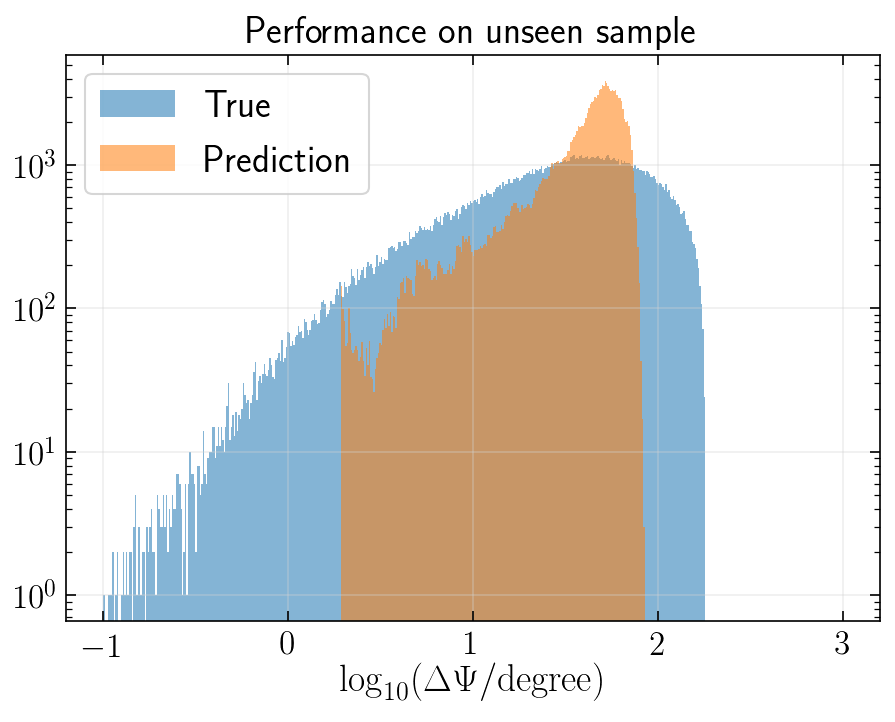

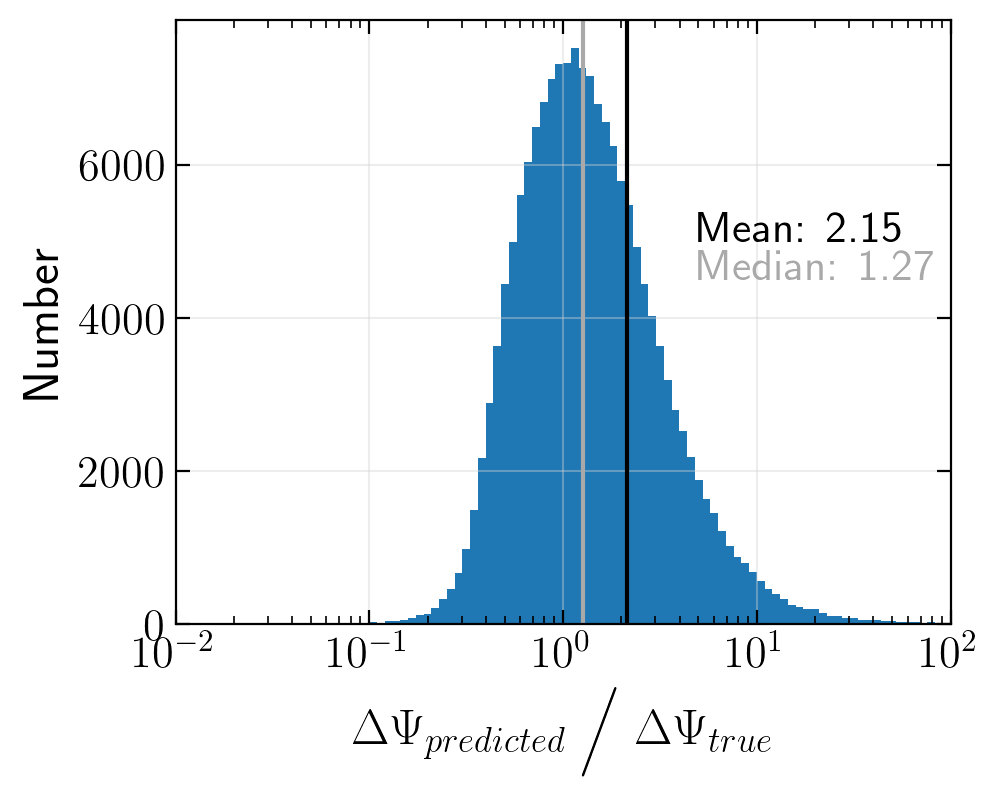

Ratio within factor of 2: 0.600250757497
Ratio within factor of 5: 0.91880496844


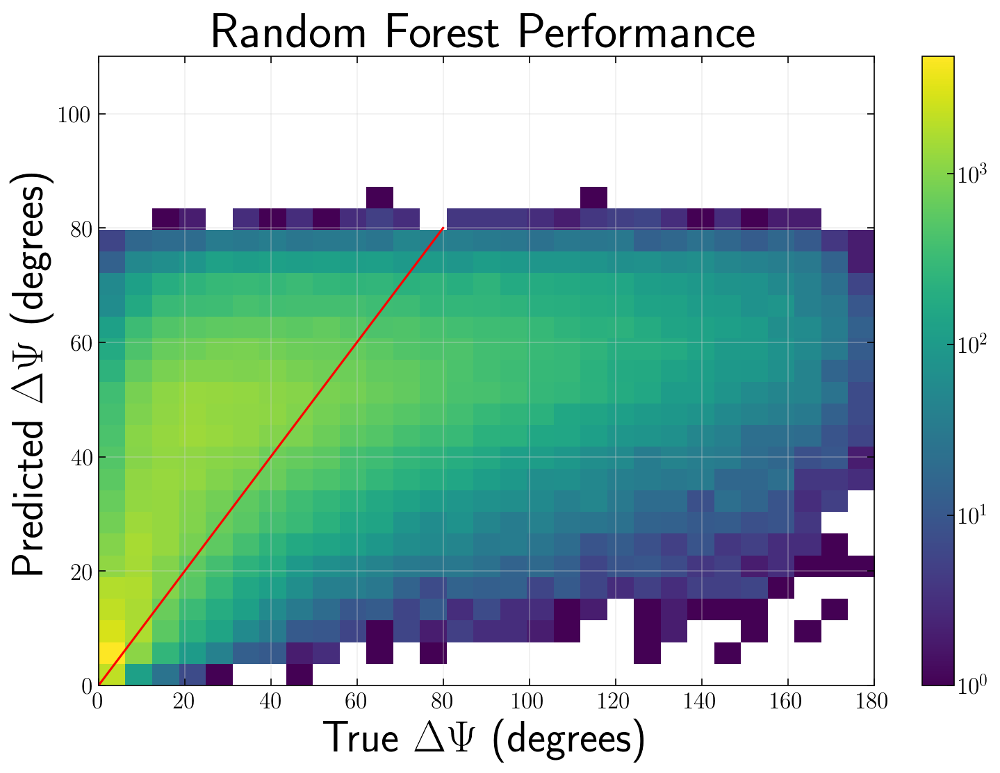

********************************************************************************
log: False	 standardized: True	 minsample: 10000
********************************************************************************


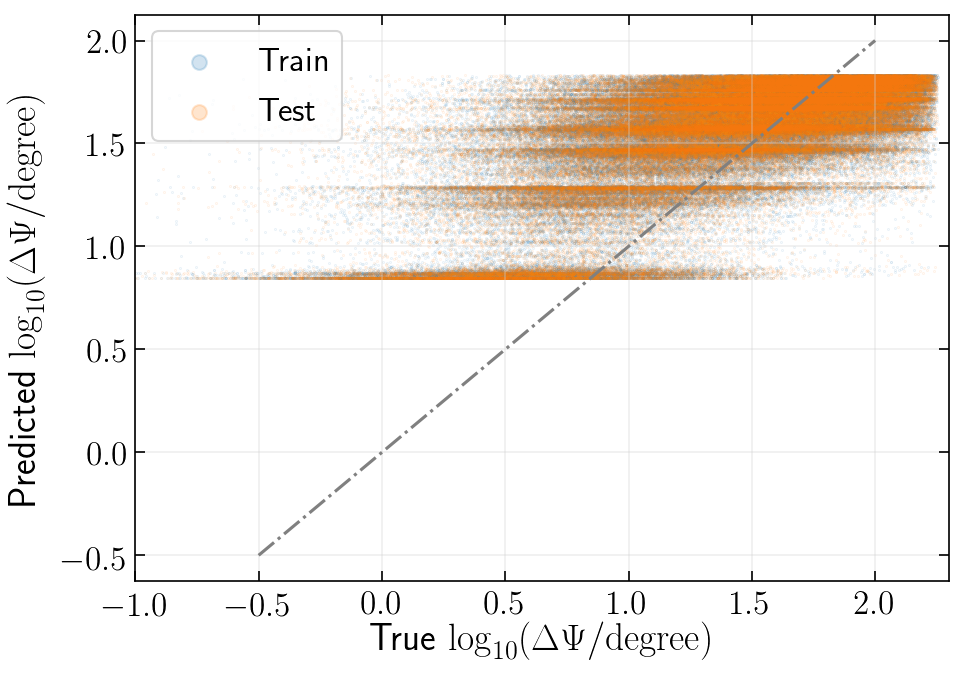

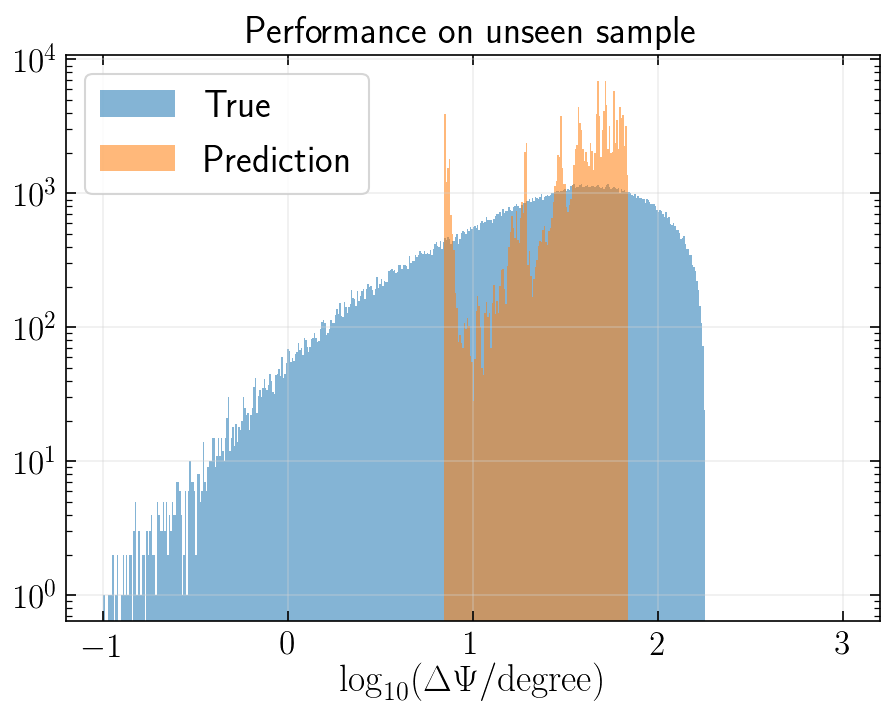

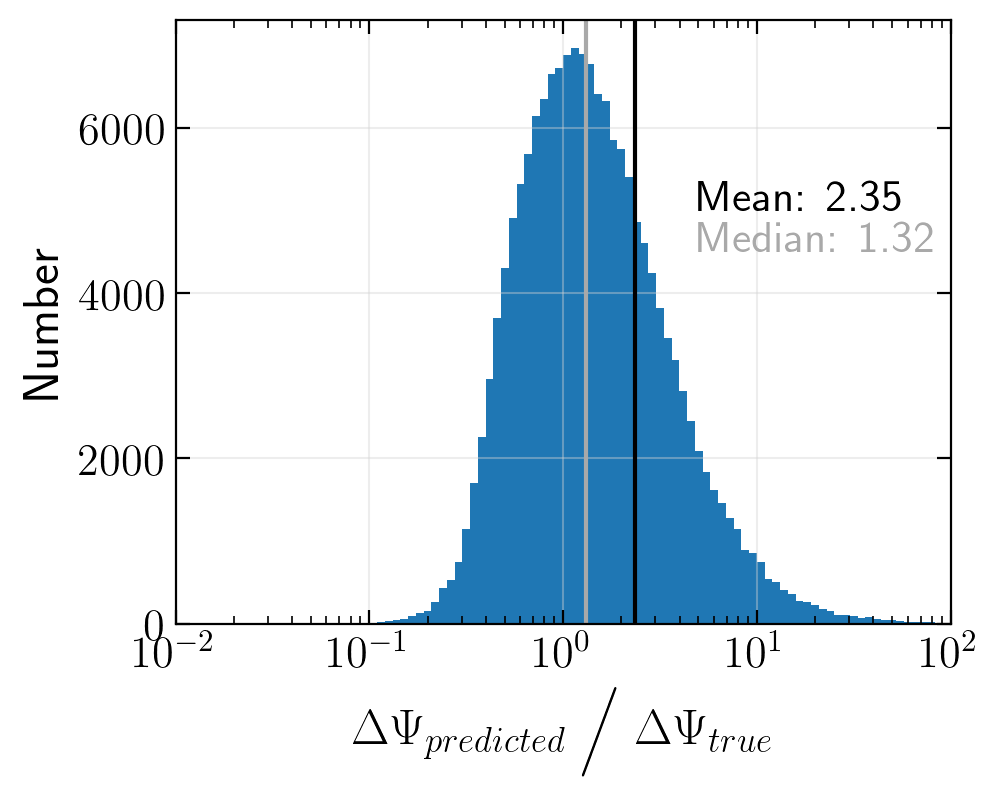

Ratio within factor of 2: 0.56687173877
Ratio within factor of 5: 0.901854253351


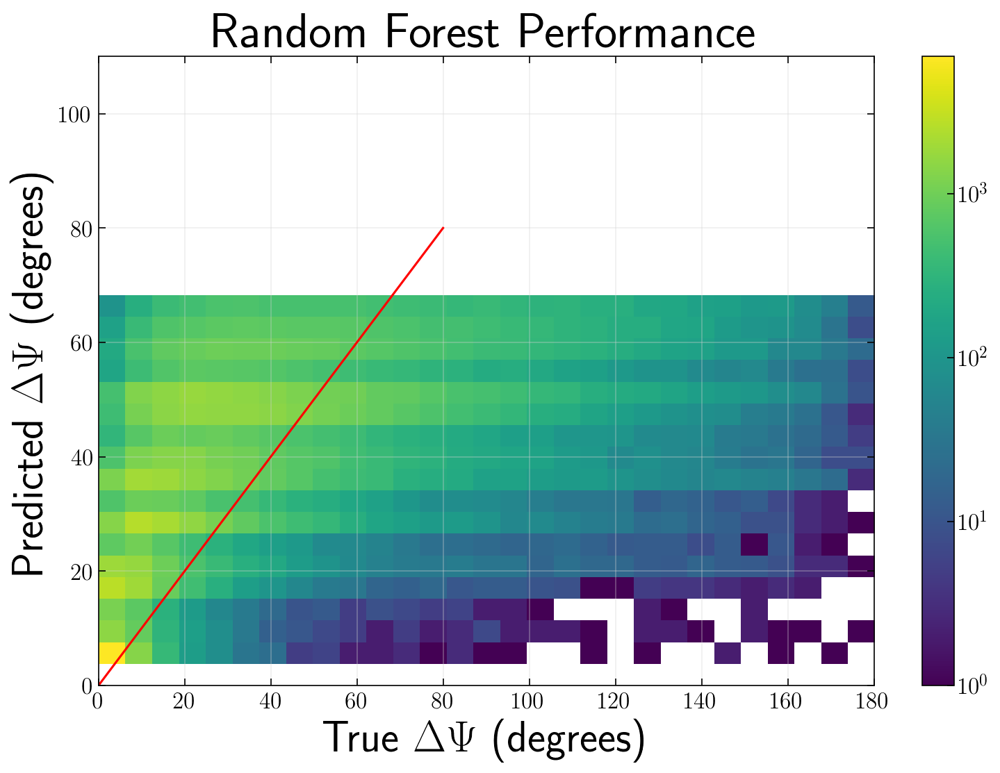

********************************************************************************
log: False	 standardized: True	 minsample: 100000
********************************************************************************


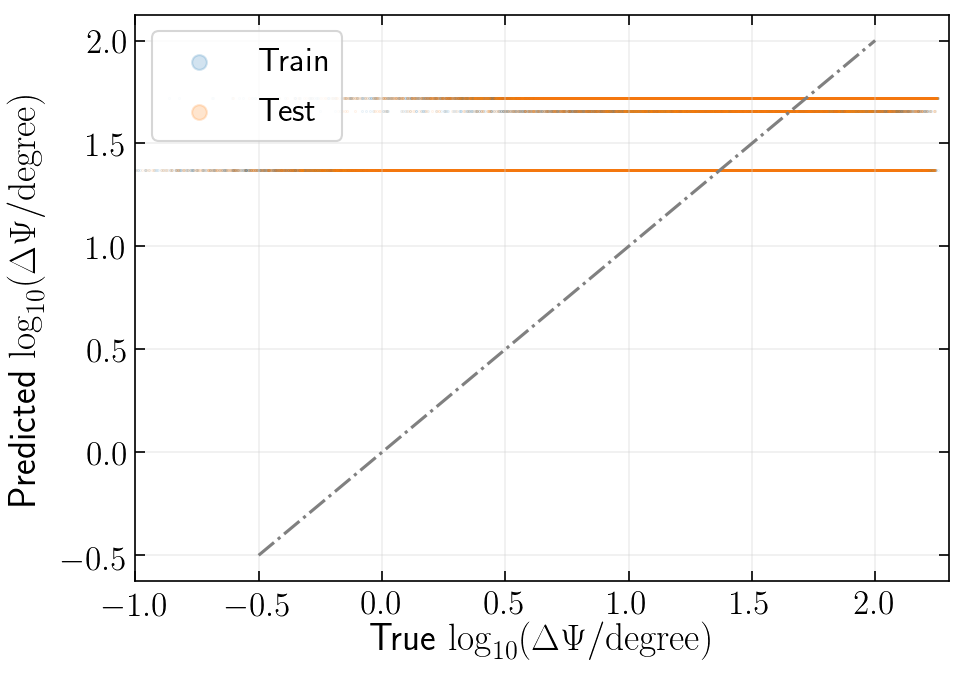

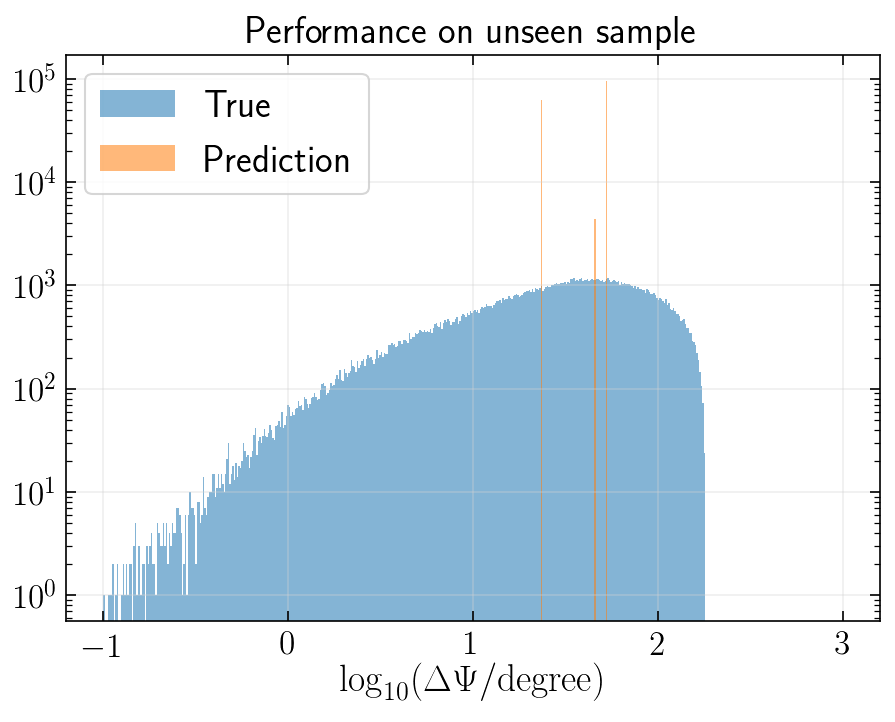

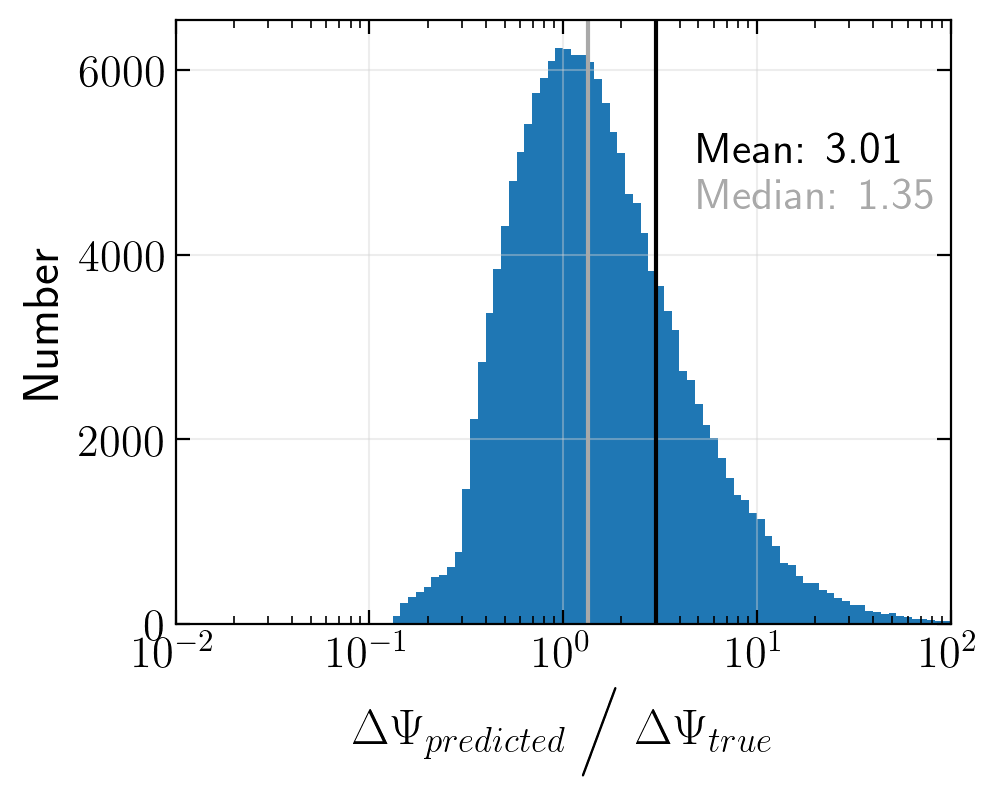

Ratio within factor of 2: 0.523625434833
Ratio within factor of 5: 0.858929603088


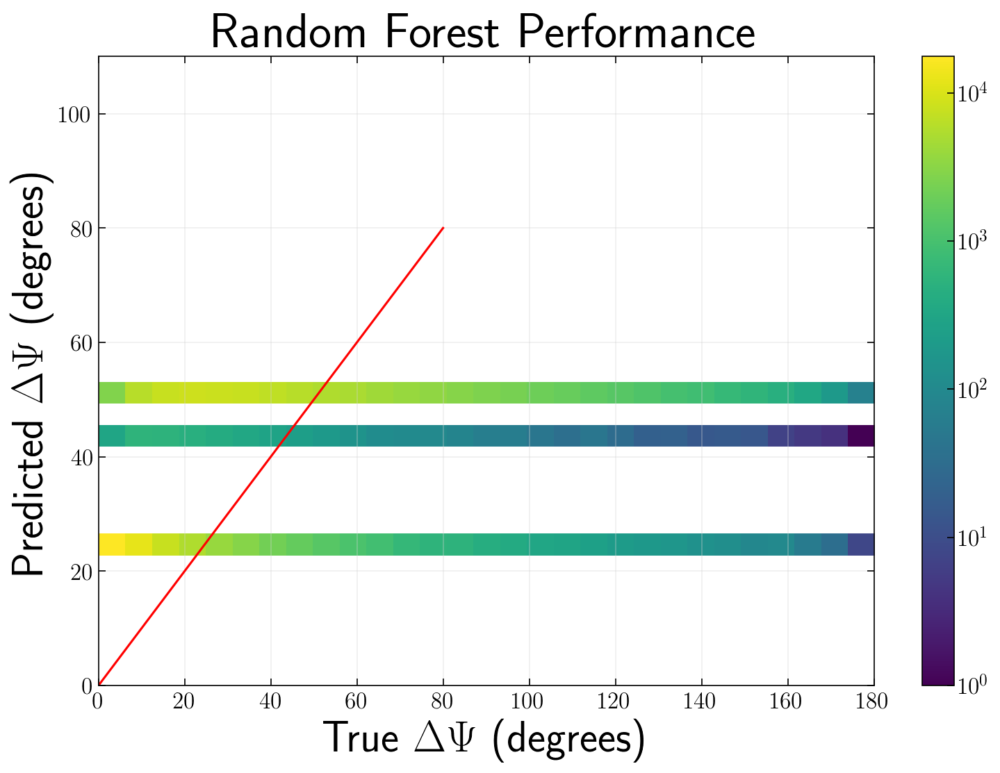

********************************************************************************
log: False	 standardized: False	 minsample: 10
********************************************************************************


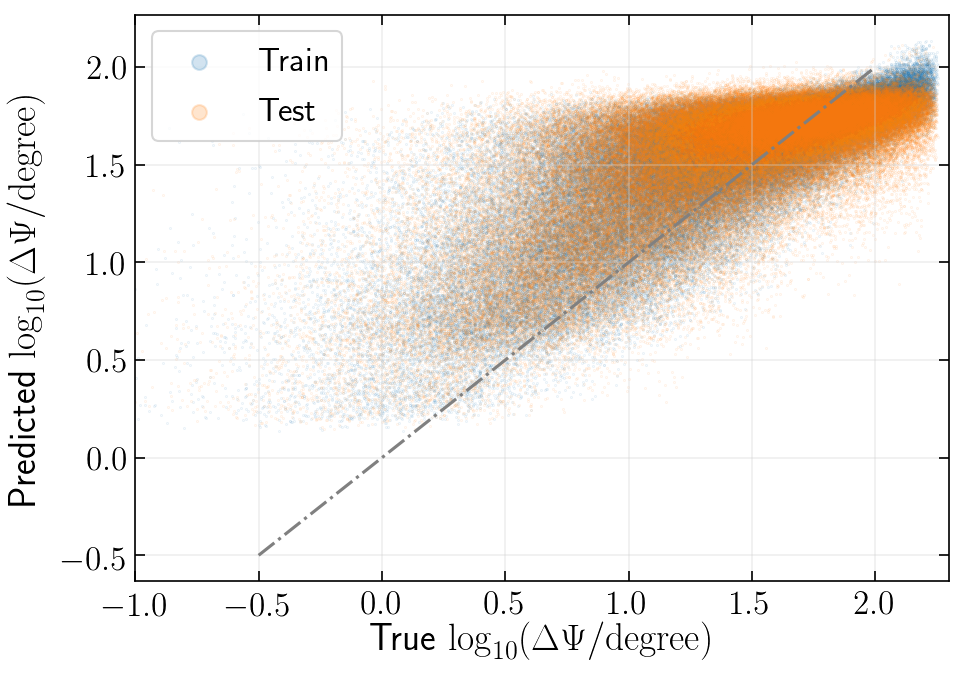

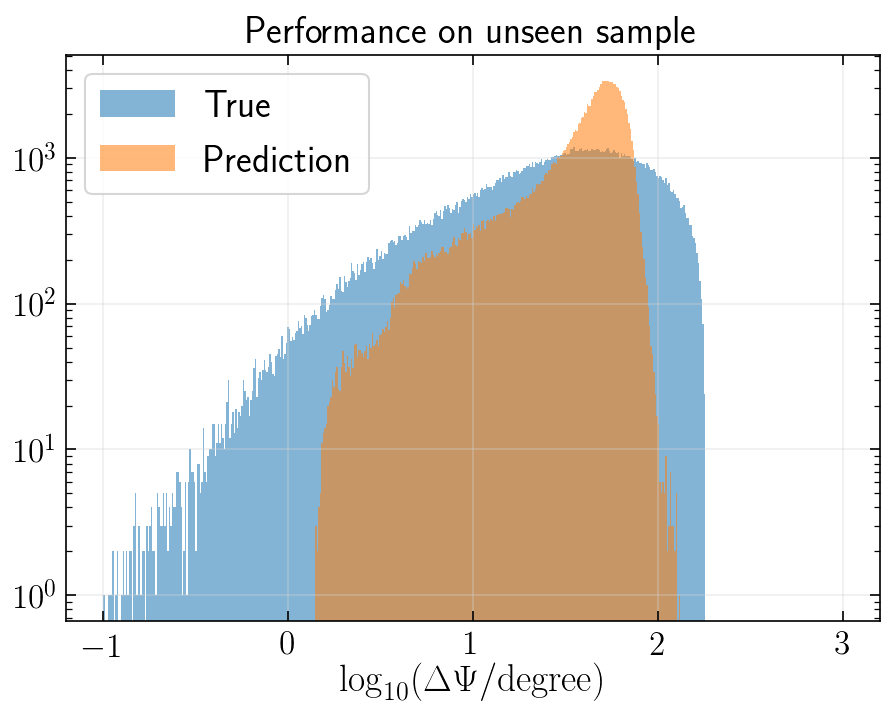

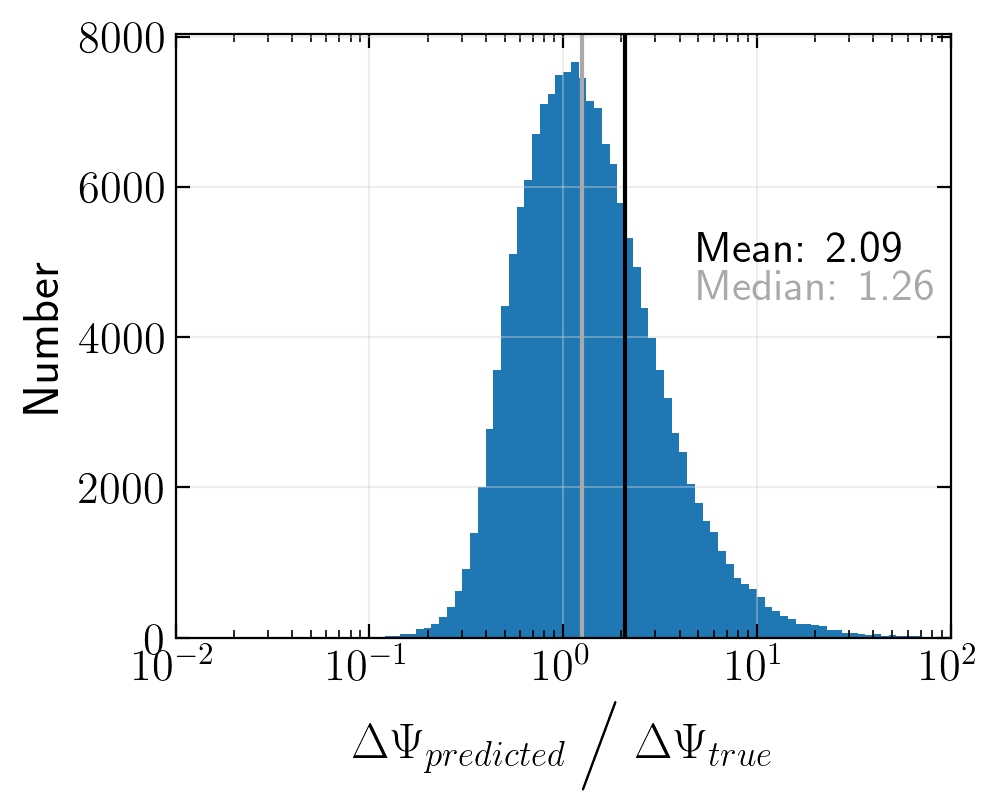

Ratio within factor of 2: 0.612204760705
Ratio within factor of 5: 0.923746366167


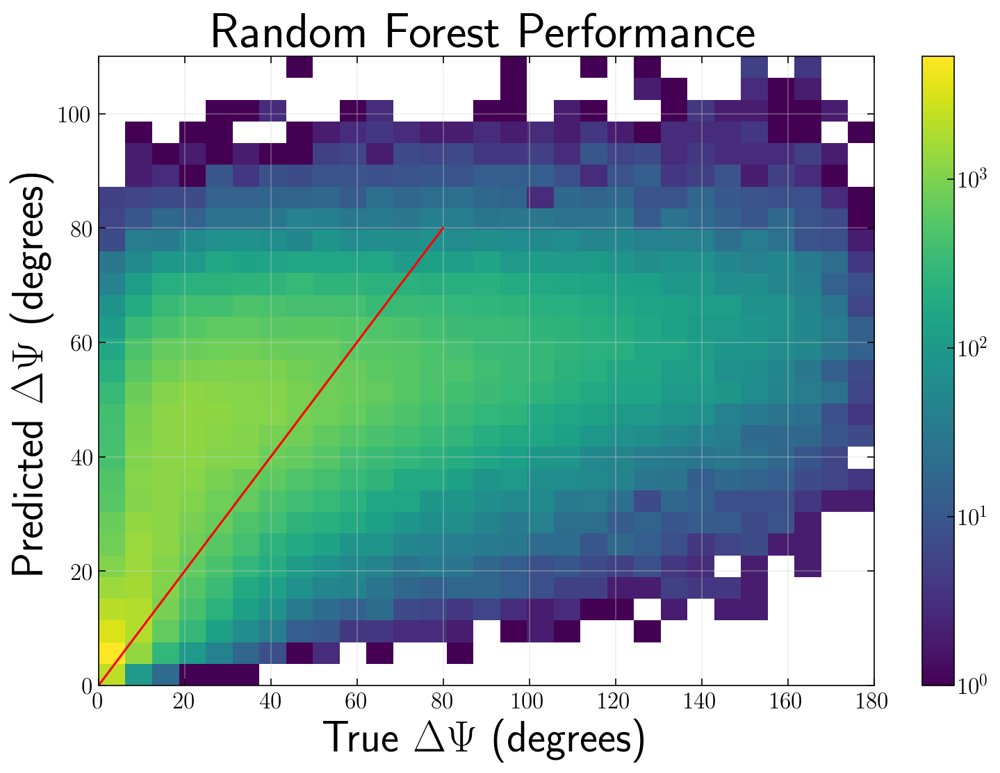

********************************************************************************
log: False	 standardized: False	 minsample: 100
********************************************************************************


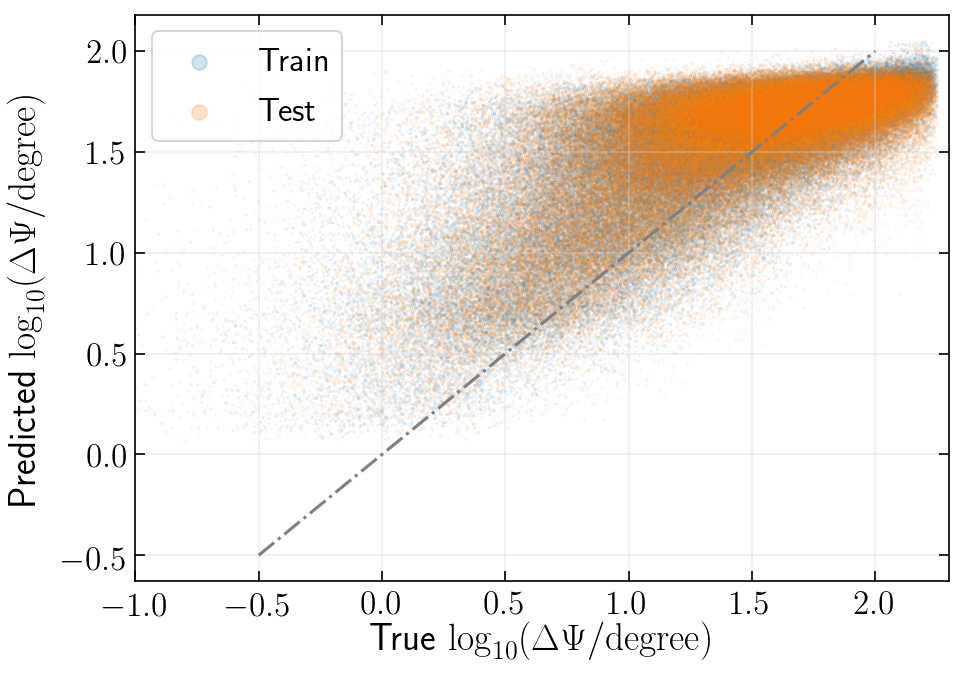

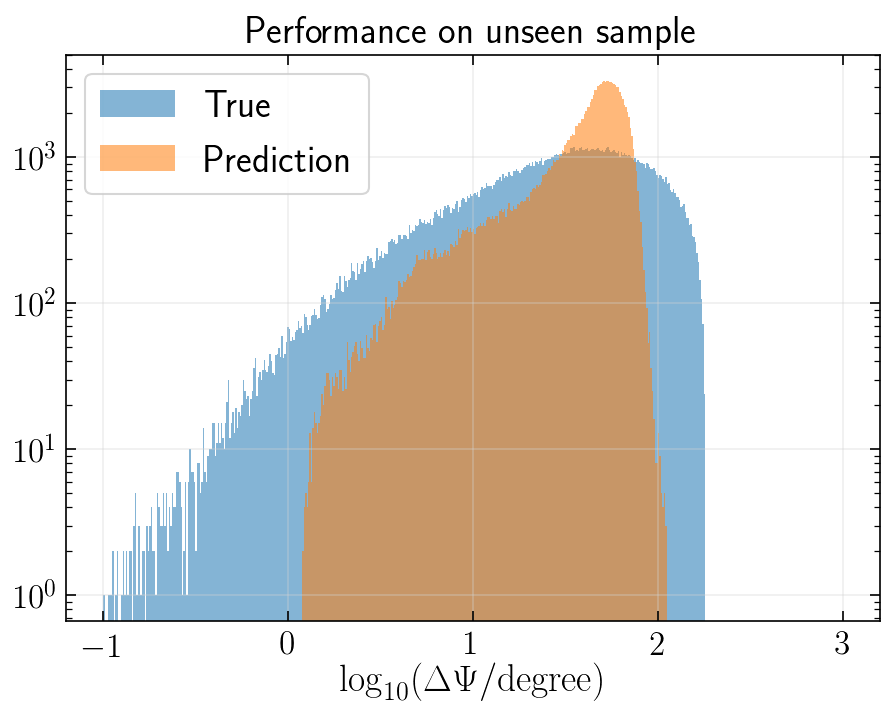

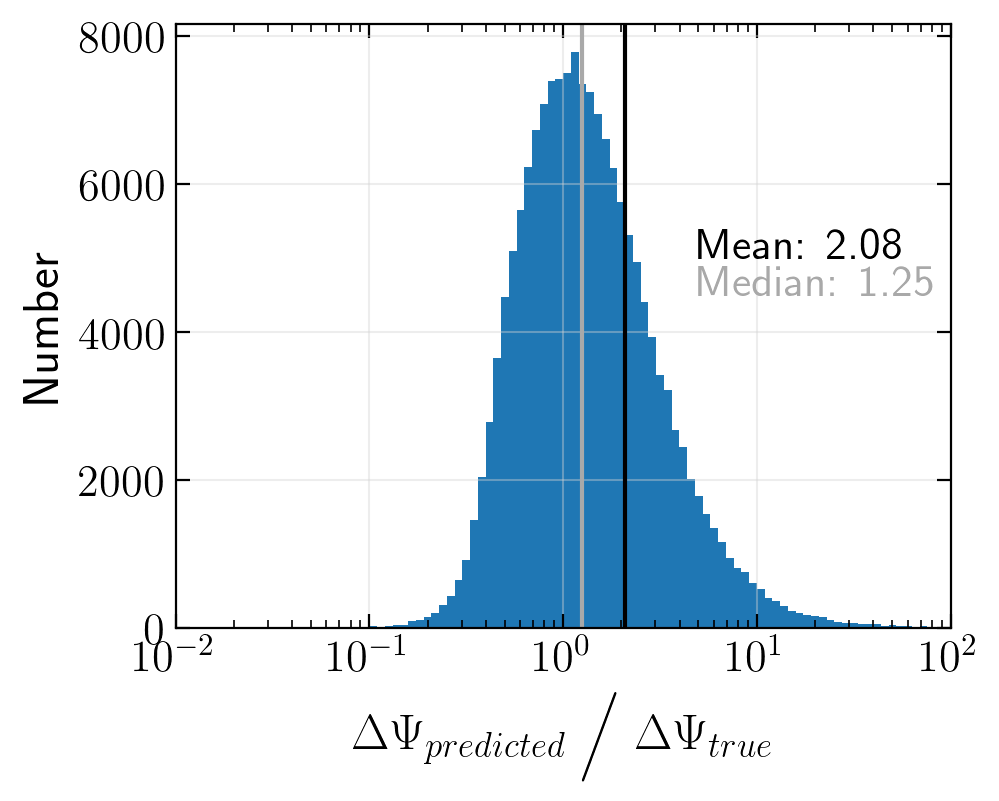

Ratio within factor of 2: 0.613194269454
Ratio within factor of 5: 0.924379405926


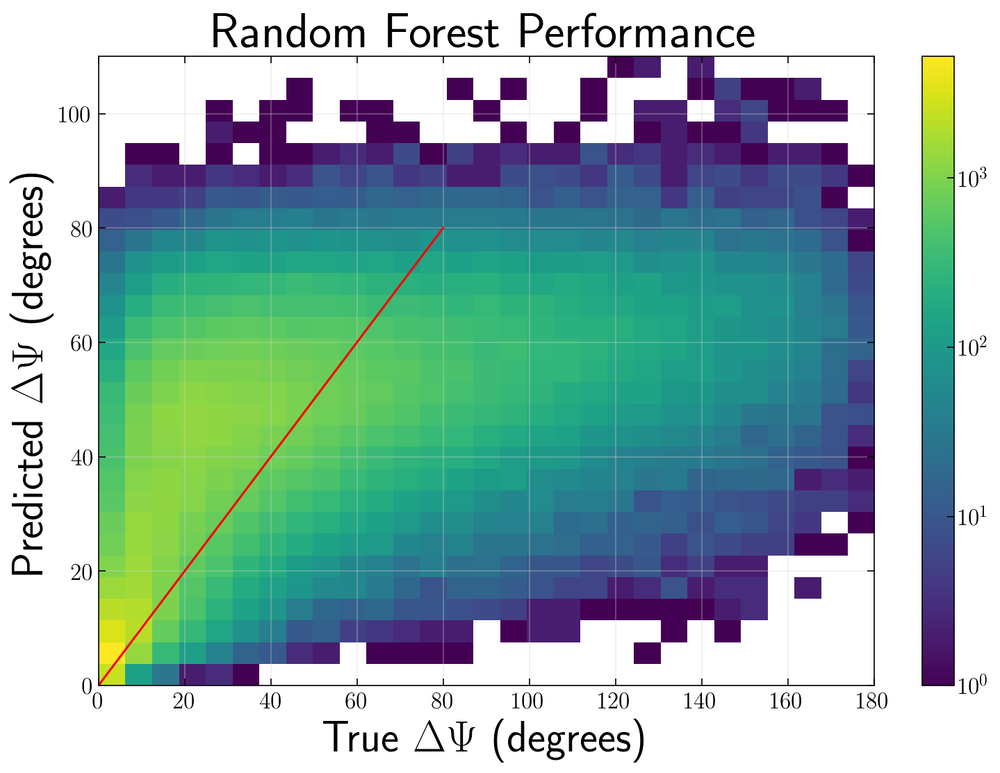

********************************************************************************
log: False	 standardized: False	 minsample: 1000
********************************************************************************


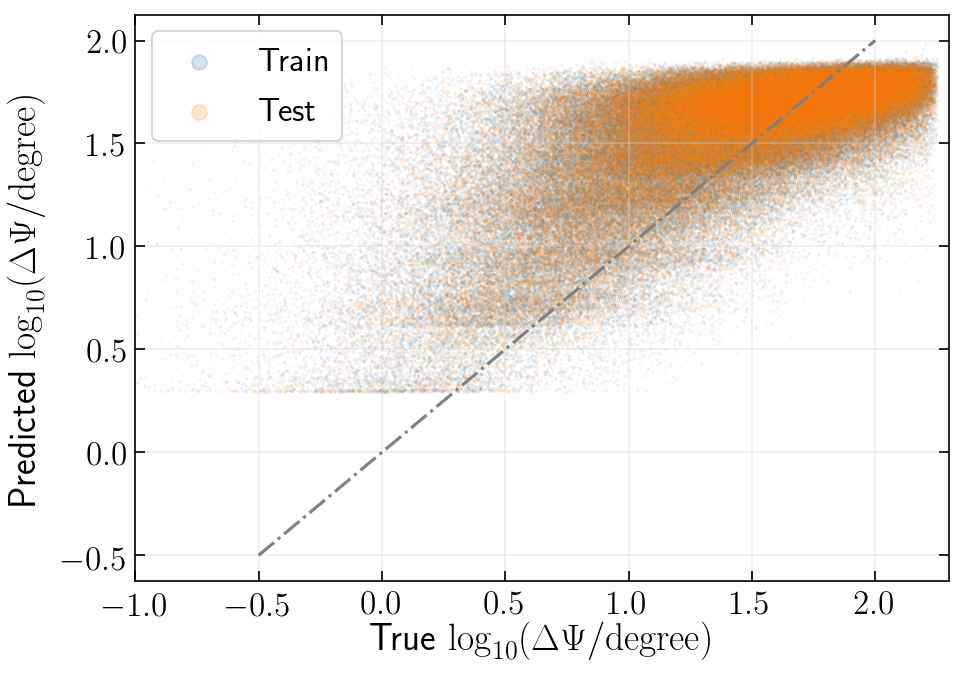

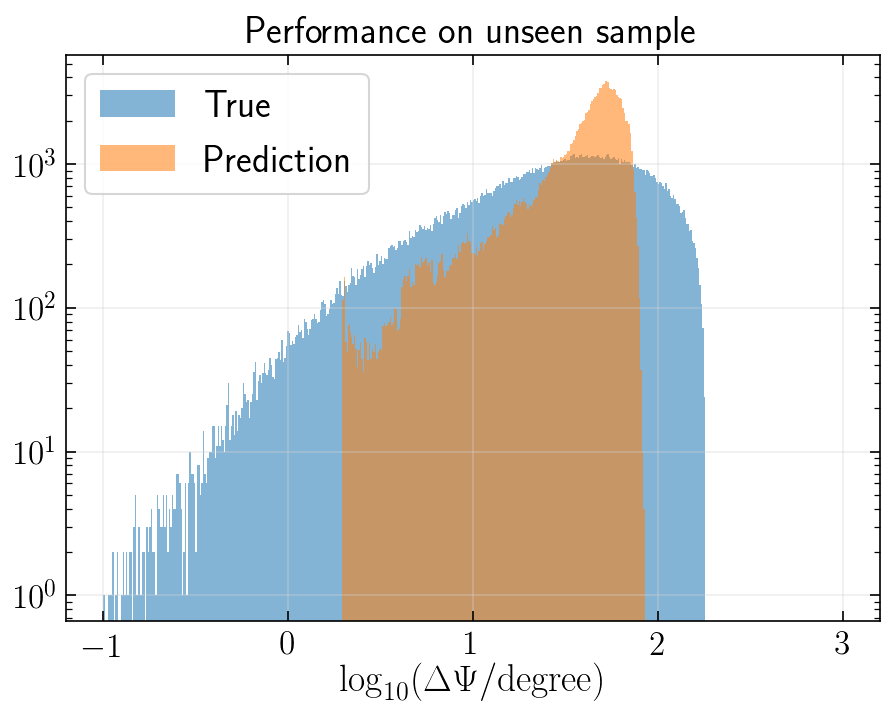

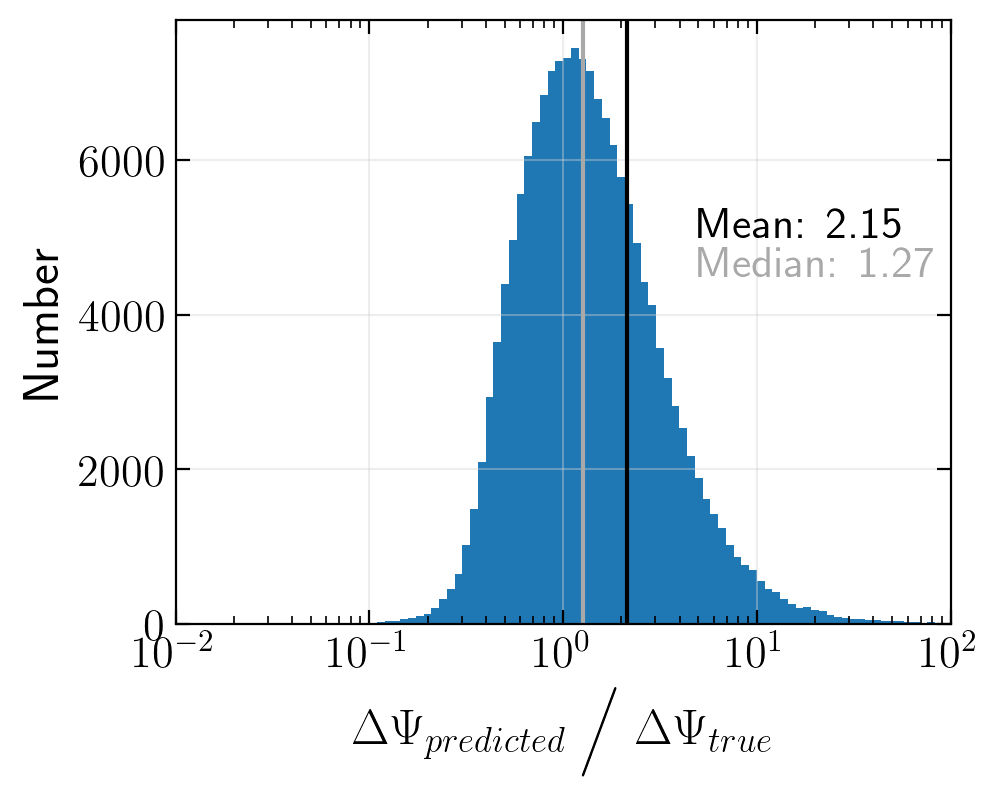

Ratio within factor of 2: 0.599771368165
Ratio within factor of 5: 0.91880496844


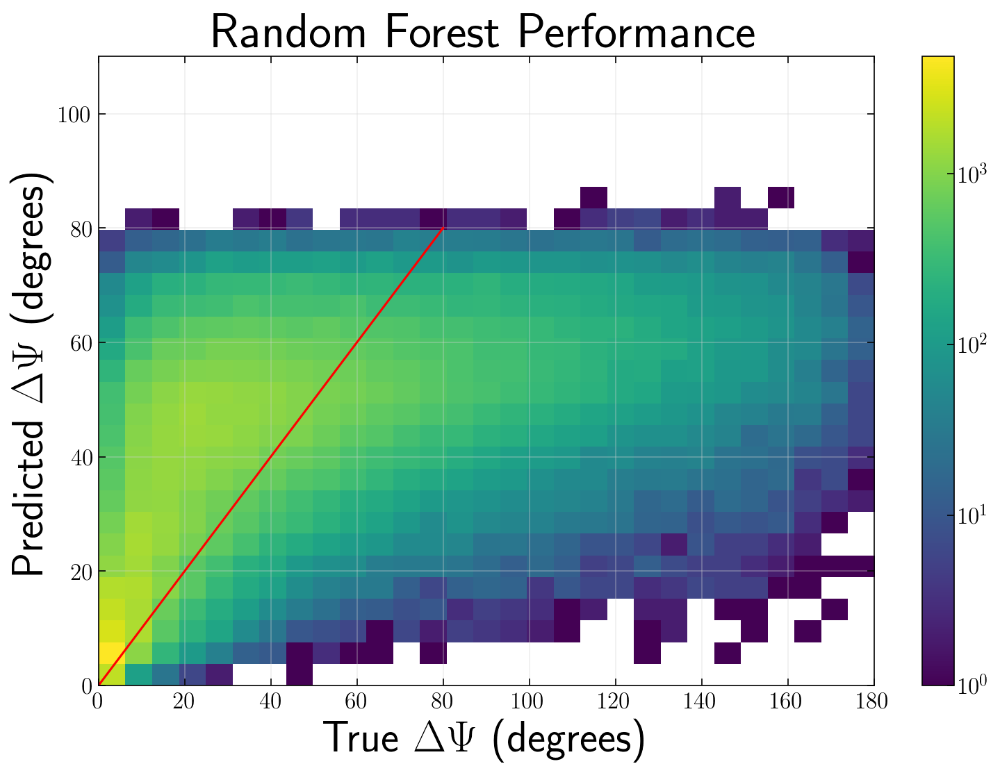

********************************************************************************
log: False	 standardized: False	 minsample: 10000
********************************************************************************


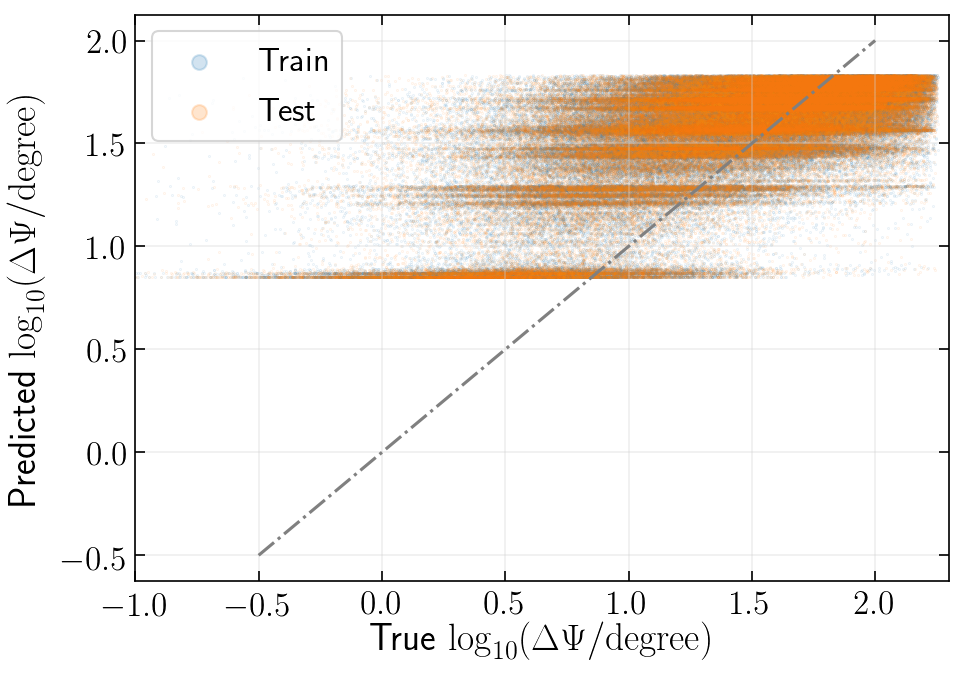

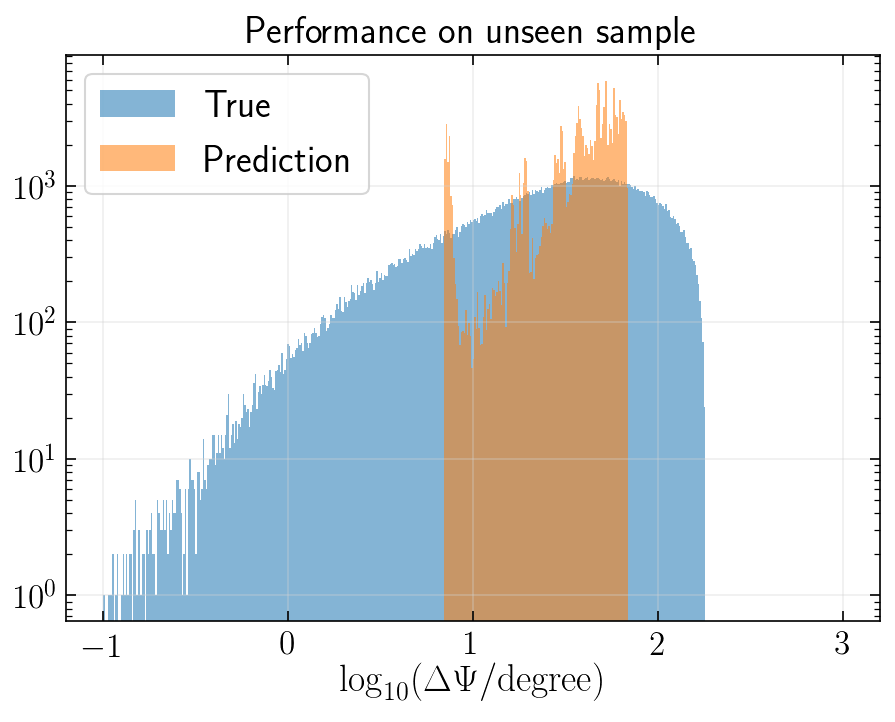

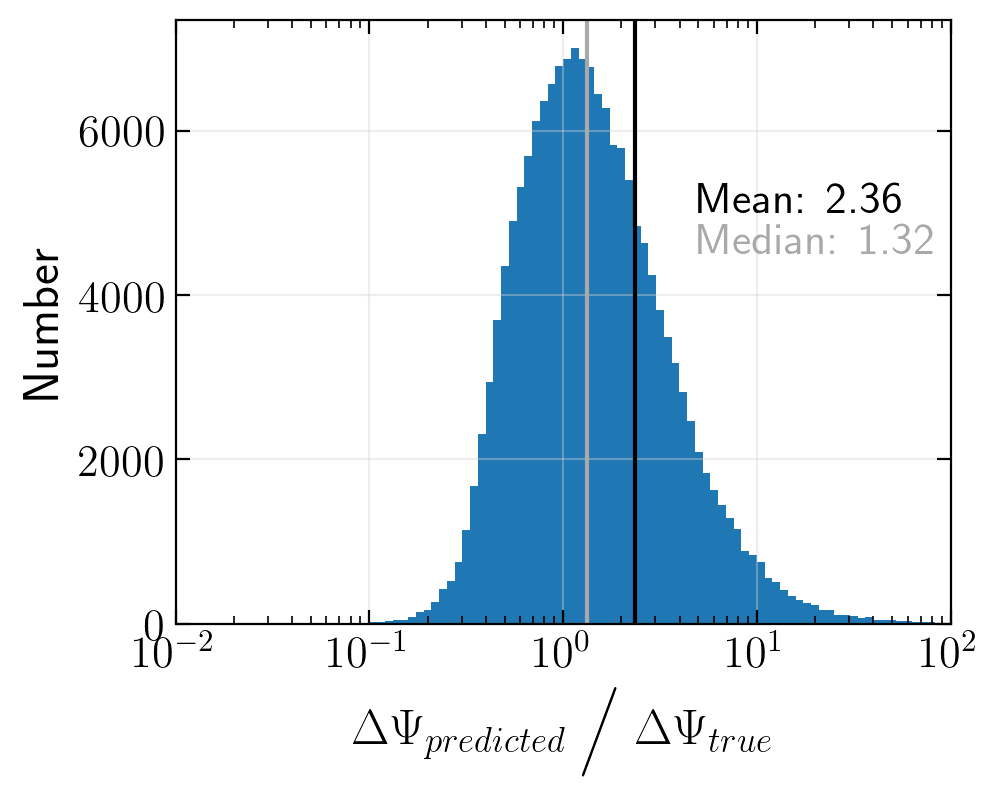

Ratio within factor of 2: 0.566656628172
Ratio within factor of 5: 0.901829669283


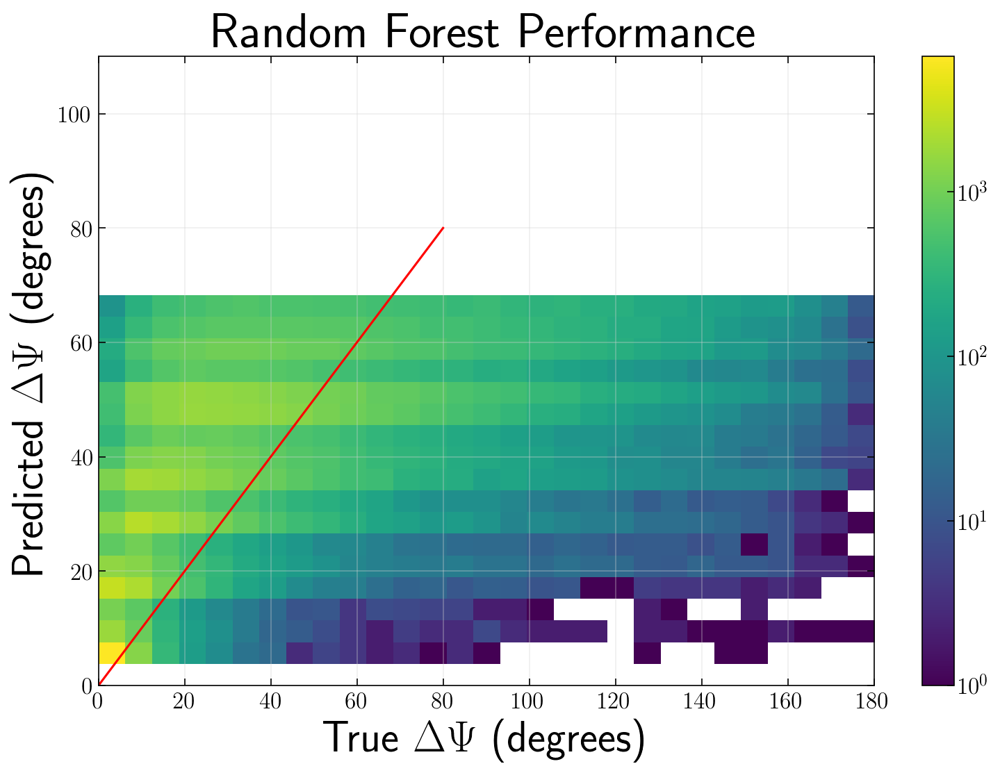

********************************************************************************
log: False	 standardized: False	 minsample: 100000
********************************************************************************


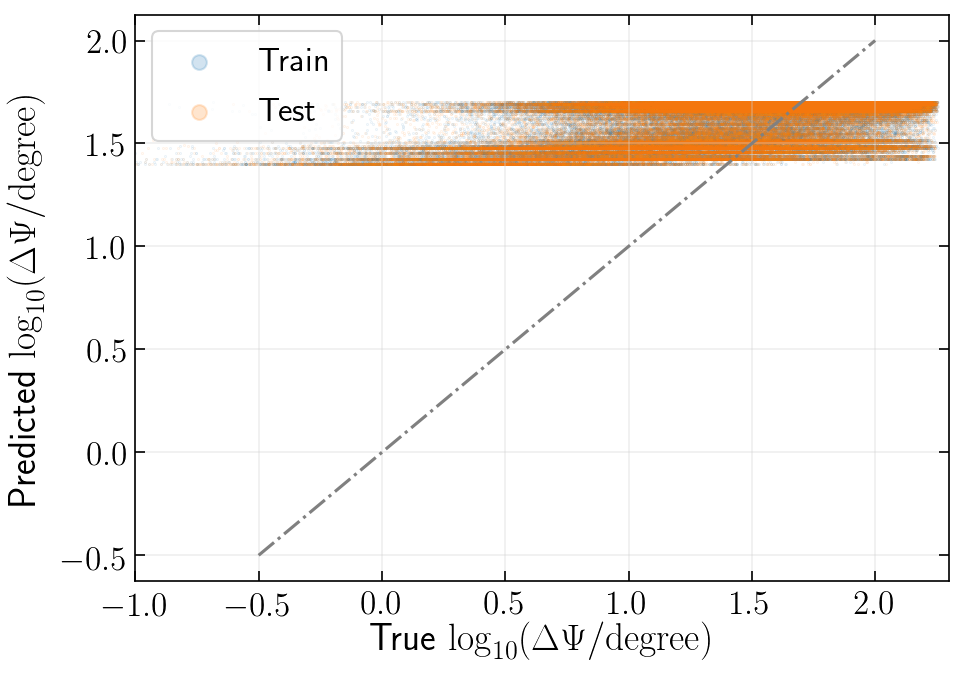

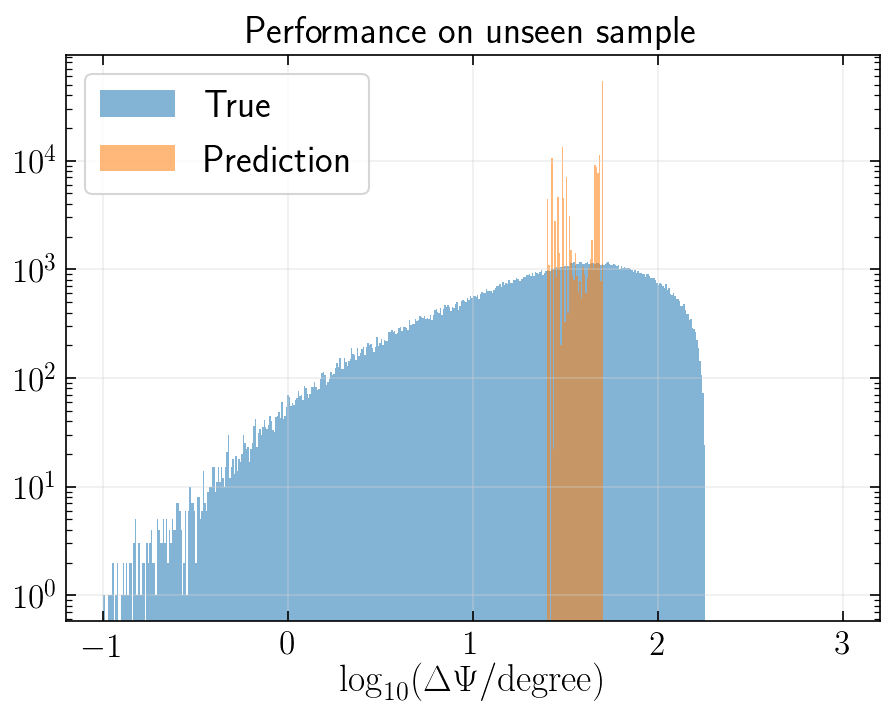

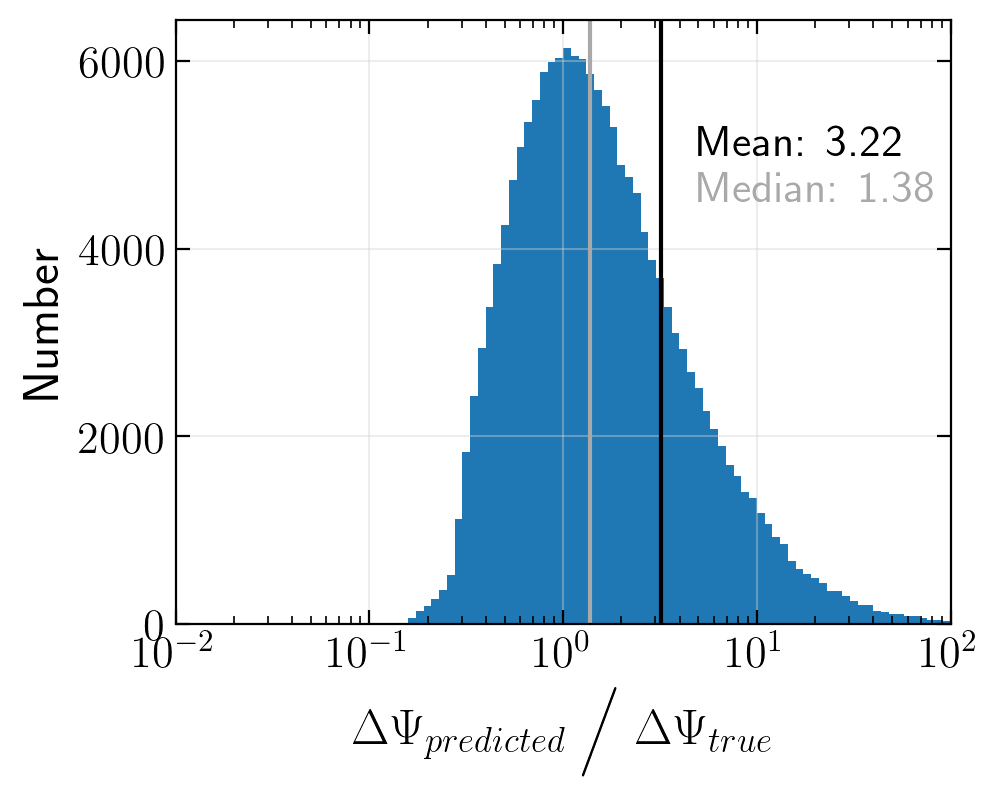

Ratio within factor of 2: 0.513459860116
Ratio within factor of 5: 0.851228596364


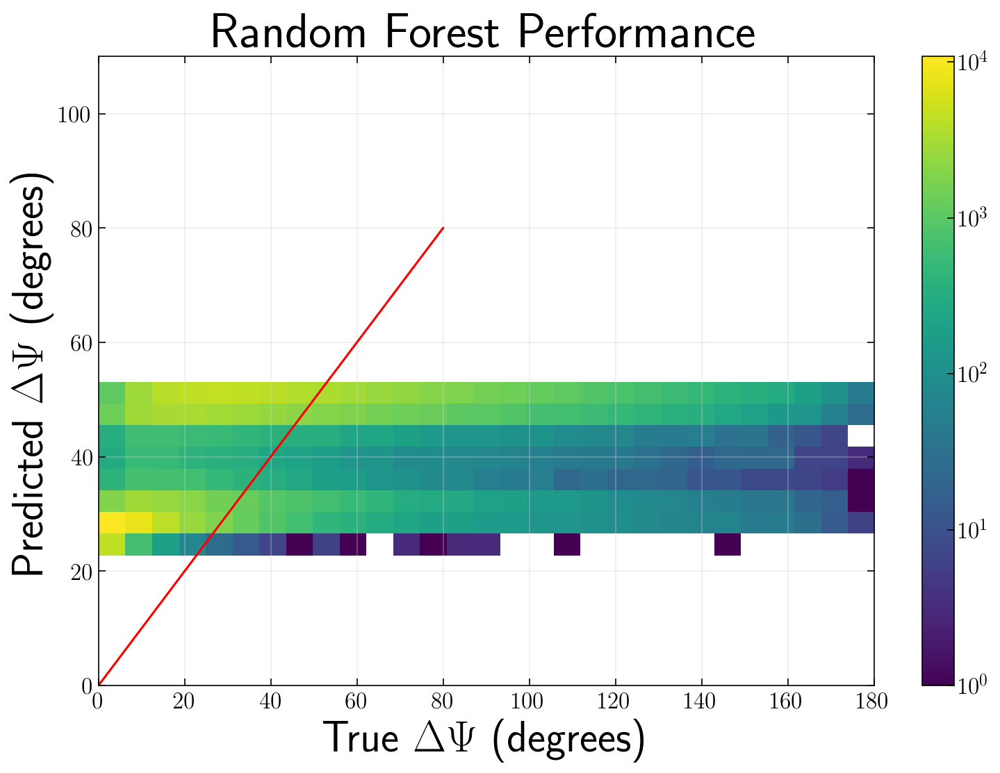

In [4]:
for logSeparation in [True, False]:
    for standardize in [True, False]:
        for minsamp in [10, 100, 1000, 10000, 100000]:

            neutrinos = np.load('/data/user/apizzuto/Nova/RandomForests/IC86_2012-2018MC_with_dpsi_with_Nstring.npy')
            neutrinos_df = pd.DataFrame.from_dict(neutrinos)
            neutrinos_df = neutrinos_df[np.abs(neutrinos_df['ptype']) == 14]

            neutrinos_df['int_type'] = np.where(neutrinos_df['iscc'] == False, 'NC', 'CC')
            neutrinos_df = neutrinos_df.drop(['run', 'event', 'subevent', 'angErr', 'trueE', 'azi', 'monopod_azi',
                                              'trueRa', 'trueDec', 'time', 'ptype', 'iscc',
                                              'trueDeltaLLH', 'ra', 'dec', 'monopod_ra', 'monopod_dec', 'ow'], axis = 'columns')
            old_names = neutrinos_df.columns
            new_names = [on.replace('_', ' ') for on in old_names]
            neutrinos_df.columns = new_names

            neutrinos_df = neutrinos_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
            scaled_nus = neutrinos_df.copy()
            if logSeparation:
                scaled_nus['true dpsi'] = np.log10(neutrinos_df['true dpsi'])
            else:
                scaled_nus['true dpsi'] = neutrinos_df['true dpsi']
            scaled_nus['monopod zen'] = np.cos(neutrinos_df['monopod zen'])
            scaled_nus['zen'] = np.cos(neutrinos_df['zen'])
            scaled_nus['pidMonopodLLH'] = np.log10(neutrinos_df['pidMonopodLLH'])
            #scaled_nus['monopod pegleg dpsi'] = np.power(neutrinos_df['monopod pegleg dpsi'], 0.5)
            #scaled_nus['pidLength'] = np.where(neutrinos_df['pidLength'] > 0., np.log10(neutrinos_df['pidLength']), 0.)
            scaled_nus = scaled_nus.drop(['int type'], axis = 'columns')

            neutrinos_df = scaled_nus.copy()

            feature_cols = list(neutrinos_df.keys())
            feature_cols.remove('true dpsi')

            X,y = neutrinos_df[feature_cols].values, neutrinos_df['true dpsi'].values

            X_train, X_test, y_train, y_test =  train_test_split(X, y,
                                                                 test_size=0.5,
                                                                 random_state=1)

            if standardize:
                stdsc = StandardScaler()
                X_train = stdsc.fit(X_train).transform(X_train)
                X_test = stdsc.transform(X_test)
            CVresults = pickle.load(open('/data/user/apizzuto/Nova/RandomForests/GridSearchResults_increased_depth_logSeparation_{}_standardize_{}_bootstrap_True_minsamples_{}'.format(logSeparation, standardize, minsamp)))
            best_forest = CVresults.best_estimator_
            print("*"*80)
            print("log: {}\t standardized: {}\t minsample: {}".format(logSeparation, standardize, minsamp))
            #print ("\n\nTraining model")
            print("*"*80)
            #best_forest.fit(X_train, y_train)
            y_train_pred = best_forest.predict(X_train)
            y_test_pred = best_forest.predict(X_test)

            fig, ax = plt.subplots(figsize = (7,5), dpi=150)

            if logSeparation:
                plt.scatter(np.log10((10.**y_train) * 180. / np.pi), np.log10((10.**y_train_pred)*180. / np.pi), s = 0.04, 
                            alpha = 0.2, label = 'Train')
                plt.scatter(np.log10((10.**y_test) * 180. / np.pi), np.log10((10.**y_test_pred)*180. / np.pi), s = 0.04, 
                            alpha = 0.2, label = 'Test')
            else:
                plt.scatter( np.log10(y_train * 180. / np.pi), np.log10(y_train_pred*180. / np.pi), s = 0.04, 
                            alpha = 0.2, label = 'Train')
                plt.scatter(np.log10(y_test * 180. / np.pi), np.log10(y_test_pred*180. / np.pi), s = 0.04, 
                            alpha = 0.2, label = 'Test')

            plt.plot(np.linspace(-0.5, 2., 500), np.linspace(-0.5, 2., 500), ls = '-.', c = 'gray')
            plt.xlim(-1, 2.3)
            lgnd = plt.legend(loc=2, fontsize=16)
            plt.xlabel(r'True $\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 18)
            plt.ylabel(r'Predicted $\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 18)

            lgnd.legendHandles[0]._sizes = [50]
            lgnd.legendHandles[1]._sizes = [50]
            plt.show()

            plt.figure(figsize = (7,5), dpi=150)
            x_vals = np.linspace(-1,3.0,500)
            if logSeparation:
                plt.hist(np.log10((10.**y_test)*180. / np.pi), bins = x_vals, alpha = 0.55, label = "True")
                plt.hist(np.log10((10.**y_test_pred)*180. / np.pi), bins = x_vals, alpha = 0.55, label = "Prediction")
            else: 
                plt.hist(np.log10(y_test* 180. / np.pi), bins = x_vals, alpha = 0.55, label = "True")
                plt.hist(np.log10(y_test_pred* 180. / np.pi), bins = x_vals, alpha = 0.55, label = "Prediction")
            plt.legend(loc = 2, fontsize = 18)
            plt.yscale('log')
            plt.xlabel(r'$\log_{10}(\Delta \Psi / \textrm{degree})$', fontsize = 18)
            plt.title("Performance on unseen sample", fontsize = 18)
            plt.show()

            if logSeparation:
                residual_quotient = np.power(10, y_test_pred) / np.power(10, y_test)
            else:
                residual_quotient = y_test_pred / y_test
            f = plt.figure(figsize=(5,4), dpi=200)

            h = plt.hist(residual_quotient, bins = np.logspace(-3.,3.,151))

            mean = np.mean(residual_quotient)
            median = np.median(residual_quotient)

            plt.axvline(mean, color = 'k')
            plt.axvline(median, color = 'darkgrey')
            plt.text(5e0, 5000, 'Mean: {:.2f}'.format(mean), color = 'k')
            plt.text(5e0, 4500., 'Median: {:.2f}'.format(median), color = 'darkgrey')

            #plt.yscale('log')
            plt.xlabel("$ \Delta\Psi_{predicted} \; \Bigg/ \; \Delta\Psi_{true}$")
            plt.xscale('log')
            plt.ylabel('Number')
            plt.xlim(1e-2, 1e2)
            plt.show()
            
            mask = h[1] < 0.5
            mask += h[1] > 2.
            mask = ~mask
            hist = np.append(h[0][0], h[0])
            print "Ratio within factor of 2: {}".format(np.sum(hist[mask]) / np.sum(h[0]))

            mask = h[1] < 0.2
            mask += h[1] > 5.
            mask = ~mask

            hist = np.append(h[0][0], h[0])
            print "Ratio within factor of 5: {}".format(np.sum(hist[mask]) / np.sum(h[0]))
            
            f = plt.figure(figsize=(12,8), dpi=150)
            ax = f.add_subplot(111)

            if logSeparation:
                cax = ax.hist2d(np.power(10,y_test)*180. / np.pi, np.power(10, y_test_pred)*180. / np.pi, 
                       bins = [np.linspace(0,180.,30), np.linspace(0,110,30)], 
                        cmap = 'viridis', norm=LogNorm())
            else:
                cax = ax.hist2d(y_test*180. / np.pi, y_test_pred*180. / np.pi, 
                       bins = [np.linspace(0,180.,30), np.linspace(0,110,30)], 
                        cmap = 'viridis', norm=LogNorm())
            ax.plot(np.linspace(0., 80., 100), np.linspace(0., 80., 100), color = 'r')
            ax.set_title('Random Forest Performance', fontsize = 34)
            plt.xlabel(r'True $\Delta\Psi$ (degrees)', fontsize = 30)
            plt.ylabel(r'Predicted $\Delta\Psi$ (degrees)', fontsize = 30)
            plt.colorbar(cax[3], ax=ax, ticks=[1, 1e1, 1e2, 1e3, 1e4])
            plt.show()

In [ ]:
logSeparation = True
minsamp = 100
standardize = True

neutrinos = np.load('/data/user/apizzuto/Nova/RandomForests/IC86_2012-2018MC_with_dpsi_with_Nstring.npy')
neutrinos_df = pd.DataFrame.from_dict(neutrinos)
neutrinos_df = neutrinos_df[np.abs(neutrinos_df['ptype']) == 14]

neutrinos_df['int_type'] = np.where(neutrinos_df['iscc'] == False, 'NC', 'CC')
neutrinos_df = neutrinos_df.drop(['run', 'event', 'subevent', 'angErr', 'trueE', 'azi', 'monopod_azi',
                                  'trueRa', 'trueDec', 'time', 'ptype', 'iscc',
                                  'trueDeltaLLH', 'ra', 'dec', 'monopod_ra', 'monopod_dec', 'ow'], axis = 'columns')
old_names = neutrinos_df.columns
new_names = [on.replace('_', ' ') for on in old_names]
neutrinos_df.columns = new_names

neutrinos_df = neutrinos_df.replace([np.inf, -np.inf], np.nan).dropna(axis=0)
scaled_nus = neutrinos_df.copy()
if logSeparation:
    scaled_nus['true dpsi'] = np.log10(neutrinos_df['true dpsi'])
else:
    scaled_nus['true dpsi'] = neutrinos_df['true dpsi']
scaled_nus['monopod zen'] = np.cos(neutrinos_df['monopod zen'])
scaled_nus['zen'] = np.cos(neutrinos_df['zen'])
scaled_nus['pidMonopodLLH'] = np.log10(neutrinos_df['pidMonopodLLH'])
#scaled_nus['monopod pegleg dpsi'] = np.power(neutrinos_df['monopod pegleg dpsi'], 0.5)
#scaled_nus['pidLength'] = np.where(neutrinos_df['pidLength'] > 0., np.log10(neutrinos_df['pidLength']), 0.)
scaled_nus = scaled_nus.drop(['int type'], axis = 'columns')

neutrinos_df = scaled_nus.copy()

feature_cols = list(neutrinos_df.keys())
feature_cols.remove('true dpsi')

X,y = neutrinos_df[feature_cols].values, neutrinos_df['true dpsi'].values

X_train, X_test, y_train, y_test =  train_test_split(X, y,
                                                     test_size=0.5,
                                                     random_state=1)

if standardize:
    stdsc = StandardScaler()
    X_train = stdsc.fit(X_train).transform(X_train)
    X_test = stdsc.transform(X_test)
    X = stdsc.transform(X)
CVresults = pickle.load(open('/data/user/apizzuto/Nova/RandomForests/GridSearchResults_logSeparation_{}_standardize_{}_bootstrap_True_minsamples_{}'.format(logSeparation, standardize, minsamp)))
best_forest = CVresults.best_estimator_

print CVresults.best_params_

y_train_pred = best_forest.predict(X_train)
y_test_pred = best_forest.predict(X_test)

print('MSE train: %.3f, test: %.3f' % (
        mean_squared_error(y_train, y_train_pred),
        mean_squared_error(y_test, y_test_pred)))
print('R^2 train: %.3f, test: %.3f' % (
        r2_score(y_train, y_train_pred),
        r2_score(y_test, y_test_pred)))